In [1]:
import numpy as np
import pandas as pd
import lightgbm as lgb
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,f1_score   

from sklearn.utils.class_weight import compute_sample_weight
from sklearn.model_selection import GroupKFold

In [13]:
train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features3.parquet').drop('Unnamed: 0', axis=1, errors='ignore')
test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test3_all.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\test_features.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_train_all.parquet')
train_df=train_df.drop('Unnamed: 0', axis=1, errors='ignore')
test_df=test_df.drop('Unnamed: 0', axis=1, errors='ignore')  
train_df.shape, test_df.shape

((513924, 103), (102896, 102))

# 分類

## funcs

In [73]:
import numpy as np
import pandas as pd

def add_bp_class(df, sbp_col="sbp", dbp_col="dbp", new_col="bp_class"):
    """
    Add blood pressure class column based on SBP and DBP values.
    
    Categories:
        0: sbp < 120 and dbp < 80
        1: 120 <= sbp < 140 or 80 <= dbp < 90
        2: sbp >= 140 or dbp >= 90
    """
    
    conditions = [
        (df[sbp_col] < 120) & (df[dbp_col] < 80),
        ((df[sbp_col] >= 120) & (df[sbp_col] < 140)) | ((df[dbp_col] >= 80) & (df[dbp_col] < 90)),
        (df[sbp_col] >= 140) | (df[dbp_col] >= 90)
    ]
    
    values = [0, 1, 2]
    
    df[new_col] = np.select(conditions, values, default=np.nan).astype(int)
    return df
def add_bp_class2(df, sbp_col="sbp", dbp_col="dbp", new_col="bp_class"):
    """
    Add blood pressure class column based on SBP and DBP values.
    
    Categories:
        0: sbp < 90 and dbp < 60
        1: 90 <= sbp < 120 or 60 <= dbp < 80
        2: sbp >= 120 or dbp >= 80
    """
    
    conditions = [
        (df[sbp_col] < 90) & (df[dbp_col] < 60),
        ((df[sbp_col] >= 90) & (df[sbp_col] < 120)) | ((df[dbp_col] >= 60) & (df[dbp_col] < 80)),
        (df[sbp_col] >= 120) | (df[dbp_col] >= 80)
    ]
    
    values = [0, 1, 2]
    
    df[new_col] = np.select(conditions, values, default=np.nan).astype(int)
    return df

def add_sbp_class(df, col_name='sbp', new_col='sbp_class'):
    """
    SBP値に応じてクラスを付与する関数
      - sbp < 100 → 0
      - 100 <= sbp < 140 → 1
      - sbp >= 140 → 2

    Parameters
    ----------
    df : pd.DataFrame
        SBP列を含むデータフレーム
    col_name : str, default 'sbp'
        SBPの列名
    new_col : str, default 'sbp_class'
        新しい列名

    Returns
    -------
    df : pd.DataFrame
        新しい列が追加されたDataFrame
    """
    conditions = [
        df[col_name] < 100,
        (df[col_name] >= 100) & (df[col_name] < 140),
        df[col_name] >= 140
    ]
    values = [0, 1, 2]
    df[new_col] = np.select(conditions, values).astype('int')
    return df

def add_sbp_class_2(df, col_name='sbp',boundary=120, new_col='sbp_class'):
    """
    SBP値に応じてクラスを付与する関数
      - sbp < boundary → 0
      - sbp >= boundary → 2

    Parameters
    ----------
    df : pd.DataFrame
        SBP列を含むデータフレーム
    col_name : str, default 'sbp'
        SBPの列名
    new_col : str, default 'sbp_class'
        新しい列名

    Returns
    -------
    df : pd.DataFrame
        新しい列が追加されたDataFrame
    """
    conditions = [
        df[col_name] < boundary,
        df[col_name] >= boundary
    ]
    values = [0, 2]
    df[new_col] = np.select(conditions, values).astype('int')
    return df
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.utils.class_weight import compute_sample_weight
def get_groupkf(df,k=5, group_col='subject',y_col='sbp_class', random_state=42,get_holdout=False,remove_cols=True,return_raw_train=False):
    """
    StratifiedGroupKFoldを用いてデータを分割する関数
    Parameters
    ----------
    df : pd.DataFrame
        分割対象のデータフレーム
    k : int, default 5
        分割数
    group_col : str, default 'subject'
        グループ化に使用する列名
    y_col : str, default 'sbp_class'
        ラベル列名 
    random_state : int, default 42
        乱数シード
    get_holdout : bool, default False
        ホールドアウトセットを取得するかどうか
    Returns
    -------
    folds : list of tuples
        各フォールドのデータセットのリスト
        get_holdoutがTrueの場合、各タプルは(train_data, val_data, hold_data)となる
        get_holdoutがFalseの場合、各タプルは(train_data, hold_data)となる
    """
    gkf = StratifiedGroupKFold(n_splits=k, shuffle=True, random_state=random_state)
    gkf2 = StratifiedGroupKFold(n_splits=k, shuffle=True, random_state=random_state)
    folds = []
    for use_idx, hold_idx in gkf.split(df,df[y_col], groups=df[group_col]):
        u = df.iloc[use_idx]
        h = df.iloc[hold_idx]
        if get_holdout:
            for train_idx, val_idx in gkf2.split(u,u[y_col], groups=u[group_col]):
                t = u.iloc[train_idx]
                v = u.iloc[val_idx]
                break
            print(set(t[group_col]) & set(v[group_col])& set(h[group_col]))
            train_data = get_dataset(t, weight='balanced',return_raw=return_raw_train,y_col=y_col, remove_cols=remove_cols, )
            val_data = get_dataset(v,return_raw=True)
        else:
            print(set(u[group_col]) & set(h[group_col]))
            train_data = get_dataset(u, weight='balanced', return_raw=return_raw_train,y_col=y_col, remove_cols=remove_cols,)
        hold_data = get_dataset(h,return_raw=True,y_col=y_col, remove_cols=remove_cols)
        if get_holdout:
            folds.append((train_data, val_data, hold_data))
        else:
            folds.append((train_data, hold_data))
    return folds
def get_dataset(df,weight=None,return_raw=False,y_col='sbp_class', remove_cols=True):
    """
    Daframeから不要な列を除いてLightGBM用のデータセットを作成する関数
    Parameters
    ----------
    df : pd.DataFrame
        特徴量とラベルを含むデータフレーム

    weight : str or None, default None
        クラス重みの指定。Noneの場合は重みなし、'balanced'の場合はバランス調整された重みを使用。
    Returns
    -------
    dataset : lgb.Dataset
        LightGBM用のデータセット
    """ 
    if remove_cols:
        X = df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin',"bp_class"],axis=1, errors='ignore')
    else:
        X = df.drop(['signal_index'], axis=1, errors='ignore')
    Y = df[y_col]
    if weight is not None:
        weights = compute_sample_weight(class_weight=weight, y=Y)
        dataset = lgb.Dataset(X, label=Y, weight=weights)
    else:
        dataset = lgb.Dataset(X, label=Y)
    if return_raw:
        return [X, Y] 
    return dataset
    
def add_class(classes=3, boundary=120):
    train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features.parquet')
    # test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\test_features.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
    test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test_all.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  

    train_df=train_df.drop('Unnamed: 0', axis=1, errors='ignore')
    test_df=test_df.drop('Unnamed: 0', axis=1, errors='ignore')  
    if boundary is None:
        # print("1",boundary)
        train_df = add_sbp_class(train_df)
        test_df = add_sbp_class(test_df)
        print(test_df["sbp_class"].nunique())
    else:
        # print("2",boundary,classes)
        train_df = add_sbp_class_2(train_df, boundary=boundary)
        test_df = add_sbp_class_2(test_df, boundary=boundary)
    if classes==2:
        # print("2",boundary,classes)
        train_df = train_df[train_df['sbp_class'] != 1]
        test_df = test_df[test_df['sbp_class'] != 1]
        train_df['sbp_class'] = train_df['sbp_class'] // 2 
        test_df['sbp_class'] = test_df['sbp_class'] // 2
    return train_df, test_df

def add_random_class(classes=2):
    train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features.parquet')
    # test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\test_features.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
    test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test_all.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  

    train_df=train_df.drop('Unnamed: 0', axis=1, errors='ignore')
    test_df=test_df.drop('Unnamed: 0', axis=1, errors='ignore')  
    np.random.seed(42)
    train_df['sbp_class'] = np.random.randint(0, classes, size=len(train_df))
    test_df['sbp_class'] = np.random.randint(0, classes, size=len(test_df))
    train_df['bp_class'] = np.random.randint(0, classes, size=len(train_df))
    test_df['bp_class'] = np.random.randint(0, classes, size=len(test_df))
    return train_df, test_df

## 2class

### outdated

In [9]:
train_df = add_sbp_class(train_df)
test_df = add_sbp_class(test_df)
train_df.shape,test_df.shape

((448377, 104), (90289, 103))

In [10]:
train_X = train_df[train_df['sbp_class'] != 1]
train_Y = train_X['sbp_class'] // 2 
train_X = train_X.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1,errors='ignore')
test_X = test_df[test_df['sbp_class'] != 1]
test_Y = test_X['sbp_class'] // 2 
test_X = test_X.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1,errors='ignore')
train_X.shape, train_Y.shape

((214520, 98), (214520,))

### use this if cv 

In [27]:
train_df, test_df = add_class(classes=2, boundary=None)

3


In [69]:
train_df.shape, test_df.shape, train_df["subject"].nunique(), test_df["subject"].nunique()

((448377, 104), (90289, 103), 2486, 275)

In [30]:
train_df, test_df = add_class(classes=2, boundary=120)
folds = get_groupkf(train_df, k=5, group_col='subject', y_col='sbp_class', random_state=42)
test_X,test_Y = get_dataset(test_df, return_raw=True)

set()
set()
set()
set()
set()


### NT vs PHT

In [112]:
train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features3.parquet').drop('Unnamed: 0', axis=1, errors='ignore')
test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test3_all.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_train_all.parquet')
# train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test_all.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# print(train_df.shape, test_df.shape)
train_df = add_bp_class(train_df)
test_df = add_bp_class(test_df)
train_df = train_df[train_df['bp_class'] != 2]
test_df = test_df[test_df['bp_class'] != 2]
print(train_df.shape, test_df.shape)
# folds = get_groupkf(train_df, k=5, group_col='subject', y_col='bp_class', random_state=42)
test_X,test_Y = get_dataset(test_df, return_raw=True,y_col='bp_class')

(411152, 104) (90197, 103)


In [9]:
pd.read_csv(r"../data/results/ppg_features_pulsedb_test3_all.csv").shape,pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test3_all.parquet' ).shape

((102896, 103), (102896, 103))

### NT vs HT

In [127]:
train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features3.parquet').drop('Unnamed: 0', axis=1, errors='ignore')
test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test3_all.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_train_all.parquet')
# train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test_all.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# print(train_df.shape, test_df.shape)
train_df = add_bp_class(train_df)
test_df = add_bp_class(test_df)
train_df = train_df[train_df['bp_class'] != 1]
test_df = test_df[test_df['bp_class'] != 1]
train_df.loc[train_df['bp_class'] == 2, 'bp_class'] = 1
test_df.loc[test_df['bp_class'] == 2, 'bp_class'] = 1
test_X,test_Y = get_dataset(test_df, return_raw=True,y_col='bp_class')
print(train_df.shape, test_df.shape,train_df['bp_class'].unique(),test_df['bp_class'].unique())

(352056, 104) (68552, 103) [0 1] [0 1]


### PHT vs HT

In [146]:
train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features3.parquet').drop('Unnamed: 0', axis=1, errors='ignore')
test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test3_all.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features.parquet').drop('Unnamed: 0', axis=1, errors='ignore')
# test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test_all.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\test_features.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_train_all.parquet')
print(train_df.shape, test_df.shape)
train_df = add_bp_class(train_df)
test_df = add_bp_class(test_df)
train_df = train_df[train_df['bp_class'] != 0]
test_df = test_df[test_df['bp_class'] != 0]
train_df['bp_class'] = train_df['bp_class'] - 1
test_df['bp_class'] = test_df['bp_class'] - 1
test_X,test_Y = get_dataset(test_df, return_raw=True,y_col='bp_class')
print(train_df.shape, test_df.shape)

(513924, 103) (102896, 102)
(264640, 104) (47043, 103)


### random

In [5]:
train_df,test_df = add_random_class(classes=2)
test_X,test_Y = get_dataset(test_df, return_raw=True,y_col='bp_class')
print(train_df.shape, test_df.shape)

(448377, 105) (90289, 104)


In [7]:
train_df,test_df = add_random_class(classes=3)
test_X,test_Y = get_dataset(test_df, return_raw=True,y_col='bp_class')
print(train_df.shape, test_df.shape)

(448377, 105) (90289, 104)


In [71]:
train_df.shape, test_df.shape, train_df["subject"].nunique(), test_df["subject"].nunique()

((358014, 105), (79051, 104), 2480, 275)

In [81]:
test_Y.value_counts()

sbp_class
1    13952
0    12052
Name: count, dtype: int64

In [47]:
for train_data, val_data in folds:
    print(train_data.get_label().value_counts())

sbp_class
1    90837
0    79434
Name: count, dtype: int64
sbp_class
1    88655
0    81970
Name: count, dtype: int64
sbp_class
1    92260
0    81714
Name: count, dtype: int64
sbp_class
1    88313
0    81742
Name: count, dtype: int64
sbp_class
1    89347
0    83808
Name: count, dtype: int64


## 3class

In [17]:
train_df = add_sbp_class(train_df)
test_df = add_sbp_class(test_df)
train_Y = train_df['sbp_class']
train_X = train_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin"],axis=1,errors='ignore')
test_Y = test_df['sbp_class']
test_X = test_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin"],axis=1,errors='ignore')
train_X.shape, train_Y.shape

((448377, 98), (448377,))

cv

In [163]:
train_df, test_df = add_class(classes=3, boundary=None)
folds = get_groupkf(train_df, k=5, group_col='subject', y_col='sbp_class', random_state=42)
test_X,test_Y = get_dataset(test_df, return_raw=True)

3
set()
set()
set()
set()
set()


In [14]:
test_df.shape

(26004, 104)

### 論文に準拠

In [222]:
train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features3.parquet').drop('Unnamed: 0', axis=1, errors='ignore')
test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test3_all.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
# train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features.parquet').drop('Unnamed: 0', axis=1, errors='ignore')
# test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test_all.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
train_df = add_bp_class(train_df)
test_df = add_bp_class(test_df)
# train_df = add_bp_class2(train_df)
# test_df = add_bp_class2(test_df)


edit

In [223]:
# 011
# train_df.loc[train_df['bp_class'] == 2, 'bp_class'] = 1
# test_df.loc[test_df['bp_class'] == 2, 'bp_class'] = 1
# # 010
# train_df.loc[train_df['bp_class'] == 2, 'bp_class'] = 0
# test_df.loc[test_df['bp_class'] == 2, 'bp_class'] = 0
# # 001
train_df.loc[train_df['bp_class'] == 1, 'bp_class'] = 0
test_df.loc[test_df['bp_class'] == 1, 'bp_class'] = 0
train_df.loc[train_df['bp_class'] == 2, 'bp_class'] = 1
test_df.loc[test_df['bp_class'] == 2, 'bp_class'] = 1

In [224]:
folds = get_groupkf(train_df, k=5, group_col='subject', y_col='bp_class', random_state=42)
test_X,test_Y = get_dataset(test_df, return_raw=True, y_col='bp_class')
print(np.unique(test_Y,return_counts=True))

set()
set()
set()
set()
set()
(array([0, 1]), array([90197, 12699], dtype=int64))


## multiclass

In [34]:
min_label = train_Y.min()
train_Y = train_df['sbp_bin']-min_label
train_X = train_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1)
test_Y = test_df['sbp_bin']-min_label
test_X = test_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1)
train_X.shape, train_Y.shape

((367391, 98), (367391,))

In [71]:
train_X = train_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin','bp_class'],axis=1, errors='ignore')
train_Y = train_df['bp_class']
test_X = test_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin','bp_class'],axis=1, errors='ignore')
test_Y = test_df['bp_class']

## train    

Training until validation scores don't improve for 50 rounds
[100]	train's binary_error: 0.0863901	test's binary_error: 0.326807
[200]	train's binary_error: 0.0462056	test's binary_error: 0.318492
[300]	train's binary_error: 0.0266079	test's binary_error: 0.314512
Early stopping, best iteration is:
[307]	train's binary_error: 0.0256771	test's binary_error: 0.314201

Top 10 important features:
           feature    importance
39  SWaddDW75_norm  27349.803059
54    SQI_kurtosis  17699.370997
68     ratio_apg_e  16960.606824
74             T_b  16577.162069
65     ratio_apg_b  15710.262360
9     SteepDiaRise  14952.860988
10   TSystoDiaRise  13208.824912
89   T_peak_b_norm  11780.684430
22            DW25  11313.928854
2               Td  10646.039689


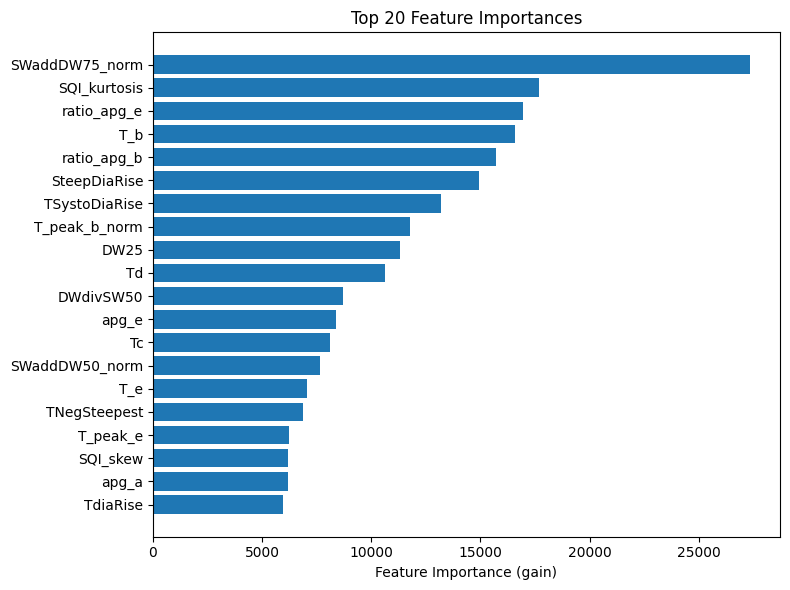

F1 Score: 0.6263
Accuracy: 0.6858
Confusion Matrix:
[[48921  6932]
 [21408 12936]]

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.88      0.78     55853
           1       0.65      0.38      0.48     34344

    accuracy                           0.69     90197
   macro avg       0.67      0.63      0.63     90197
weighted avg       0.68      0.69      0.66     90197



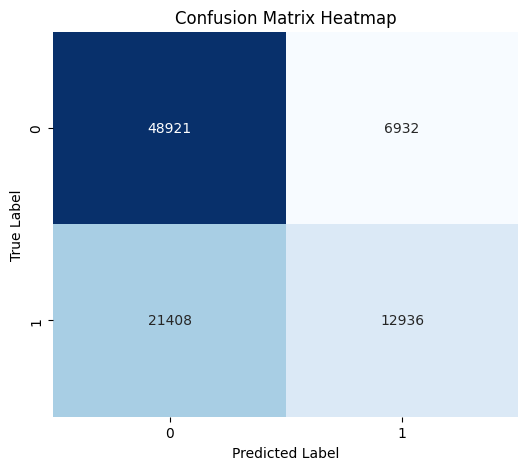

In [ ]:
# train lightgbm
# --- LightGBM データセットに変換 ---
weights = compute_sample_weight(class_weight='balanced', y=train_Y)
lgb_train = lgb.Dataset(train_X, label=train_Y, weight=weights)
from sklearn.metrics import f1_score
# lgb_train = lgb.Dataset(train_X, label=train_Y)
lgb_test = lgb.Dataset(test_X, label=test_Y, reference=lgb_train)
# --- ハイパーパラメータ設定 ---
params = {
    'objective': 'binary',
    'metric': 'binary_error',
    'boosting_type': 'gbdt',
    'learning_rate': 0.05,
    "min_data_in_leaf": 200,
    'num_leaves': 31,
    'max_depth': -1,
    'verbose': -1,
    'random_state': 42,
    "num_threads": 8,
}
if test_Y.ndim>1:
    # softlabel
    params['objective'] = 'cross_entropy'
    params['metric'] = 'cross_entropy'
    params['num_class'] =1
elif test_Y.nunique() > 2:
    params['objective'] = 'multiclass'
    params['metric'] = 'multi_error'
    params['num_class'] = test_Y.nunique()
# --- モデル学習 ---
model = lgb.train(
    params,
    lgb_train,
    valid_sets=[lgb_train, lgb_test],
    valid_names=['train', 'test'],
    num_boost_round=2000,
    callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=100)],
)

# --- 予測 ---
y_pred_prob = model.predict(test_X, num_iteration=model.best_iteration)
y_pred = np.argmax(y_pred_prob, axis=1) if test_Y.nunique() > 2 else (y_pred_prob >= 0.5).astype(int)

# --- 評価 ---
acc = accuracy_score(test_Y, y_pred)
cm = confusion_matrix(test_Y, y_pred)
f1 = f1_score(test_Y, y_pred,average='macro')
# --- Feature Importance ---
importance_df = pd.DataFrame({
    'feature': train_X.columns,
    'importance': model.feature_importance(importance_type='gain')
}).sort_values(by='importance', ascending=False)

print("\nTop 10 important features:")
print(importance_df.head(10))

# --- 可視化 ---
plt.figure(figsize=(8, 6))
plt.barh(importance_df['feature'][:20][::-1], importance_df['importance'][:20][::-1])
plt.xlabel("Feature Importance (gain)")
plt.title("Top 20 Feature Importances")
plt.tight_layout()
plt.show()
print(f"F1 Score: {f1:.4f}")
print(f"Accuracy: {acc:.4f}")
print("Confusion Matrix:")
print(cm)
print("\nClassification Report:")
print(classification_report(test_Y, y_pred))
# print confusion matrix as heatmap
import seaborn as sns
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix Heatmap")
plt.show()  

In [93]:
importance_df['feature'][:10][::-1]

9      SteepDiaRise
87         T_peak_e
77              T_e
75              T_c
74              T_b
81         T_d_norm
23        DW25_norm
59            apg_e
10    TSystoDiaRise
53         SQI_skew
Name: feature, dtype: object

In [11]:
plt.figure(figsize=(6, 3))
plt.barh(importance_df['feature'][:10][::-1], importance_df['importance'][:10][::-1])
plt.xlabel("Feature Importance (gain)")
# plt.title("Top 20 Feature Importances")
plt.tight_layout()
plt.show()
print(f"F1 Score: {f1:.4f}")
print(f"Accuracy: {acc:.4f}")
print("Confusion Matrix:")
print(cm)
print("\nClassification Report:")
print(classification_report(test_Y, y_pred))
# print confusion matrix as heatmap
import seaborn as sns
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix Heatmap")
plt.show()  

KeyError: 'importance'

<Figure size 600x300 with 0 Axes>

In [35]:
def plot_cm(test,pred):
    cm = confusion_matrix(test, pred)
    print("Confusion Matrix:")
    print(cm)
    print("\nClassification Report:")
    print(classification_report(test, pred))
    # print confusion matrix as heatmap
    import seaborn as sns
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix Heatmap")
    plt.show() 

In [32]:
test_Y.shape,y_pred_prob.shape

((22314,), (22314,))

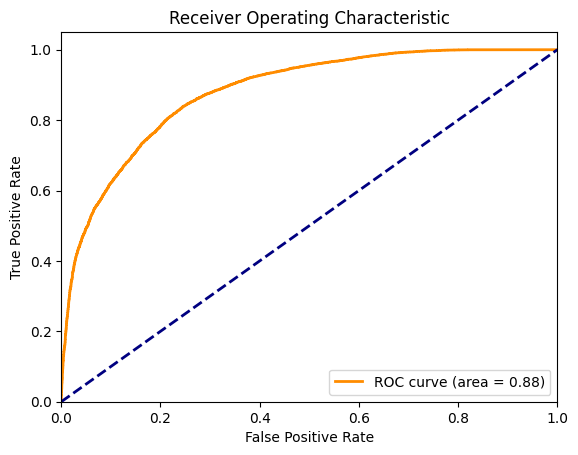

In [33]:
# roc curve
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(test_Y, y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])    
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


### 出力確率

[ 70  75  80  85  90  95 100 105 110 115 120 125 130 135 140 145 150 155
 160 165] [0.76923077 0.8110687  0.83454399 0.79562567 0.80850131 0.72746675
 0.67754143 0.62106538 0.58308873 0.53512421 0.53800616 0.59488735
 0.62550314 0.69108222 0.74142418 0.77035426 0.79850746 0.81694313
 0.82486865] [0.31848133 0.27206338 0.26843758 0.31038762 0.32119937 0.3661932
 0.39704567 0.43282224 0.44948198 0.48249439 0.52082366 0.54944816
 0.5656155  0.60636189 0.63734994 0.64983057 0.66750372 0.67266317
 0.68307523] [0.68151867 0.72793662 0.73156242 0.68961238 0.67880063 0.6338068
 0.60295433 0.56717776 0.55051802 0.51750561 0.47917634 0.45055184
 0.4343845  0.39363811 0.36265006 0.35016943 0.33249628 0.32733683
 0.31692477]


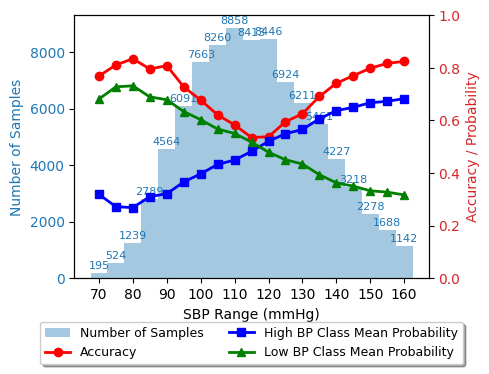

In [67]:
import matplotlib.pyplot as plt
import numpy as np
sbp = test_df['sbp'].values
result1 = results[3]["pred_test_prob"]
predicted1 = results[3]["pred_test"]
true = test_Y.values
bin = np.arange(70, 170, 5)  # SBPの範囲に合わせてビンを設定
length = len(bin)-1
accuracy = np.zeros(length)
num_samples = np.zeros(length)
num_correct = np.zeros(length)
predict_proba_mean_0 = np.zeros(length)
predict_proba_mean_1 = np.zeros(length) 
for i in range(length):
    idx = (sbp >= bin[i]) & (sbp < bin[i+1])
    accuracy[i] = np.sum(predicted1[idx] == true[idx]) / np.sum(idx)
    num_samples[i] = np.sum(idx)
    num_correct[i] = np.sum(predicted1[idx] == true[idx])
    predict_proba_mean_0[i] = np.mean(result1[idx])
    predict_proba_mean_1[i] = 1-np.mean(result1[idx])
    
fig = plt.figure(figsize=(5, 4))
ax1 = fig.add_subplot(111)
# ax1.set_title('SBP Classification Accuracy by Range')
ax1.set_xlabel('SBP Range (mmHg)')
ax1.set_ylabel('Number of Samples', color='tab:blue')
# サンプル数バー
bars = ax1.bar(bin[:-1], num_samples, width=5, alpha=0.4, color='tab:blue', label='Number of Samples', zorder=2)
for i, v in enumerate(num_samples):
    if v > 0:
        ax1.text(bin[i], v + max(num_samples)*0.009, str(int(v)), ha='center', va='bottom', fontsize=8, color='tab:blue', zorder=4)
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_xticks(bin[::2])



# 右y軸：精度と確率
ax2 = ax1.twinx()
ax2.set_ylabel('Accuracy / Probability', color='tab:red')

ax2.plot(bin[:-1], accuracy, marker='o', color='red', label='Accuracy', linewidth=2, markersize=6, zorder=5)
ax2.plot(bin[:-1], predict_proba_mean_0, marker='s', color='blue', label='High BP Class Mean Probability', linewidth=2, markersize=6, zorder=5)
ax2.plot(bin[:-1], predict_proba_mean_1, marker='^', color='green', label='Low BP Class Mean Probability', linewidth=2, markersize=6, zorder=5)

ax2.tick_params(axis='y', labelcolor='tab:red')
ax2.set_ylim(0, 1.0)  # adjust as needed

# 凡例を下中央に
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='lower center', bbox_to_anchor=(0.5, -0.35), ncol=2, fontsize=9, frameon=True, fancybox=True, shadow=True)
print(bin,accuracy, predict_proba_mean_0,predict_proba_mean_1)
fig.tight_layout()
plt.show()


###  Confident / Uncertain sample

In [34]:
CL = np.where(y_pred_prob < 0.1)[0]
CH = np.where(y_pred_prob > 0.9)[0]
U = np.where((y_pred_prob >= 0.4) & (y_pred_prob <= 0.6))[0]
len(CL), len(CH), len(U)

(3532, 4047, 3232)

In [39]:
len(test_Y)

22314

Confusion Matrix:
[[   0  163]
 [   0 3884]]

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       163
           1       0.96      1.00      0.98      3884

    accuracy                           0.96      4047
   macro avg       0.48      0.50      0.49      4047
weighted avg       0.92      0.96      0.94      4047



f:\minowa\BloodPressureEstimation\.venv\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
f:\minowa\BloodPressureEstimation\.venv\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
f:\minowa\BloodPressureEstimation\.venv\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


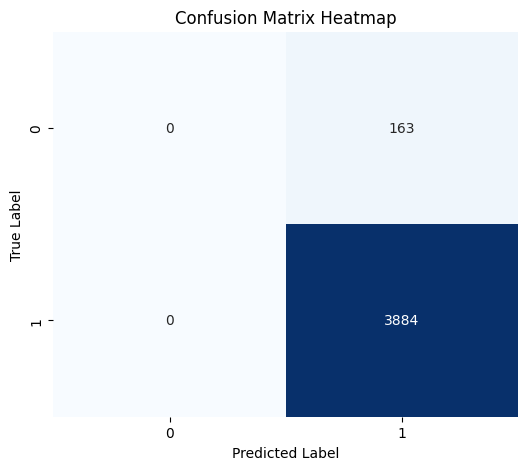

Confusion Matrix:
[[3368    0]
 [ 164    0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.98      3368
           1       0.00      0.00      0.00       164

    accuracy                           0.95      3532
   macro avg       0.48      0.50      0.49      3532
weighted avg       0.91      0.95      0.93      3532



f:\minowa\BloodPressureEstimation\.venv\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
f:\minowa\BloodPressureEstimation\.venv\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
f:\minowa\BloodPressureEstimation\.venv\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


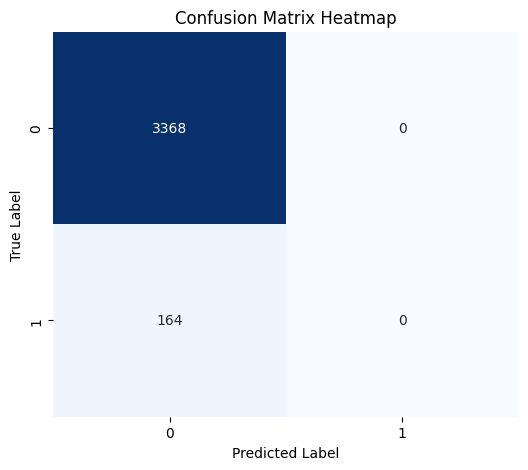

Confusion Matrix:
[[ 825  639]
 [ 710 1058]]

Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.56      0.55      1464
           1       0.62      0.60      0.61      1768

    accuracy                           0.58      3232
   macro avg       0.58      0.58      0.58      3232
weighted avg       0.58      0.58      0.58      3232



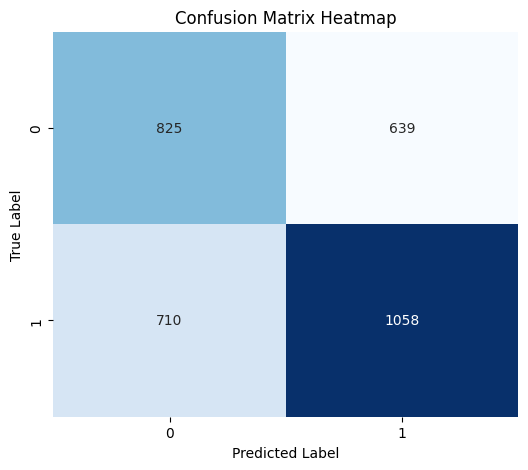

In [40]:
plot_cm(test_Y.iloc[CH], y_pred[CH])
plot_cm(test_Y.iloc[CL], y_pred[CL])
plot_cm(test_Y.iloc[U], y_pred[U])

In [42]:
## uncertain samples analysis
correct = np.where(y_pred[U]==test_Y.iloc[U])[0]
incorrect = np.where(y_pred[U]!=test_Y.iloc[U])[0]
len(correct), len(incorrect)

(1883, 1349)

In [63]:
df= pd.DataFrame(test_df[test_df['sbp_class'] != 1].iloc[U].iloc[incorrect].mean(), columns=['incorrect'])
df["correct"] = pd.DataFrame(test_df[test_df['sbp_class'] != 1].iloc[U].iloc[correct].mean(), columns=['correct'])
df["diff"] = df["incorrect"] - df["correct"]

In [64]:
with pd.option_context(
    'display.max_rows', None,
    'display.max_columns', None,
    'display.max_colwidth', None
):
    print(df)

                       incorrect       correct         diff
Tc                      0.754194      0.740010     0.014185
Ts                      0.209681      0.206826     0.002854
Td                      0.544513      0.533183     0.011330
Tsteepest               0.116936      0.114262     0.002674
Steepest                0.062789      0.063268    -0.000480
TNegSteepest            0.279921      0.277919     0.002002
NegSteepest            -0.034203     -0.034179    -0.000024
TdiaRise                0.432833      0.429285     0.003547
DiaRise                 0.333848      0.329879     0.003969
SteepDiaRise           -0.006694     -0.007279     0.000585
TSystoDiaRise           0.223152      0.222459     0.000693
TdiaToEnd               0.321362      0.310724     0.010637
Ratio                   3.224528      3.295083    -0.070555
Ts_norm                 0.279259      0.279872    -0.000612
Td_norm                 0.720741      0.720128     0.000612
Tsteepest_norm          0.152928      0.

In [65]:
df= pd.DataFrame(test_df[test_df['sbp_class'] != 1].iloc[CL].iloc[incorrect].mean(), columns=['incorrect'])
df["correct"] = pd.DataFrame(test_df[test_df['sbp_class'] != 1].iloc[CL].iloc[correct].mean(), columns=['correct'])
df["diff"] = df["incorrect"] - df["correct"]
with pd.option_context(
    'display.max_rows', None,
    'display.max_columns', None,
    'display.max_colwidth', None
):
    print(df)

                       incorrect       correct        diff
Tc                      0.938040      0.936992    0.001048
Ts                      0.344443      0.344591   -0.000148
Td                      0.593597      0.592401    0.001195
Tsteepest               0.259851      0.260136   -0.000285
Steepest                0.066469      0.066508   -0.000040
TNegSteepest            0.417419      0.417221    0.000198
NegSteepest            -0.042601     -0.042410   -0.000191
TdiaRise                0.592662      0.592389    0.000273
DiaRise                 0.219960      0.220397   -0.000437
SteepDiaRise           -0.010253     -0.009844   -0.000408
TSystoDiaRise           0.248219      0.247798    0.000421
TdiaToEnd               0.345377      0.344603    0.000775
Ratio                   5.682353      5.724233   -0.041880
Ts_norm                 0.373950      0.373777    0.000173
Td_norm                 0.626050      0.626223   -0.000173
Tsteepest_norm          0.280670      0.280920   -0.0002

In [67]:
df= pd.DataFrame(test_df[test_df['sbp_class'] != 1].iloc[CH].iloc[incorrect].mean(), columns=['incorrect'])
df["correct"] = pd.DataFrame(test_df[test_df['sbp_class'] != 1].iloc[CH].iloc[correct].mean(), columns=['correct'])
df["diff"] = df["incorrect"] - df["correct"]
with pd.option_context(
    'display.max_rows', None,
    'display.max_columns', None,
    'display.max_colwidth', None
):
    print(df)

                       incorrect       correct         diff
Tc                      0.796251      0.788525     0.007726
Ts                      0.212210      0.206099     0.006111
Td                      0.584041      0.582426     0.001615
Tsteepest               0.105570      0.100499     0.005071
Steepest                0.066051      0.066833    -0.000783
TNegSteepest            0.297555      0.290701     0.006854
NegSteepest            -0.031597     -0.031539    -0.000058
TdiaRise                0.439940      0.433976     0.005964
DiaRise                 0.377817      0.375919     0.001898
SteepDiaRise           -0.006262     -0.006356     0.000094
TSystoDiaRise           0.227730      0.227877    -0.000147
TdiaToEnd               0.356311      0.354549     0.001762
Ratio                   2.830085      2.860705    -0.030620
Ts_norm                 0.265951      0.262216     0.003735
Td_norm                 0.734049      0.737784    -0.003735
Tsteepest_norm          0.130881      0.

### shap

1. 特徴量の重要度（縦方向）

上にある特徴ほど重要
→ 予測に強く効いている特徴。

下にあるほどほぼ効いてない。

📌 重要度は「SHAP の絶対値」の平均から計算される
（モデルの重みとは違う → 非線形モデルでも OK）

2. 色（赤/青）は特徴量の値

赤い点 → そのサンプルではその特徴量が大きい

青い点 → 小さい

例：
赤い点が右側にある → 「高い値のとき予測を上げている」
青い点が左側にある → 「低い値のとき予測を下げている」

3. 横方向（SHAP 値）＝予測への寄与度

右（+）→ 予測をクラス1側へ押す

左（−）→ 予測をクラス0側へ押す

In [85]:
train_X.shape

(358014, 98)

In [ ]:
random_idx = np.random.choice(train_X.index, size=50000, replace=False)
randomized_X = train_X.iloc[random_idx]
randomized_X.shape

IndexError: positional indexers are out-of-bounds

In [82]:
import shap
explainer = shap.TreeExplainer(model)


f:\minowa\BloodPressureEstimation\.venv\lib\site-packages\shap\explainers\_tree.py:586: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


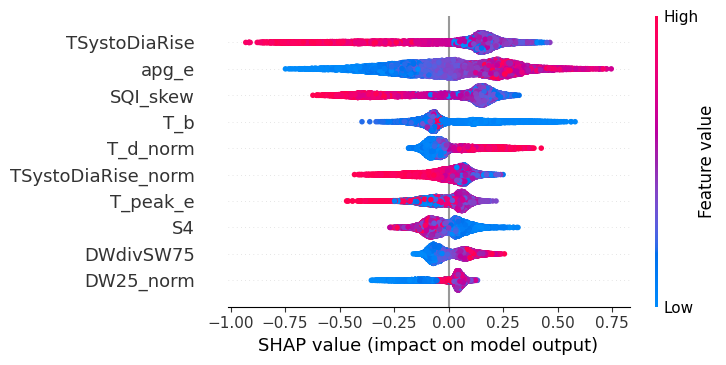

In [92]:
shap_values = explainer.shap_values(train_X[::20])
shap.summary_plot(shap_values, train_X[::20],max_display=10,plot_size=(7.5,3.75))

f:\minowa\BloodPressureEstimation\.venv\lib\site-packages\shap\explainers\_tree.py:586: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


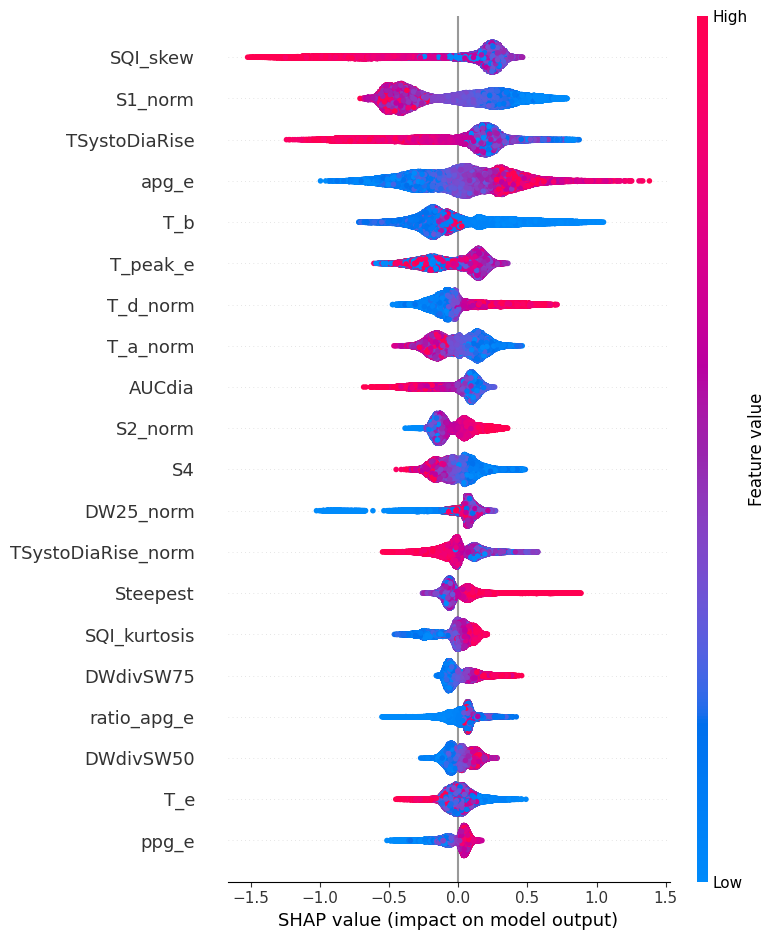

In [199]:
shap_values_test = explainer.shap_values(test_X)
shap.summary_plot(shap_values_test, test_X)

f:\minowa\BloodPressureEstimation\.venv\lib\site-packages\shap\explainers\_tree.py:586: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


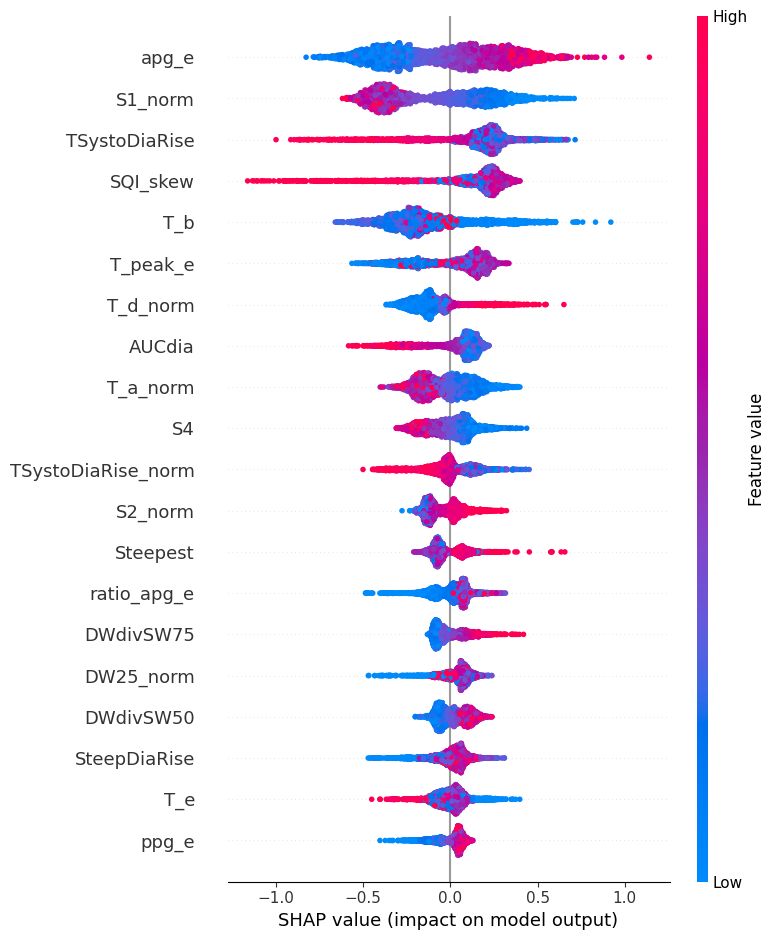

In [94]:
shap_values_test_U = explainer.shap_values(test_X.iloc[U])
shap.summary_plot(shap_values_test_U, test_X.iloc[U])

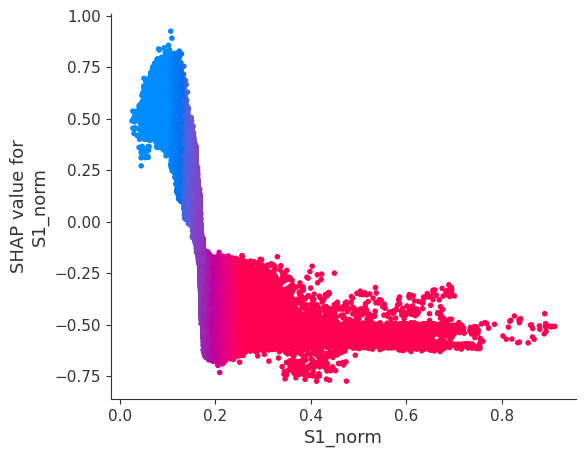

In [76]:
shap.dependence_plot("S1_norm", shap_values, train_X,interaction_index="S1_norm")

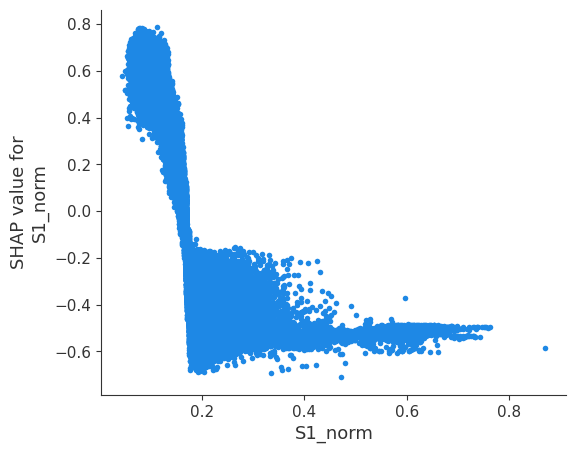

In [201]:
shap.dependence_plot("S1_norm", shap_values_test, test_X,interaction_index=None)

In [89]:
from IPython.display import HTML

In [82]:
shap.initjs()

basevalue:全体平均  
f(x): このサンプルの予測


In [100]:
i=U[np.random.randint(len(U))]
print(i)
print(test_Y.iloc[i],model.predict(test_X.iloc[i].values.reshape(1,-1)))
force_plot = shap.force_plot(
    explainer.expected_value,
    shap_values_test[i],
    test_X.iloc[i]
)
HTML(f"<div style='background-color:white;'>{shap.getjs() + force_plot.html()}</div>")

19467
1 [0.45805598]


### 間違った答えで悪影響なのは何？
 -  0->1
 -  1->0


In [101]:
U_0to1_incorrect = U[(test_Y.iloc[U]==0) & (y_pred[U]==1)]
U_1to0_incorrect = U[(test_Y.iloc[U]==1) & (y_pred[U]==0)]
U_0_correct = U[(test_Y.iloc[U]==0) & (y_pred[U]==0)]
U_1_correct = U[(test_Y.iloc[U]==1) & (y_pred[U]==1)]
print(len(U_0to1_incorrect), len(U_1to0_incorrect), len(U_0_correct), len(U_1_correct))

639 710 825 1058


In [163]:
test_0_correct = np.where((test_Y==0) & (y_pred==0))[0]
test_1_correct = np.where((test_Y==1) & (y_pred==1))[0]
test_0to1_incorrect = np.where((test_Y==0) & (y_pred==1))[0]
test_1to0_incorrect = np.where((test_Y==1) & (y_pred==0))[0]

In [102]:
force_plot = shap.force_plot(
    explainer.expected_value,
    shap_values_test[U_0to1_incorrect],
    test_X.iloc[U_0to1_incorrect]
)
HTML(f"<div style='background-color:white;'>{shap.getjs() + force_plot.html()}</div>")

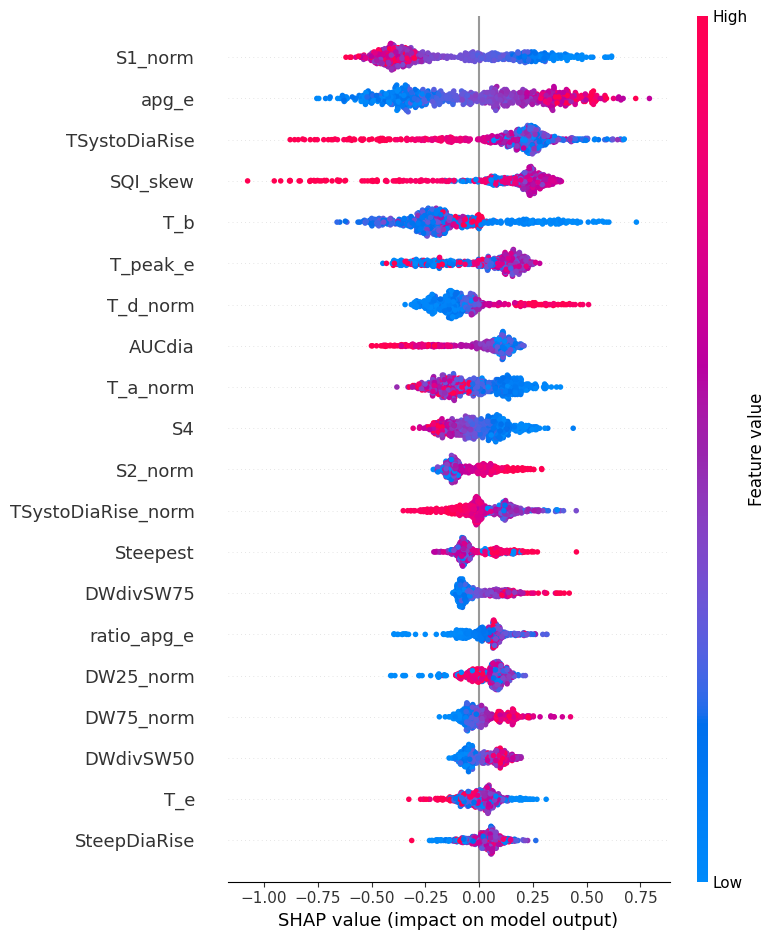

In [105]:
shap.summary_plot(shap_values_test[U_0to1_incorrect], test_X.iloc[U_0to1_incorrect])

In [124]:
from scipy.stats import ttest_ind

In [192]:
import pandas as pd

# 誤分類と正解の平均 SHAP 値
shap_mean_mis = np.mean(shap_values_test[test_0to1_incorrect], axis=0)
shap_mean_correct = np.mean(shap_values_test[test_0_correct], axis=0)

# 差の絶対値が大きい順に並べる
shap_diff = np.abs(shap_mean_mis - shap_mean_correct)
feature_names = test_X.columns
print(len(feature_names), len(shap_diff),len(shap_mean_mis), len(shap_mean_correct))
df_diff = pd.DataFrame({
    'feature': feature_names,
    'shap_diff': shap_diff,
    'shap_mean_mis': shap_mean_mis,
    'shap_mean_correct': shap_mean_correct
}).sort_values('shap_diff', ascending=False)
pvals = []
for i, col in enumerate(feature_names):
    t, p = ttest_ind(shap_values_test[test_0to1_incorrect, i],
                      shap_values_test[test_0_correct, i],
                      equal_var=False)
    pvals.append(p)

df_diff['pval'] = pvals
df_diff["is_significant"] = df_diff['pval'] < 0.05  

98 98 98 98


 correct -> neg incorrect -> pos

In [168]:
df_diff.head(10)

,feature,shap_diff,shap_mean_mis,shap_mean_correct,pval,is_significant
53,SQI_skew,0.465687,0.134420,-0.331267,8.212805e-20,True
47,S1_norm,0.404682,0.055661,-0.349021,6.212490e-01,False
10,TSystoDiaRise,0.272587,0.104221,-0.168366,1.596245e-71,True
23,DW25_norm,0.159813,0.050914,-0.108899,5.729452e-92,True
48,S2_norm,0.141245,0.017839,-0.123405,5.364944e-26,True
87,T_peak_e,0.135300,0.023318,-0.111982,4.309443e-02,True
59,apg_e,0.120168,0.044615,-0.075552,7.839912e-01,False
78,T_a_norm,0.112698,0.033242,-0.079456,7.962480e-277,True
54,SQI_kurtosis,0.109777,0.033618,-0.076159,6.231945e-114,True
64,ppg_e,0.083718,0.005066,-0.078652,3.955653e-197,True


In [189]:
# 誤分類と正解の平均 SHAP 値
shap_mean_mis = np.mean(shap_values_test[test_1to0_incorrect], axis=0)
shap_mean_correct = np.mean(shap_values_test[test_1_correct], axis=0)

# 差の絶対値が大きい順に並べる
shap_diff = np.abs(shap_mean_mis - shap_mean_correct)
feature_names = test_X.columns
df_diff = pd.DataFrame({
    'feature': feature_names,
    'shap_diff': shap_diff,
    'shap_mean_mis': shap_mean_mis,
    'shap_mean_correct': shap_mean_correct
}).sort_values('shap_diff', ascending=False)
pvals = []
for i, col in enumerate(feature_names):
    t, p = ttest_ind(shap_values_test[test_1to0_incorrect, i],
                      shap_values_test[test_1_correct, i],
                      equal_var=False)
    pvals.append(p)

df_diff['pval'] = pvals
df_diff["is_significant"] = df_diff['pval'] < 0.05  
df_diff.head(10)

,feature,shap_diff,shap_mean_mis,shap_mean_correct,pval,is_significant
47,S1_norm,0.399590,-0.222197,0.177393,2.088709e-02,True
53,SQI_skew,0.357172,-0.152784,0.204388,6.715192e-01,False
74,T_b,0.235800,-0.090625,0.145175,3.213872e-02,True
10,TSystoDiaRise,0.140692,-0.019123,0.121569,2.079599e-170,True
78,T_a_norm,0.139864,-0.061378,0.078487,5.568131e-42,True
48,S2_norm,0.132294,-0.076007,0.056287,3.809326e-10,True
81,T_d_norm,0.113696,-0.091057,0.022639,2.984545e-28,True
59,apg_e,0.112859,-0.037830,0.075029,1.588068e-153,True
87,T_peak_e,0.093492,-0.013318,0.080173,3.096526e-79,True
54,SQI_kurtosis,0.090282,-0.037567,0.052715,2.383202e-41,True


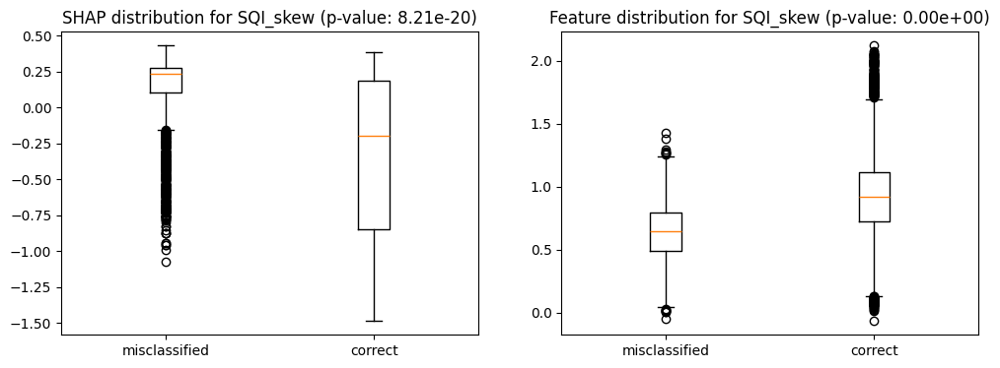

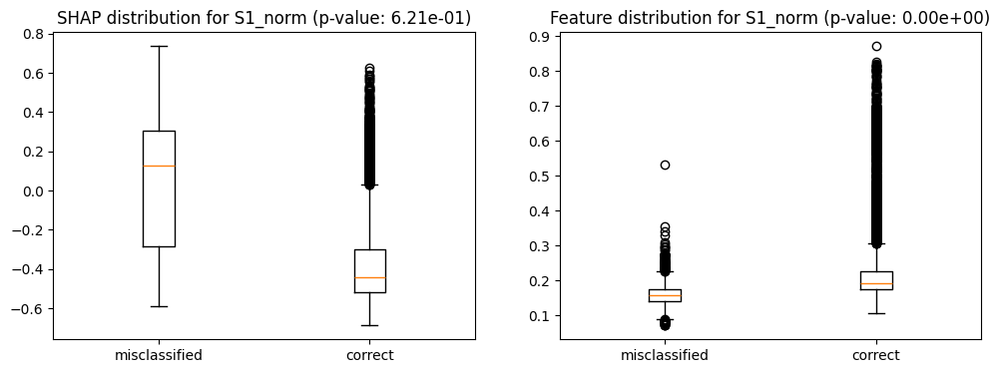

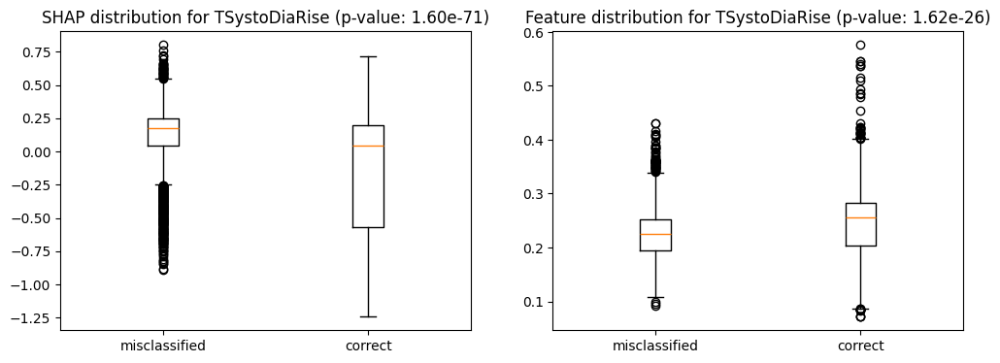

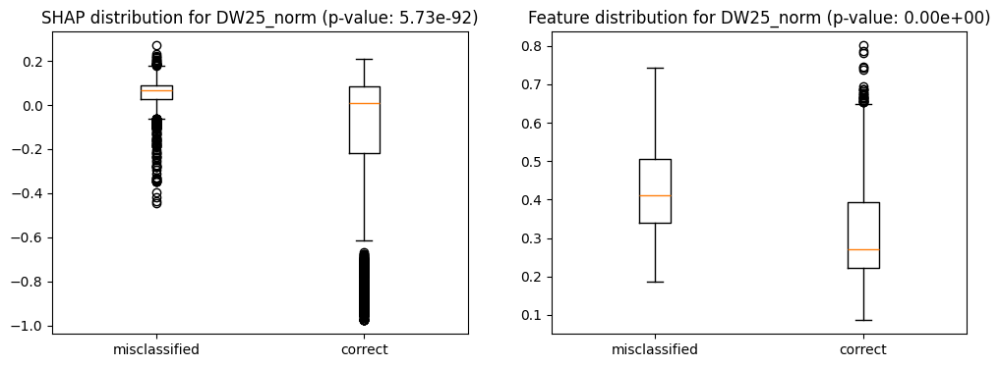

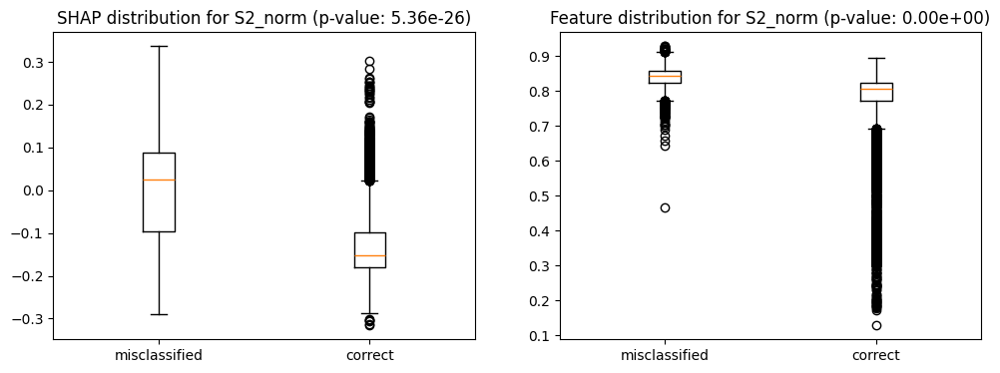

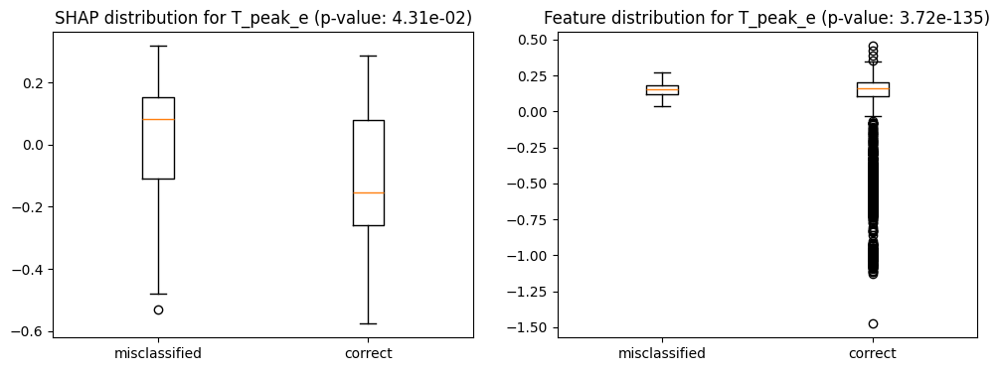

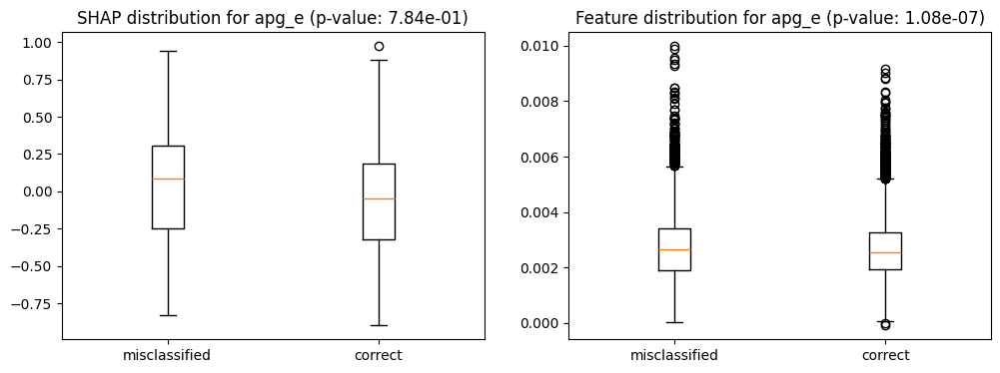

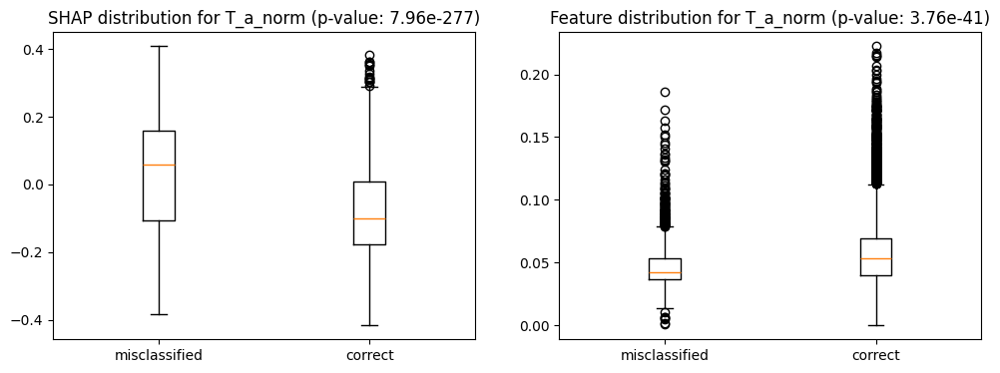

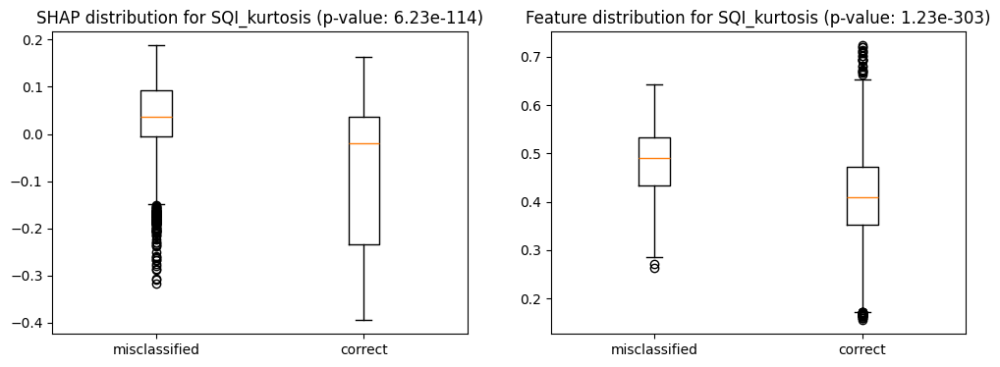

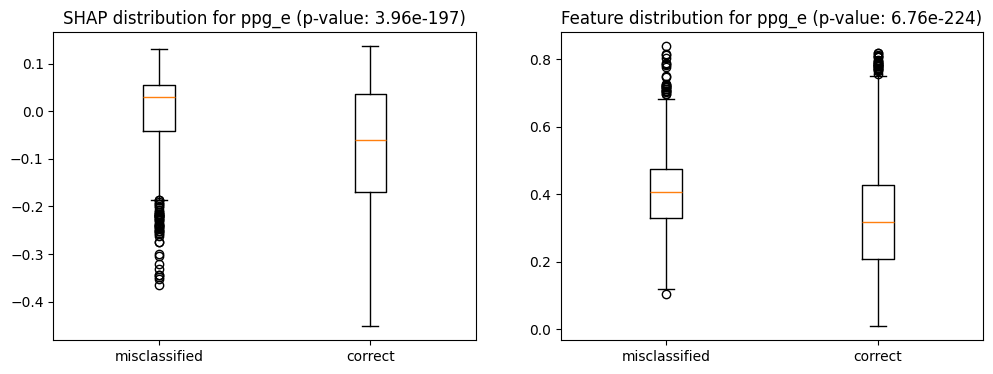

In [195]:
import matplotlib.pyplot as plt

top_features = df_diff.head(10)['feature']

# 誤分類 vs 正解の SHAP 比較
# plt.figure(figsize=(10,6))
for f in top_features:
    plt.figure(figsize=(12,4))
    plt.subplot(1, 2, 1)
    i = test_X.columns.get_loc(f)
    plt.boxplot([shap_values_test[test_0to1_incorrect, i],
                 shap_values_test[test_0_correct, i]],
                labels=['misclassified', 'correct'])
    plt.title(f'SHAP distribution for {f} (p-value: {df_diff[df_diff["feature"]==f]["pval"].values[0]:.2e})')
    plt.subplot(1, 2, 2)
    t, p = ttest_ind(test_X.iloc[test_0to1_incorrect, i],
                      test_X.iloc[test_0_correct, i],
                    equal_var=False)
    plt.boxplot([test_X.iloc[test_0to1_incorrect, i],
                 test_X.iloc[test_0_correct, i]],
                labels=['misclassified', 'correct'])
    plt.title(f'Feature distribution for {f} (p-value: {p:.2e})')


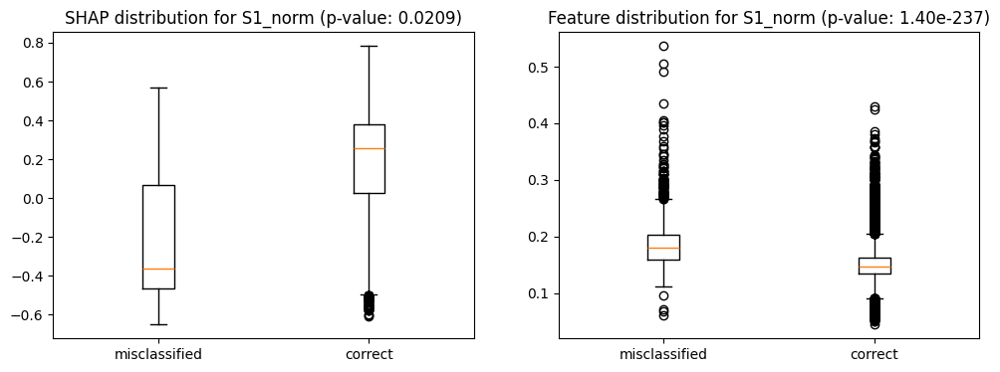

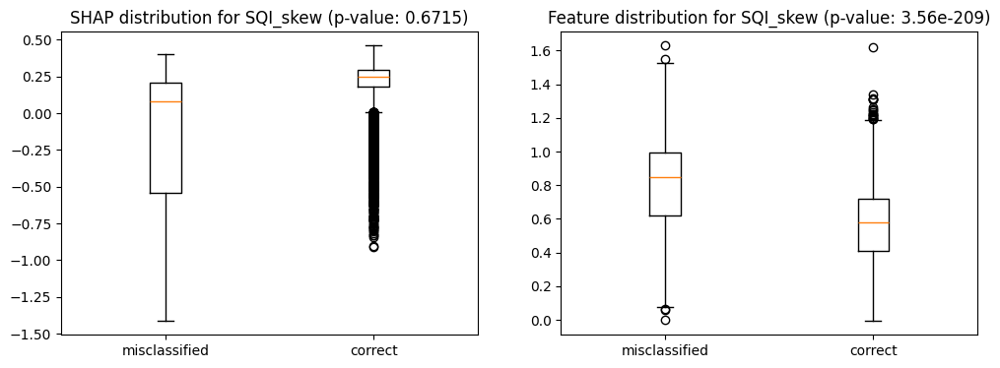

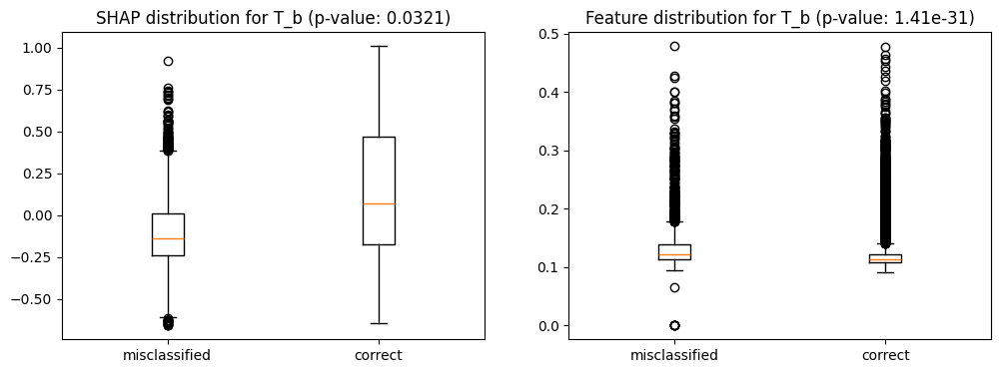

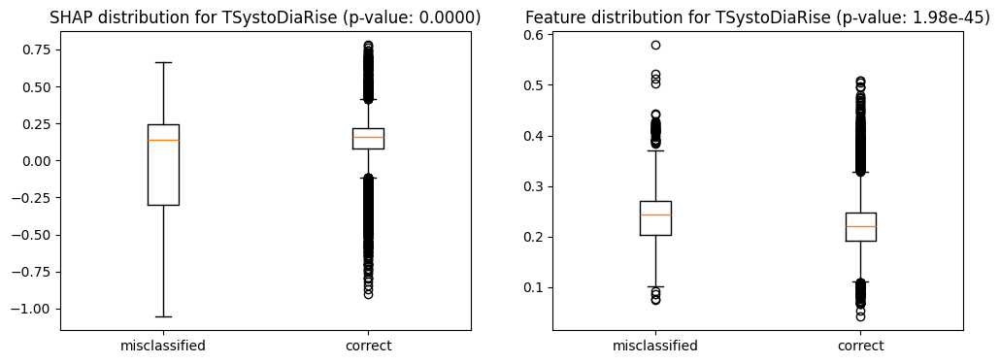

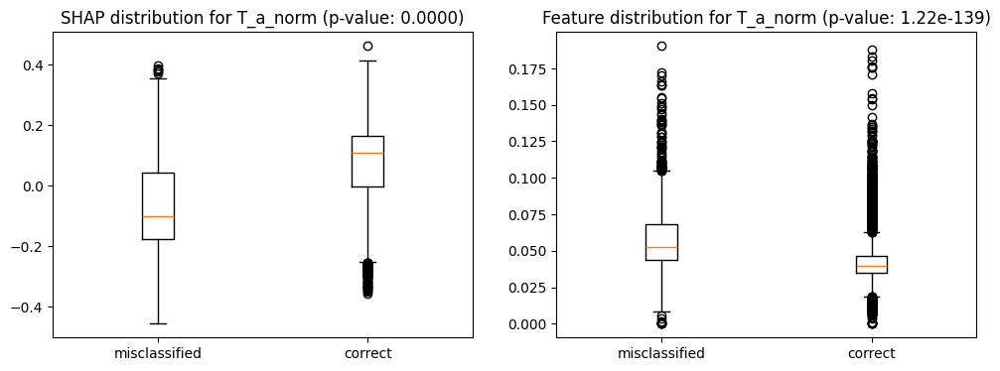

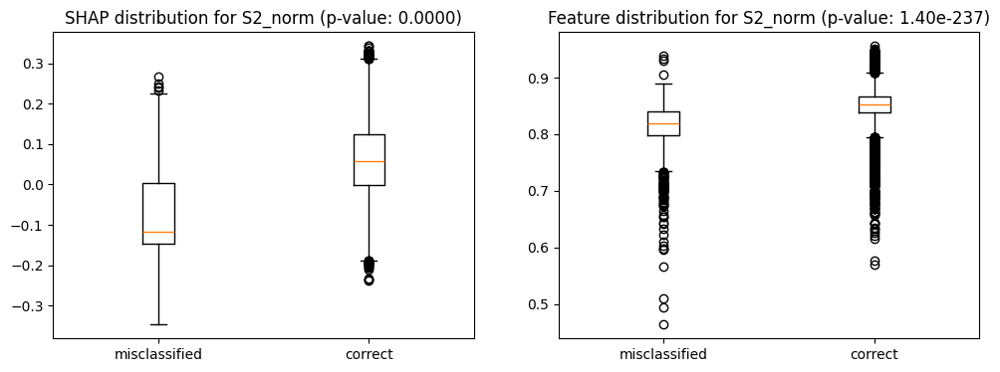

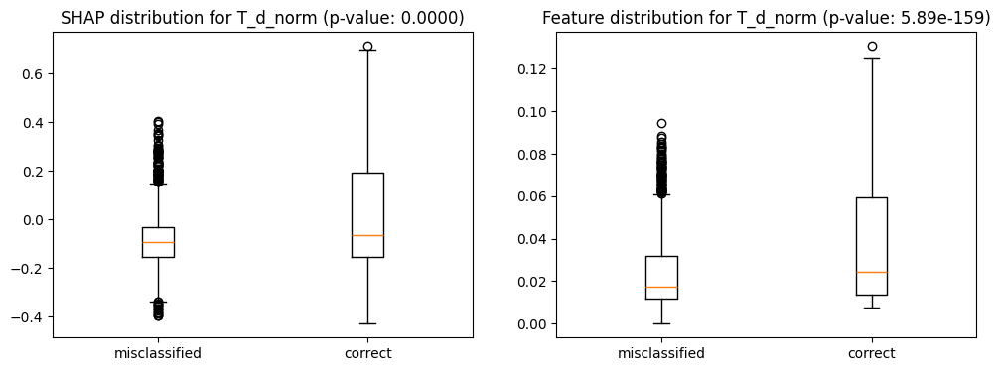

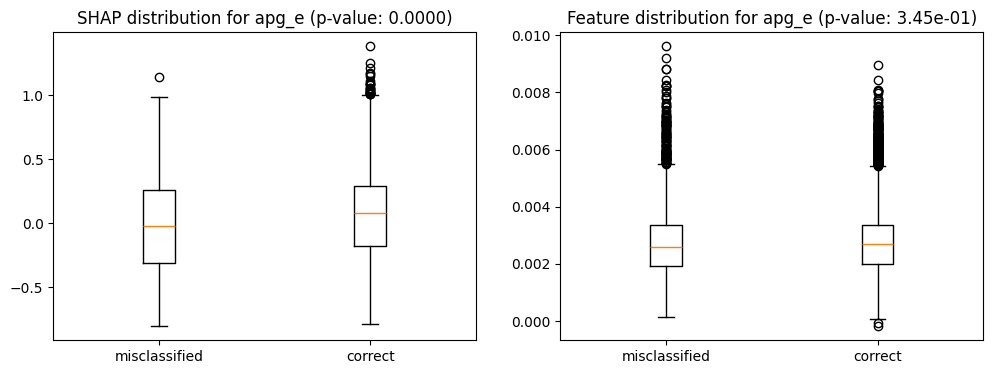

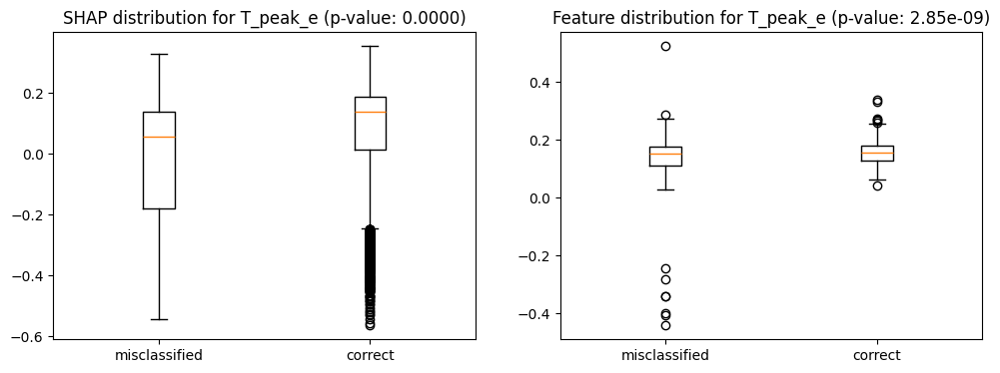

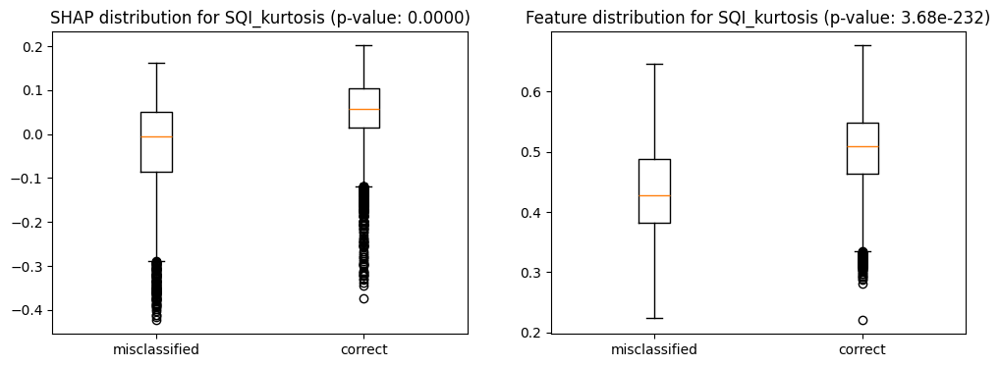

In [188]:
top_features = df_diff.head(10)['feature']
for f in top_features:
    plt.figure(figsize=(12,4))
    plt.subplot(1, 2, 1)
    i = test_X.columns.get_loc(f)
    plt.boxplot([shap_values_test[test_1to0_incorrect, i],
                 shap_values_test[test_1_correct, i]],
                labels=['misclassified', 'correct'])
    plt.title(f'SHAP distribution for {f} (p-value: {df_diff[df_diff["feature"]==f]["pval"].values[0]:.4f})')
    plt.subplot(1, 2, 2)
    t, p = ttest_ind(test_X.iloc[test_1to0_incorrect, i],
                      test_X.iloc[test_1_correct, i],
                    equal_var=False)
    plt.boxplot([test_X.iloc[test_1to0_incorrect, i],
                 test_X.iloc[test_1_correct, i]],
                labels=['misclassified', 'correct'])
    plt.title(f'Feature distribution for {f} (p-value: {p:.2e})')

# 回帰

In [6]:
from sklearn.preprocessing import StandardScaler
train_Y = train_df['sbp']
train_X = train_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1,errors='ignore')
test_Y = test_df['sbp']
test_X = test_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1,errors='ignore')
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_X)
X_test_scaled = scaler.transform(test_X)
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(train_Y.values.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(test_Y.values.reshape(-1, 1)).ravel()
model = lgb.LGBMRegressor(random_state=42,n_estimators=2000,verbose=-1)
model.fit(X_train_scaled, y_train_scaled,   callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=100)],eval_set=[(X_test_scaled, y_test_scaled)],
          eval_metric="mae")
from sklearn.metrics import mean_squared_error, mean_absolute_error
y_pred_scaled = model.predict(X_test_scaled)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
mse = mean_squared_error(test_Y, y_pred)
mae = mean_absolute_error(test_Y, y_pred)   
me = (test_Y - y_pred).mean()
std = (test_Y - y_pred).std()

print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, ME: {me:.4f}, STD: {std:.4f}")

Training until validation scores don't improve for 50 rounds
[100]	valid_0's l1: 0.644793	valid_0's l2: 0.648553
[200]	valid_0's l1: 0.638967	valid_0's l2: 0.641701
[300]	valid_0's l1: 0.636813	valid_0's l2: 0.64007
Early stopping, best iteration is:
[311]	valid_0's l1: 0.636197	valid_0's l2: 0.639292
MSE: 426.3859, MAE: 16.4302, ME: 0.7817, STD: 20.6345


In [262]:
test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\test_features.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')  
test_Y = test_df['sbp']
test_X = test_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1, errors='ignore')
X_test_scaled = scaler.transform(test_X)
y_test_scaled = scaler_y.transform(test_Y.values.reshape(-1, 1)).ravel()
y_pred_scaled = model.predict(X_test_scaled)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
mse = mean_squared_error(test_Y, y_pred)
mae = mean_absolute_error(test_Y, y_pred)   
me = (test_Y - y_pred).mean()
std = (test_Y - y_pred).std()

print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, ME: {me:.4f}, STD: {std:.4f}")

ValueError: Found input variables with inconsistent numbers of samples: [54892, 164676]

In [23]:
train_Y = train_df['dbp']
test_Y = test_df['dbp']
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_X)
test_X = test_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1, errors='ignore')
X_test_scaled = scaler.transform(test_X)
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(train_Y.values.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(test_Y.values.reshape(-1, 1)).ravel()
model = lgb.LGBMRegressor(random_state=42,n_estimators=2000,verbose=-1)
model.fit(X_train_scaled, y_train_scaled,   callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=100)],eval_set=[(X_test_scaled, y_test_scaled)],
          eval_metric="mae")
y_pred_scaled = model.predict(X_test_scaled)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
mse = mean_squared_error(test_Y, y_pred)
mae = mean_absolute_error(test_Y, y_pred)   
me = (test_Y - y_pred).mean()
std = (test_Y - y_pred).std()

print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, ME: {me:.4f}, STD: {std:.4f}")

Training until validation scores don't improve for 50 rounds
[100]	valid_0's l1: 0.66174	valid_0's l2: 0.711187
[200]	valid_0's l1: 0.657492	valid_0's l2: 0.703897
Early stopping, best iteration is:
[208]	valid_0's l1: 0.657175	valid_0's l2: 0.703273
MSE: 142.0802, MAE: 9.3408, ME: 0.6888, STD: 11.9000


In [18]:
print(X_train_scaled.shape, y_train_scaled.shape,y_test_scaled.shape,X_test_scaled.shape)

(367391, 98) (367391,) (45389,) (87507, 98)


In [24]:
test_df = pd.read_csv(r'F:\minowa\BloodPressureEstimation\data\results\ppg_features_pulsedb_test_min180.csv',index_col=0  )
 
test_Y = test_df['dbp']
test_X = test_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1, errors='ignore')
X_test_scaled = scaler.transform(test_X)
y_test_scaled = scaler_y.transform(test_Y.values.reshape(-1, 1)).ravel()
y_pred_scaled = model.predict(X_test_scaled)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
mse = mean_squared_error(test_Y, y_pred)
mae = mean_absolute_error(test_Y, y_pred)   
me = (test_Y - y_pred).mean()
std = (test_Y - y_pred).std()

print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, ME: {me:.4f}, STD: {std:.4f}")

MSE: 120.8078, MAE: 8.5987, ME: -0.3234, STD: 10.9866


In [ ]:
train_Y = train_df['dbp']
test_Y = test_df['dbp']
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_X)
test_X = test_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1, errors='ignore')
X_test_scaled = scaler.transform(test_X)
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(train_Y.values.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(test_Y.values.reshape(-1, 1)).ravel()
model = lgb.LGBMRegressor(random_state=42,n_estimators=2000,verbose=-1)
model.fit(X_train_scaled, y_train_scaled,   callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=100)],eval_set=[(X_test_scaled, y_test_scaled)],
          eval_metric="mae")
y_pred_scaled = model.predict(X_test_scaled)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
mse = mean_squared_error(test_Y, y_pred)
mae = mean_absolute_error(test_Y, y_pred)   
me = (test_Y - y_pred).mean()
std = (test_Y - y_pred).std()

print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, ME: {me:.4f}, STD: {std:.4f}")

# もう一度分類

In [132]:
train_X = train_df[train_df['sbp_class'] != 1]
train_Y = train_X['sbp_class'] // 2 
train_X = train_X.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1)
test_X = test_df[test_df['sbp_class'] != 1]
test_Y = test_X['sbp_class'] // 2 
test_X = test_X.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class','sbp_bin'],axis=1)
train_X.shape, train_Y.shape

((184360, 98), (184360,))

In [134]:
remove_cols = ['T_b']
train_X = train_X.drop(columns=remove_cols, errors='ignore')
test_X = test_X.drop(columns=remove_cols, errors='ignore')
train_X.shape, test_Y.shape

((184360, 97), (22314,))

Training until validation scores don't improve for 50 rounds
[100]	train's binary_error: 0.174832	test's binary_error: 0.200233
Early stopping, best iteration is:
[117]	train's binary_error: 0.168876	test's binary_error: 0.198799

Top 10 important features:
          feature     importance
47        S1_norm  184726.773613
53       SQI_skew  118026.022442
48        S2_norm   78837.199455
10  TSystoDiaRise   75515.090618
59          apg_e   68173.881763
80       T_d_norm   44383.645809
23      DW25_norm   43453.006947
86       T_peak_e   36683.234188
77       T_a_norm   32079.439110
74            T_c   24393.420250


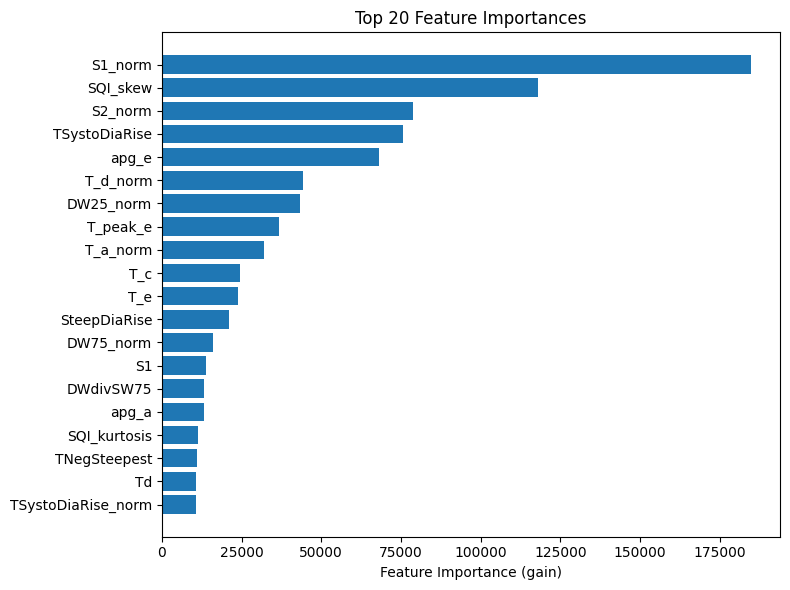

F1 Score: 0.7963
Accuracy: 0.8012
Confusion Matrix:
[[ 7206  2469]
 [ 1967 10672]]

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.74      0.76      9675
           1       0.81      0.84      0.83     12639

    accuracy                           0.80     22314
   macro avg       0.80      0.79      0.80     22314
weighted avg       0.80      0.80      0.80     22314



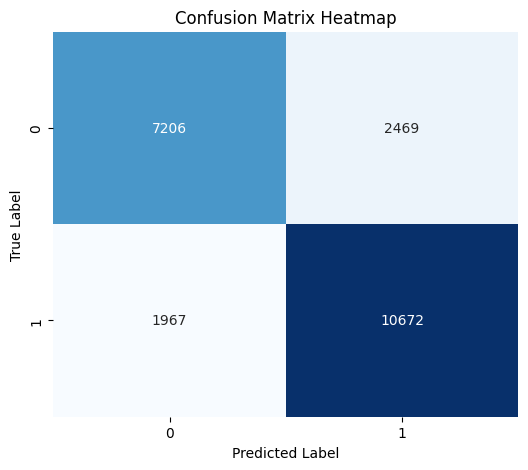

In [138]:
# train lightgbm
from sklearn.metrics import f1_score    
# --- LightGBM データセットに変換 ---
# weights = compute_sample_weight(class_weight='balanced', y=train_Y)
# lgb_train = lgb.Dataset(train_X, label=train_Y, weight=weights)

lgb_train = lgb.Dataset(train_X, label=train_Y)
lgb_test = lgb.Dataset(test_X, label=test_Y, reference=lgb_train)
# --- ハイパーパラメータ設定 ---
params = {
    'objective': 'binary',
    'metric': 'binary_error',
    'boosting_type': 'gbdt',
    'learning_rate': 0.05,
    "min_data_in_leaf": 200,
    'num_leaves': 31,
    'max_depth': -1,
    'verbose': -1,
    'random_state': 42,
}
if test_Y.ndim>1:
    # softlabel
    params['objective'] = 'cross_entropy'
    params['metric'] = 'cross_entropy'
    params['num_class'] =1
elif test_Y.nunique() > 2:
    params['objective'] = 'multiclass'
    params['metric'] = 'multi_error'
    params['num_class'] = test_Y.nunique()
# --- モデル学習 ---
model = lgb.train(
    params,
    lgb_train,
    valid_sets=[lgb_train, lgb_test],
    valid_names=['train', 'test'],
    num_boost_round=2000,
    callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=100)],
)

# --- 予測 ---
y_pred_prob = model.predict(test_X, num_iteration=model.best_iteration)
y_pred = np.argmax(y_pred_prob, axis=1) if test_Y.nunique() > 2 else (y_pred_prob >= 0.5).astype(int)

# --- 評価 ---
acc = accuracy_score(test_Y, y_pred)
cm = confusion_matrix(test_Y, y_pred)

# --- Feature Importance ---
importance_df = pd.DataFrame({
    'feature': train_X.columns,
    'importance': model.feature_importance(importance_type='gain')
}).sort_values(by='importance', ascending=False)

print("\nTop 10 important features:")
print(importance_df.head(10))

# --- 可視化 ---
plt.figure(figsize=(8, 6))
plt.barh(importance_df['feature'][:20][::-1], importance_df['importance'][:20][::-1])
plt.xlabel("Feature Importance (gain)")
plt.title("Top 20 Feature Importances")
plt.tight_layout()
plt.show()
print(f"F1 Score: {f1_score(test_Y, y_pred,average='macro'):.4f}")
print(f"Accuracy: {acc:.4f}")
print("Confusion Matrix:")
print(cm)
print("\nClassification Report:")
print(classification_report(test_Y, y_pred))
# print confusion matrix as heatmap
import seaborn as sns
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix Heatmap")
plt.show()  

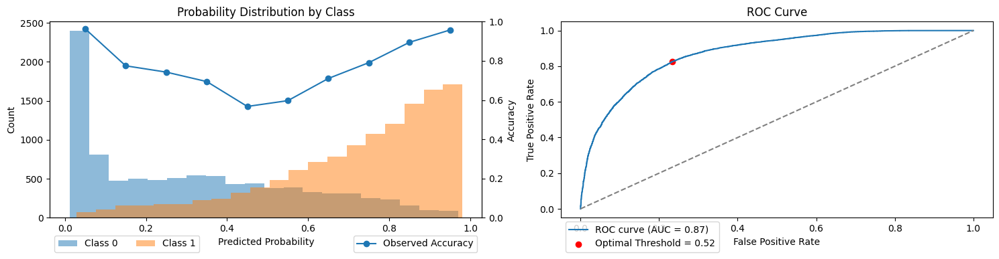

In [160]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve

# 仮に入力がある場合
# test_Y = np.array([...])
# y_pred = np.array([...])
# y_pred_prob = np.array([...])

# --- 1. 出力確率のヒストグラム ---
plt.figure(figsize=(15, 4))

ax1 = plt.subplot(1, 2, 1)
ax1.hist(y_pred_prob[test_Y==0], bins=20, alpha=0.5, label='Class 0')
ax1.hist(y_pred_prob[test_Y==1], bins=20, alpha=0.5, label='Class 1')
ax1.set_xlabel('Predicted Probability')
ax1.set_ylabel('Count')
ax1.set_title('Probability Distribution by Class')

# --- 2. Calibration plot (信頼度 vs 精度) ---
# plt.subplot(1, 3, 2)
ax2 = plt.twinx()
bins = np.linspace(0, 1, 11)
bin_centers = (bins[:-1] + bins[1:]) / 2
accuracy_in_bin = []

for i in range(len(bins)-1):
    mask = (y_pred_prob >= bins[i]) & (y_pred_prob < bins[i+1])
    if np.sum(mask) > 0:
        acc = np.mean(test_Y[mask] == (y_pred_prob[mask] > 0.5))
        accuracy_in_bin.append(acc)
    else:
        accuracy_in_bin.append(np.nan)
ax2.plot(bin_centers, accuracy_in_bin, marker='o', label='Observed Accuracy')
# plt.plot([0,1],[0,1], '--', color='gray', label='Ideal')
# plt.xlabel('Predicted Probability')
ax2.set_ylabel('Accuracy')
# plt.title('Calibration Plot')
ax1.legend(loc='lower left',bbox_to_anchor=(0,-0.2),ncol=2)
ax2.legend(loc='lower right',bbox_to_anchor=(1,-0.2))
plt.ylim(0,1)

# --- 3. ROC曲線 ---
plt.subplot(1, 2, 2)
fpr, tpr, thresholds = roc_curve(test_Y, y_pred_prob)
roc_auc = auc(fpr, tpr)
J = tpr - fpr
idx = np.argmax(J)
optimal_threshold = thresholds[idx]
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.scatter(fpr[idx], tpr[idx], marker='o', color='red', label=f'Optimal Threshold = {optimal_threshold:.2f}')
plt.plot([0,1], [0,1], '--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower left',bbox_to_anchor=(0,-0.2))

plt.tight_layout()
plt.show()


In [158]:
from sklearn.metrics import roc_curve
import numpy as np
# Youden 指数で最適閾値
J = tpr - fpr
idx = np.argmax(J)
optimal_threshold = thresholds[idx]

print("最適閾値:", optimal_threshold)
print("TPR:", tpr[idx], "FPR:", fpr[idx])


最適閾値: 0.5072732316422804
TPR: 0.8269641585568479 FPR: 0.2344186046511628


## 順序付き回帰
- y1 >= 1?
- y2 >= 2?  

In [163]:
train_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')
test_df = pd.read_parquet(r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\test_features.parquet' ).drop('Unnamed: 0', axis=1, errors='ignore')   
train_df = add_sbp_class(train_df)
test_df = add_sbp_class(test_df)
train_X = train_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin"],axis=1)
test_Y = test_df['sbp_class']
test_Y1 = (test_df['sbp_class'] >= 1).astype(int)
test_Y2 = (test_df['sbp_class'] >= 2).astype(int)
test_X = test_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin"],axis=1)
# np.unique(train_Y1,return_counts=True), np.unique(train_Y2, return_counts=True), np.unique(test_Y1, return_counts=True), np.unique(test_Y2, return_counts=True)

In [235]:
train_X.shape, train_Y1.shape,test_Y1.shape, test_X.shape   

((448377, 98), (448377,), (54892,), (54892, 98))

In [166]:
# train lightgbm
from sklearn.metrics import f1_score    
# --- LightGBM データセットに変換 ---
# weights = compute_sample_weight(class_weight='balanced', y=train_Y)
# lgb_train = lgb.Dataset(train_X, label=train_Y, weight=weights)
gkf = GroupKFold(n_splits=5)
results =[] 
f=0
for train_idx, val_idx in gkf.split(train_df, groups=train_df['subject']):
    train_X = train_df.iloc[train_idx].drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin","bp_class"],axis=1,errors='ignore')
    train_Y = train_df.iloc[train_idx]['sbp_class']
    val_Y = train_df.iloc[val_idx]['sbp_class']
    val_X = train_df.iloc[val_idx].drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin","bp_class"],axis=1,errors='ignore')
    train_Y1 = (train_Y >= 1).astype(int)
    train_Y2 = (train_Y >= 2).astype(int)
    val_Y1 = (val_Y >= 1).astype(int)
    val_Y2 = (val_Y >= 2).astype(int)
    lgb_train1 = lgb.Dataset(train_X, label=train_Y1,weight=compute_sample_weight(class_weight='balanced', y=train_Y1))
    lgb_test1 = lgb.Dataset(val_X, label=val_Y1, reference=lgb_train1)
    lgb_train2 = lgb.Dataset(train_X, label=train_Y2,weight=compute_sample_weight(class_weight='balanced', y=train_Y2))
    lgb_test2 = lgb.Dataset(val_X, label=val_Y2, reference=lgb_train2)
# --- ハイパーパラメータ設定 ---
    params = {
        'objective': 'binary',
        'metric': 'binary_error',
        'boosting_type': 'gbdt',
        'learning_rate': 0.05,
        "min_data_in_leaf": 200,
        'num_leaves': 31,
        'max_depth': -1,
        'verbose': -1,
        'random_state': 42,
    }
    if test_Y1.ndim>1:
        # softlabel
        params['objective'] = 'cross_entropy'
        params['metric'] = 'cross_entropy'
        params['num_class'] =1
    elif test_Y1.nunique() > 2:
        params['objective'] = 'multiclass'
        params['metric'] = 'multi_error'
        params['num_class'] = test_Y.nunique()
    # --- モデル学習 ---
    model1 = lgb.train(
        params,
        lgb_train1,
        valid_sets=[lgb_train1, lgb_test1],
        valid_names=['train', 'test'],
        num_boost_round=2000,
        callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=100)],
    )
    model2 = lgb.train(
        params,
        lgb_train2,
        valid_sets=[lgb_train2, lgb_test2],
        valid_names=['train', 'test'],
        num_boost_round=2000,
        callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=300)],
    )

    # --- 予測 ---
    p1 = model1.predict(test_X, num_iteration=model1.best_iteration)
    p2 = model2.predict(test_X, num_iteration=model2.best_iteration)
    y_pred = np.zeros_like(p1)
    y_pred[p1 > 0.5] = 1
    y_pred[p2 > 0.5] = 2

    # --- 評価 ---
    acc = accuracy_score(test_Y, y_pred)
    cm = confusion_matrix(test_Y, y_pred)
    f1 = f1_score(test_Y, y_pred,average='macro')
    # --- Feature Importance ---
    importance_df = pd.DataFrame({
        'feature': train_X.columns,
        'importance': model1.feature_importance(importance_type='gain')
    }).sort_values(by='importance', ascending=False)

    res = {"accuracy" :acc,
        "f1":f1,
        "cm":cm,
        "fold":f,
        "p1":p1,
        "p2":p2,
        "pred_test":y_pred,
        # "pred_val":pred_Y_val,
        "true":test_Y
        } 
    results.append(res)
    print(f"Fold {f} - F1: {f1:.4f}, Accuracy: {acc:.4f}")
    f+=1
    # print("\nTop 10 important features:")
    # print(importance_df.head(10))

    # # --- 可視化 ---
    # plt.figure(figsize=(8, 6))
    # plt.barh(importance_df['feature'][:20][::-1], importance_df['importance'][:20][::-1])
    # plt.xlabel("Feature Importance (gain)")
    # plt.title("Top 20 Feature Importances")
    # plt.tight_layout()
    # plt.show()
    # print(f"F1 Score: {f1_score(test_Y, y_pred,average='macro'):.4f}")
    # print(f"Accuracy: {acc:.4f}")
    # print("Confusion Matrix:")
    # print(cm)
    # print("\nClassification Report:")
    # print(classification_report(test_Y, y_pred))
    # # print confusion matrix as heatmap
    # import seaborn as sns
    # plt.figure(figsize=(6, 5))
    # sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    # plt.xlabel("Predicted Label")
    # plt.ylabel("True Label")
    # plt.title("Confusion Matrix Heatmap")
    # plt.show()  

Training until validation scores don't improve for 50 rounds
[100]	train's binary_error: 0.269473	test's binary_error: 0.315417
[200]	train's binary_error: 0.247292	test's binary_error: 0.307332
[300]	train's binary_error: 0.234038	test's binary_error: 0.30208
[400]	train's binary_error: 0.22353	test's binary_error: 0.29821
[500]	train's binary_error: 0.21493	test's binary_error: 0.295422
[600]	train's binary_error: 0.207672	test's binary_error: 0.292579
[700]	train's binary_error: 0.201307	test's binary_error: 0.291307
[800]	train's binary_error: 0.195118	test's binary_error: 0.289925
[900]	train's binary_error: 0.189256	test's binary_error: 0.288453
[1000]	train's binary_error: 0.184002	test's binary_error: 0.286457
[1100]	train's binary_error: 0.179026	test's binary_error: 0.285609
[1200]	train's binary_error: 0.174293	test's binary_error: 0.285342
[1300]	train's binary_error: 0.169889	test's binary_error: 0.28387
[1400]	train's binary_error: 0.16571	test's binary_error: 0.282175
Ea

In [167]:
for f in range(len(results)):
    print(f"Fold {f} - F1: {results[f]['f1']:.4f}, Accuracy: {results[f]['accuracy']:.4f}")

Fold 0 - F1: 0.5087, Accuracy: 0.5052
Fold 1 - F1: 0.5132, Accuracy: 0.5107
Fold 2 - F1: 0.5083, Accuracy: 0.5059
Fold 3 - F1: 0.5145, Accuracy: 0.5119
Fold 4 - F1: 0.5123, Accuracy: 0.5103


In [181]:
mean_f1 = np.mean([results[f]['f1'] for f in range(len(results))])
mean_f1

0.5206214581335182

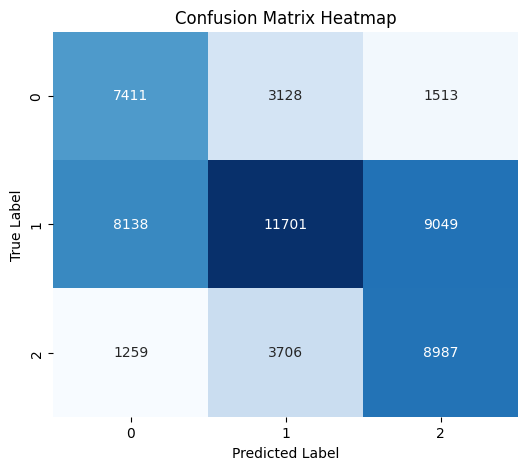

In [170]:
plt.figure(figsize=(6, 5))
sns.heatmap(results[3]['cm'], annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix Heatmap")
plt.show()  

33rd Percentile: 108.14785481814765, 66th Percentile: 133.5445087364091


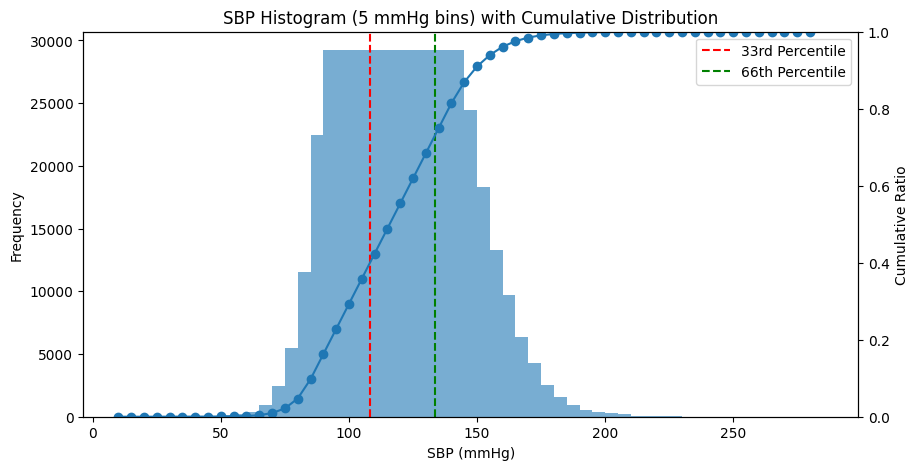

In [246]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# sbp: あなたの SBP 値の配列か Series
# 例）sbp = df["sbp"].values
sbp = train_df['sbp'].values
bins = np.arange(10,290, 5)  # 5 mmHg 幅

# ヒストグラム
counts, bin_edges = np.histogram(sbp, bins=bins)
cum_counts = np.cumsum(counts)            # 累積度数
cum_ratio = cum_counts / cum_counts[-1]   # 累積割合（0〜1）

fig, ax1 = plt.subplots(figsize=(10,5))
p33 = np.percentile(sbp, 33.33)
p66 = np.percentile(sbp, 66.66)
print(f"33rd Percentile: {p33}, 66th Percentile: {p66}")
# ---------- ヒストグラム ----------
ax1.bar(bin_edges[:-1], counts, width=5, align='edge', alpha=0.6)
ax1.set_xlabel("SBP (mmHg)")
ax1.set_ylabel("Frequency")
ax1.axvline(p33, color='red', linestyle='--', label='33rd Percentile')
ax1.axvline(p66, color='green', linestyle='--', label='66th Percentile')
ax1.legend()
# ---------- 累積度数（右軸） ----------
ax2 = ax1.twinx()
ax2.plot(bin_edges[:-1], cum_ratio, marker="o")
ax2.set_ylabel("Cumulative Ratio")

ax2.set_ylim(0, 1)  # 0〜1 に揃える
ax1.set_title("SBP Histogram (5 mmHg bins) with Cumulative Distribution")

plt.show()


In [242]:
sbp.min(), sbp.max()

(13.666580375415789, 286.58240014784946)

Confusion Matrix:
[[ 7943  4109]
 [11307 31533]]

Classification Report:
              precision    recall  f1-score   support

           0       0.41      0.66      0.51     12052
           1       0.88      0.74      0.80     42840

    accuracy                           0.72     54892
   macro avg       0.65      0.70      0.66     54892
weighted avg       0.78      0.72      0.74     54892



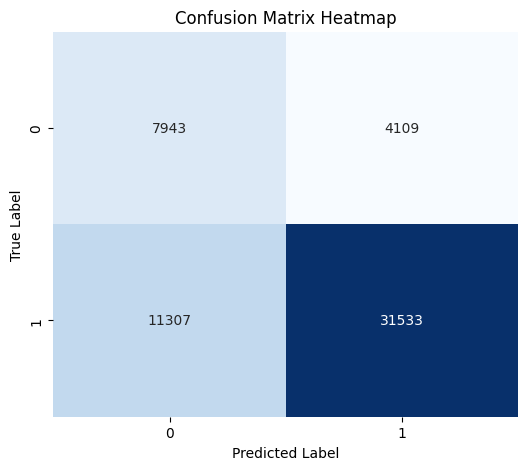

Confusion Matrix:
[[29438 11502]
 [ 4400  9552]]

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.72      0.79     40940
           1       0.45      0.68      0.55     13952

    accuracy                           0.71     54892
   macro avg       0.66      0.70      0.67     54892
weighted avg       0.76      0.71      0.73     54892



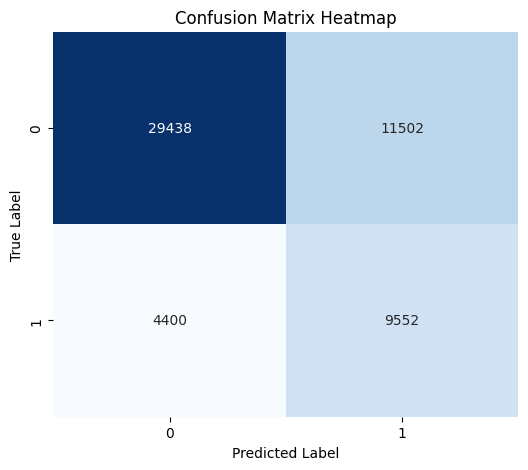

In [258]:
plot_cm(test_Y1, p1>0.5)
plot_cm(test_Y2, p2>0.5)

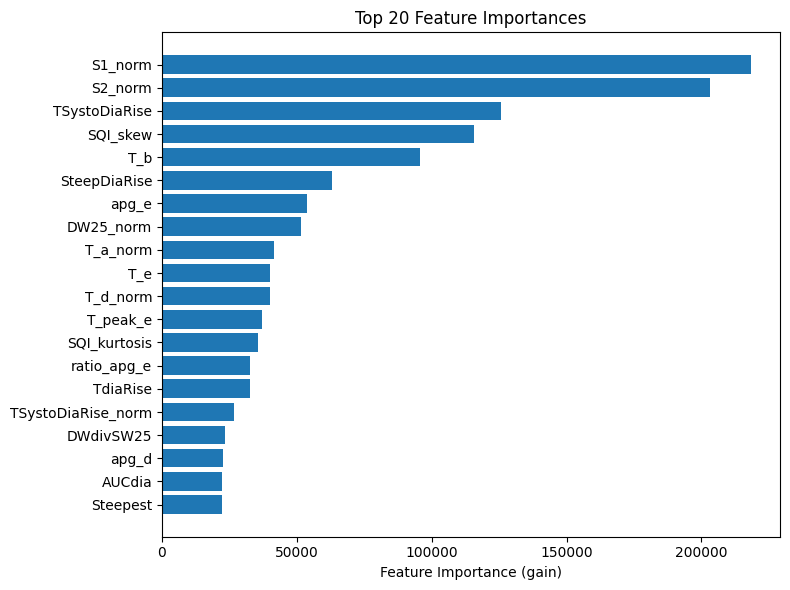

In [255]:
plt.figure(figsize=(8, 6))
plt.barh(importance_df['feature'][:20][::-1], importance_df['importance'][:20][::-1])
plt.xlabel("Feature Importance (gain)")
plt.title("Top 20 Feature Importances")
plt.tight_layout()
plt.show()

In [78]:
test_X.nunique()

Tc             4433
Ts             4728
Td             7269
Tsteepest      3879
Steepest      54862
              ...  
AI            53917
bd            53214
bcda          53917
sdoo          53658
cycle_zero    54862
Length: 98, dtype: int64

# cv

In [225]:

from sklearn.metrics import f1_score, accuracy_score, confusion_matrix, precision_score, recall_score
params = {
    'objective': 'binary',
    'metric': 'binary_error',
    'boosting_type': 'gbdt',
    'learning_rate': 0.05,
    "min_data_in_leaf": 200,
    'num_leaves': 31,
    'max_depth': -1,
    'verbose': -1,
    'random_state': 42,
    "num_threads": 8
}
importance_df = pd.DataFrame({"feature": test_X.columns})
results = []
learning_curves = []
if test_Y.ndim>1:
    # softlabel
    params['objective'] = 'cross_entropy'
    params['metric'] = 'cross_entropy'
    params['num_class'] =1
elif test_Y.nunique() > 2:
    params['objective'] = 'multiclass'
    params['metric'] = 'multi_error'
    params['num_class'] = test_Y.nunique()
# --- モデル学習 ---
folds = get_groupkf(train_df, k=5, group_col='subject', y_col='bp_class', random_state=42,return_raw_train=True)
for f in range(5):
    _train,_val = folds[f]
    print(type(_train), type(_val))
    train_X, train_Y = _train
    val_X, val_Y = _val
    lgb_train = lgb.Dataset(train_X, label=train_Y,weight=compute_sample_weight(class_weight='balanced', y=train_Y))
    lgb_val = lgb.Dataset(val_X, label=val_Y) 
    evals_result = {}
    model = lgb.train(
        params,
        lgb_train,
        valid_sets=[lgb_train, lgb_val],
        valid_names=['train', 'val'],
        num_boost_round=2000,
        callbacks=[lgb.early_stopping(stopping_rounds=100),lgb.log_evaluation(period=300)],
        # callbacks=[lgb.log_evaluation(period=500),
        #            lgb.record_evaluation(evals_result)],
    )
    # ===== 学習曲線として保存 =====
    metric_name = params['metric']  # 'binary_error' / 'multi_error' / 'cross_entropy'
    # LightGBMは metric が複数だと dict の中に複数キーができるので、まずは指定metricを優先して拾う
    # もし見つからなければ最初のキーを使う（安全化）
    train_metrics_dict = evals_result.get('train', {})
    val_metrics_dict = evals_result.get('val', {})

    if metric_name not in train_metrics_dict and len(train_metrics_dict) > 0:
        metric_name = list(train_metrics_dict.keys())[0]

    train_curve = train_metrics_dict.get(metric_name, [])
    val_curve = val_metrics_dict.get(metric_name, [])

    learning_curves.append({
        "fold": f,
        "metric": metric_name,
        "train": train_curve,
        "val": val_curve,
    })

    # --- 予測 ---
    pred_Y_prob_train = model.predict(train_X, num_iteration=model.best_iteration)
    pred_Y_prob = model.predict(test_X, num_iteration=model.best_iteration)
    pred_Y_prob_val = model.predict(val_X, num_iteration=model.best_iteration)
    pred_Y_test = np.argmax(pred_Y_prob, axis=1) if test_Y.nunique() > 2 else (pred_Y_prob >= 0.5).astype(int)
    pred_Y_val = np.argmax(pred_Y_prob_val, axis=1) if val_Y.nunique() > 2 else (pred_Y_prob_val >= 0.5).astype(int)
    pred_Y_train = np.argmax(pred_Y_prob_train, axis=1) if train_Y.nunique() > 2 else (pred_Y_prob_train >= 0.5).astype(int)
    # --- 評価 ---
    acc = accuracy_score(test_Y, pred_Y_test)
    pre = precision_score(test_Y, pred_Y_test, average='macro')
    rec = recall_score(test_Y, pred_Y_test, average='macro')
    cm = confusion_matrix(test_Y, pred_Y_test)
    f1 = f1_score(test_Y, pred_Y_test,average='macro')
    f1_train = f1_score(train_Y, pred_Y_train,average='macro')
    f1_val = f1_score(val_Y, pred_Y_val,average='macro')
    print(f"Fold {f} - Train F1: {f1_train:.4f}, Val F1: {f1_val:.4f}, Test F1: {f1:.4f}")
    # --- Feature Importance ---
    importance_df[f'importance_fold{f}'] = model.feature_importance(importance_type='gain')

    # --- 結果保存 ---
    res = {"accuracy" :acc,
           "f1":f1,
           "f1_train":f1_train,
           "f1_val":f1_val,
           "precision": pre,
           "recall": rec,
           "cm":cm,
           "fold":f,
           "pred_test_prob":pred_Y_prob,
           "pred_val_prob":pred_Y_prob_val,
           "pred_test":pred_Y_test,
           "pred_val":pred_Y_val,
           "true":test_Y
           } 
    results.append(res)
    print(f"Fold {f} - F1: {f1:.4f}, Accuracy: {acc:.4f}, Precision: {pre:.4f}, Recall: {rec:.4f}")
# --- 可視化 ---
# plt.figure(figsize=(8, 6))
# plt.barh(importance_df['feature'][:20][::-1], importance_df['importance'][:20][::-1])
# plt.xlabel("Feature Importance (gain)")
# plt.title("Top 20 Feature Importances")
# plt.tight_layout()
# plt.show()
# print(f"F1 Score: {f1:.4f}")
# print(f"Accuracy: {acc:.4f}")
# print("Confusion Matrix:")
# print(cm)
# print("\nClassification Report:")
# print(classification_report(test_Y, y_pred))
# # print confusion matrix as heatmap
# import seaborn as sns
# plt.figure(figsize=(6, 5))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
# plt.xlabel("Predicted Label")
# plt.ylabel("True Label")
# plt.title("Confusion Matrix Heatmap")
# plt.show()  
print( "F1 train mean:", f"{np.mean([results[f]['f1_train'] for f in range(5)])*100:.1f}%", "F1 val mean:", f"{np.mean([results[f]['f1_val'] for f in range(5)])*100:.1f}%", "F1 test mean:", f"{np.mean([results[f]['f1'] for f in range(5)])*100:.1f}%")

set()
set()
set()
set()
set()
<class 'list'> <class 'list'>
Training until validation scores don't improve for 100 rounds
[300]	train's binary_error: 0.240465	val's binary_error: 0.311783
[600]	train's binary_error: 0.21778	val's binary_error: 0.302337
[900]	train's binary_error: 0.201053	val's binary_error: 0.295272
[1200]	train's binary_error: 0.187172	val's binary_error: 0.290329
[1500]	train's binary_error: 0.17552	val's binary_error: 0.286496
[1800]	train's binary_error: 0.164919	val's binary_error: 0.282053
Did not meet early stopping. Best iteration is:
[1985]	train's binary_error: 0.158842	val's binary_error: 0.280622
Fold 0 - Train F1: 0.7721, Val F1: 0.6186, Test F1: 0.5940
Fold 0 - F1: 0.5940, Accuracy: 0.7330, Precision: 0.5920, Recall: 0.6756
<class 'list'> <class 'list'>
Training until validation scores don't improve for 100 rounds
[300]	train's binary_error: 0.241182	val's binary_error: 0.306079
[600]	train's binary_error: 0.218096	val's binary_error: 0.298534
[900]	trai

In [ ]:
data_label = "1_vs_rest_cv_001"
import pickle

In [161]:

results = pickle.load(open(fr'F:\minowa\BloodPressureEstimation\data\results\paper\clf_results_{data_label}.pkl', 'rb'))

In [226]:
accuracy_mean = np.mean([results[f]['accuracy'] for f in range(5)])
precision_mean = np.mean([results[f]['precision'] for f in range(5)])
recall_mean = np.mean([results[f]['recall'] for f in range(5)])
f1_mean = np.mean([results[f]['f1'] for f in range(5)])
print(f"Overall Test Accuracy: {accuracy_mean*100:.1f}, Precision: {precision_mean*100:.1f}, Recall: {recall_mean*100:.1f}, F1 Score: {f1_mean*100:.1f}")

Overall Test Accuracy: 72.2, Precision: 58.7, Recall: 67.0, F1 Score: 58.6


In [61]:
importance_df['feature'][:20].values

array(['T_b', 'ratio_apg_b', 'SQI_skew', 'Td', 'TSystoDiaRise',
       'SteepDiaRise', 'SQI_kurtosis', 'apg_d', 'S2_norm', 'S1_norm',
       'DWdivSW25', 'bcda', 'ratio_apg_e', 'apg_e', 'Tc', 'DW25', 'apg_a',
       'AUCdia', 'T_a', 'T_e'], dtype=object)

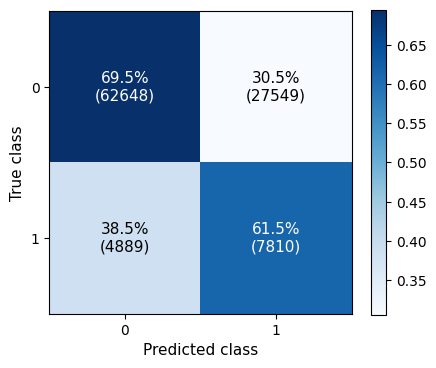

In [228]:
# labels = ["0","1","2"]
labels = ["0","1"]
cm_row = cm / cm.sum(axis=1, keepdims=True)
cm_row = np.nan_to_num(cm_row)
plt.figure(figsize=(4.5,3.75))
plt.imshow(cm_row, cmap="Blues")
plt.colorbar()
plt.xticks(range(len(labels)), labels)
plt.yticks(range(len(labels)), labels)
threshold = cm_row.max() * 0.7
for i in range(len(labels)):
    for j in range(len(labels)):
        color = "white" if cm_row[i, j] > threshold else "black"
        plt.text(j, i, f"{cm_row[i,j]*100:.1f}%\n({cm[i,j]})",
                 ha="center", va="center", color=color,fontsize=11)
# plt.title("Confusion Matrix (Row-normalized)")
plt.xlabel("Predicted class",fontsize=11)
plt.ylabel("True class",fontsize=11)
plt.tight_layout()
plt.savefig(f'../data/results/paper/cm_{data_label}.svg', format='svg', bbox_inches='tight')
plt.show()
plt.close()

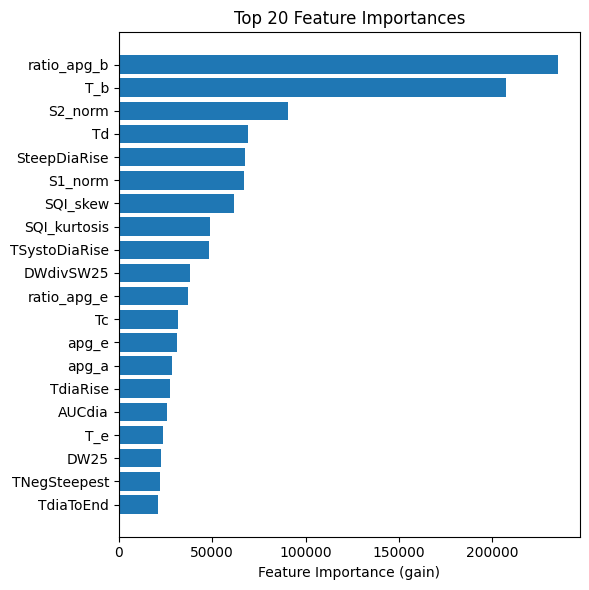

In [229]:
importance_df['importance_mean'] = importance_df[[f'importance_fold{f}' for f in range(5)]].mean(axis=1)
importance_df = importance_df.sort_values(by='importance_mean', ascending=False)
plt.figure(figsize=(6, 6))
plt.barh(importance_df['feature'][:20][::-1], importance_df['importance_mean'][:20][::-1])
plt.xlabel("Feature Importance (gain)")
plt.title("Top 20 Feature Importances")
plt.tight_layout()
plt.savefig(f'../data/results/paper/importance_{data_label}.svg', format='svg', bbox_inches='tight')
plt.show()
plt.close()
results.append(importance_df)
import pickle
with open(fr'F:\minowa\BloodPressureEstimation\data\results\paper\clf_results_{data_label}.pkl', 'wb') as f:
    pickle.dump(results, f)

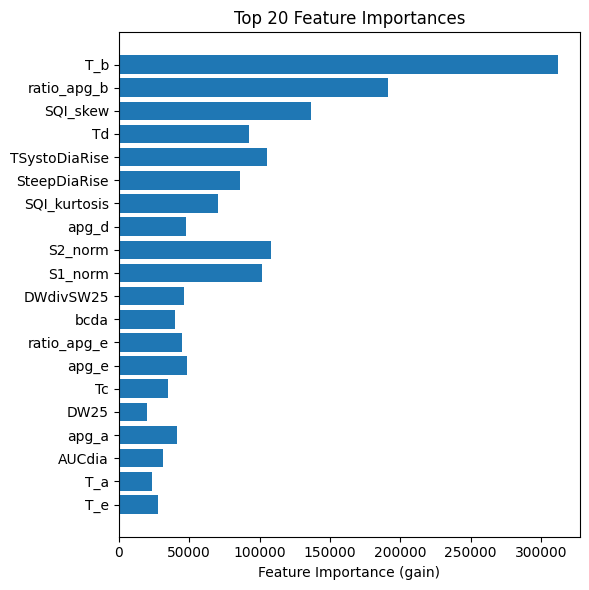

In [67]:
importance_df = importance_df.sort_values(by='importance_fold3', ascending=False)
plt.figure(figsize=(6, 6))
plt.barh(importance_df['feature'][:20][::-1], importance_df['importance_fold2'][:20][::-1])
plt.xlabel("Feature Importance (gain)")
plt.title("Top 20 Feature Importances")
plt.tight_layout()
plt.show()

In [54]:
new_results = []
str_labels = ["1 vs 2","0 vs 2","0 vs 1"]
for i in range(3):
    tmp_arr = []
    for f in range(5):
        tmp_test = results[f]['pred_test']
        tmp_true = results[f]['true']
        mask = (tmp_true != i)
        tmp_test = tmp_test[mask]
        tmp_true = tmp_true[mask]
        if i == 0:
            # print(np.unique(tmp_true, return_counts=True))
            tmp_test -= 1
            tmp_true -= 1
            # print(np.unique(tmp return_counts=True))
        elif i == 1:
            # print(np.unique(tmp_true, return_counts=True))
            tmp_test[tmp_test == 2] = 1
            tmp_true[tmp_true == 2] = 1
            # print(np.unique(tmp_true, return_counts=True))
        else:
            pass
            # print(np.unique(tmp_true, return_counts=True))
        new_res = {
            "fold": f,
            "class": i,
            "accuracy": accuracy_score(tmp_true, tmp_test),
            "f1": f1_score(tmp_true, tmp_test, average='macro'),
            "cm": confusion_matrix(tmp_true, tmp_test),
            "num_samples": len(tmp_true)
        } 
        tmp_arr.append(new_res)
        print(f"Class {str_labels[i]}, Fold {f} - F1: {new_res['f1']:.4f}, Accuracy: {new_res['accuracy']:.4f}, Num Samples: {new_res['num_samples']}")
    new_results.append(tmp_arr)
    print(np.mean([tmp_arr[f]['f1'] for f in range(5)]))

Class 1 vs 2, Fold 0 - F1: 0.3186, Accuracy: 0.4179, Num Samples: 41973
Class 1 vs 2, Fold 1 - F1: 0.3176, Accuracy: 0.4159, Num Samples: 41973
Class 1 vs 2, Fold 2 - F1: 0.3183, Accuracy: 0.4160, Num Samples: 41973
Class 1 vs 2, Fold 3 - F1: 0.3152, Accuracy: 0.4105, Num Samples: 41973
Class 1 vs 2, Fold 4 - F1: 0.3217, Accuracy: 0.4226, Num Samples: 41973
0.3182736174240065
Class 0 vs 2, Fold 0 - F1: 0.5932, Accuracy: 0.6352, Num Samples: 59554
Class 0 vs 2, Fold 1 - F1: 0.5968, Accuracy: 0.6400, Num Samples: 59554
Class 0 vs 2, Fold 2 - F1: 0.6024, Accuracy: 0.6445, Num Samples: 59554
Class 0 vs 2, Fold 3 - F1: 0.6041, Accuracy: 0.6491, Num Samples: 59554
Class 0 vs 2, Fold 4 - F1: 0.6013, Accuracy: 0.6459, Num Samples: 59554
0.5995598696854822
Class 0 vs 1, Fold 0 - F1: 0.3573, Accuracy: 0.5029, Num Samples: 79051
Class 0 vs 1, Fold 1 - F1: 0.3596, Accuracy: 0.5067, Num Samples: 79051
Class 0 vs 1, Fold 2 - F1: 0.3568, Accuracy: 0.5039, Num Samples: 79051
Class 0 vs 1, Fold 3 - F1:

In [ ]:
for i in range(3):
    for r 

In [60]:
learning_curves[0].keys()

dict_keys(['fold', 'metric', 'train', 'val'])

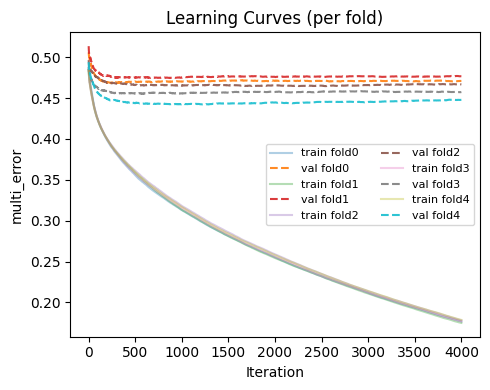

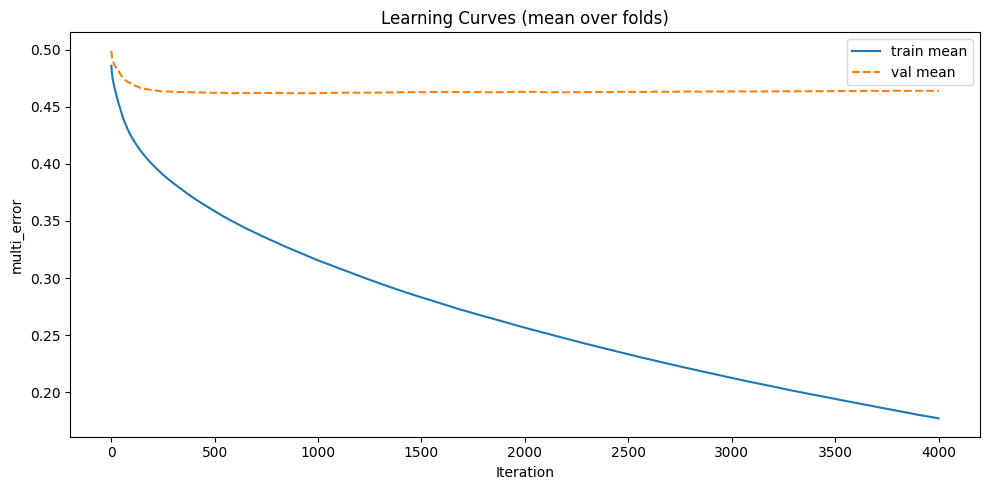

In [218]:
# (1) foldごとの曲線
plt.figure(figsize=(5, 4))
for lc in learning_curves:
    it_train = range(1, len(lc["train"]) + 1)
    it_val = range(1, len(lc["val"]) + 1)
    plt.plot(it_train, lc["train"], alpha=0.35, label=f'train fold{lc["fold"]}')
    plt.plot(it_val, lc["val"], alpha=0.9, linestyle='--', label=f'val fold{lc["fold"]}')
plt.xlabel("Iteration")
plt.ylabel(learning_curves[0]["metric"] if learning_curves else "metric")
plt.title("Learning Curves (per fold)")
plt.legend(ncol=2, fontsize=8)
plt.tight_layout()
plt.show()

# (2) 平均曲線（長さを最短に揃えて平均）
if len(learning_curves) > 0:
    min_len_train = min(len(lc["train"]) for lc in learning_curves if len(lc["train"]) > 0)
    min_len_val = min(len(lc["val"]) for lc in learning_curves if len(lc["val"]) > 0)

    train_stack = np.array([lc["train"][:min_len_train] for lc in learning_curves])
    val_stack = np.array([lc["val"][:min_len_val] for lc in learning_curves])

    train_mean = train_stack.mean(axis=0)
    val_mean = val_stack.mean(axis=0)

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, len(train_mean) + 1), train_mean, label="train mean")
    plt.plot(range(1, len(val_mean) + 1), val_mean, linestyle="--", label="val mean")
    plt.xlabel("Iteration")
    plt.ylabel(learning_curves[0]["metric"])
    plt.title("Learning Curves (mean over folds)")
    plt.legend()
    plt.tight_layout()
    plt.show()

In [42]:
test_Y.unique()

array([1, 2, 0])

Early stopping, best iteration is:
[228]	train's binary_error: 0.278793	val's binary_error: 0.325737
Fold 0 - F1: 0.6309, Accuracy: 0.6368
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[234]	train's binary_error: 0.277069	val's binary_error: 0.320472
Fold 1 - F1: 0.6311, Accuracy: 0.6365
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[158]	train's binary_error: 0.287133	val's binary_error: 0.35298
Fold 2 - F1: 0.6274, Accuracy: 0.6325
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[230]	train's binary_error: 0.275223	val's binary_error: 0.341978
Fold 3 - F1: 0.6367, Accuracy: 0.6416
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[157]	train's binary_error: 0.28681	val's binary_error: 0.333822
Fold 4 - F1: 0.6289, Accuracy: 0.6331

In [199]:
 np.mean([results[f]['f1'] for f in range(len(results))])

0.7890970147288485

## 3class

In [37]:

# train_df, test_df = add_class(classes=3, boundary=None)
results3 = []
f=0
# test_X,test_Y = get_dataset(test_df, return_raw=True)
gkf = GroupKFold(n_splits=5) 
for train_idx, val_idx in gkf.split(train_df, groups=train_df['subject']):
    train_X = train_df.iloc[train_idx].drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin","bp_class"],axis=1,errors='ignore')
    train_Y = train_df.iloc[train_idx]['bp_class']
    val_Y = train_df.iloc[val_idx]['bp_class']
    val_X = train_df.iloc[val_idx].drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin","bp_class"],axis=1,errors='ignore')
    params = {
    'objective': 'binary',
    'metric': 'binary_error',
    'boosting_type': 'gbdt',
    'learning_rate': 0.05,
    "min_data_in_leaf": 200,
    'num_leaves': 31,
    'max_depth': -1,
    'verbose': -1,
    'random_state': 42,
    }
    importance_df = pd.DataFrame({"feature": test_X.columns})
    if test_Y.ndim>1:
        # softlabel
        params['objective'] = 'cross_entropy'
        params['metric'] = 'cross_entropy'
        params['num_class'] =1
    elif test_Y.nunique() > 2:
        params['objective'] = 'multiclass'
        params['metric'] = 'multi_error'
        params['num_class'] = test_Y.nunique()
    # --- モデル学習 ---
    lgb_train = lgb.Dataset(train_X, label=train_Y,weight=compute_sample_weight(class_weight='balanced', y=train_Y)) 
    lgb_val = lgb.Dataset(val_X, label=val_Y) 
    model = lgb.train(
        params,
        lgb_train,
        valid_sets=[lgb_train, lgb_val],
        valid_names=['train', 'val'],
        num_boost_round=2000,
        callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=300)],
    )
    # --- 予測 ---
    pred_Y_prob = model.predict(test_X, num_iteration=model.best_iteration)
    pred_Y_prob_val = model.predict(val_X, num_iteration=model.best_iteration)
    pred_Y_test = np.argmax(pred_Y_prob, axis=1) if test_Y.nunique() > 2 else (pred_Y_prob >= 0.5).astype(int)
    pred_Y_val = np.argmax(pred_Y_prob_val, axis=1) if val_Y.nunique() > 2 else (pred_Y_prob_val >= 0.5).astype(int)
    # --- 評価 ---
    acc = accuracy_score(test_Y, pred_Y_test)
    pre = precision_score(test_Y, pred_Y_test, average='macro')
    rec = recall_score(test_Y, pred_Y_test, average='macro')
    cm = confusion_matrix(test_Y, pred_Y_test)
    f1 = f1_score(test_Y, pred_Y_test,average='macro')
    # --- Feature Importance ---
    importance_df[f'importance_fold{f}'] = model.feature_importance(importance_type='gain')
    # --- 結果保存 ---
    res = {"accuracy" :acc,
           "f1":f1,
           "precision": pre,
           "recall": rec,
           "cm":cm,
           "fold":f,
           "pred_test_prob":pred_Y_prob,
           "pred_val_prob":pred_Y_prob_val,
           "pred_test":pred_Y_test,
           "pred_val":pred_Y_val,
           "true":test_Y
           } 
    results3.append(res)
    print(f"Fold {f} - F1: {f1:.4f}, Accuracy: {acc:.4f}, Precision: {pre:.4f}, Recall: {rec:.4f}")
    f+=1
    # break
# --- 可視化 ---

Training until validation scores don't improve for 50 rounds
[300]	train's multi_error: 0.377913	val's multi_error: 0.46237


KeyboardInterrupt: 

In [206]:
np.mean([results[f]['f1'] for f in range(len(results))])

0.5060819602859239

In [175]:
for f in range(len(results)):
    print(f"Fold {f} - F1: {results[f]['f1']:.4f}, Accuracy: {results[f]['accuracy']:.4f}")

Fold 0 - F1: 0.5206, Accuracy: 0.5225
Fold 1 - F1: 0.5206, Accuracy: 0.5207
Fold 2 - F1: 0.5184, Accuracy: 0.5212
Fold 3 - F1: 0.5240, Accuracy: 0.5261
Fold 4 - F1: 0.5195, Accuracy: 0.5197


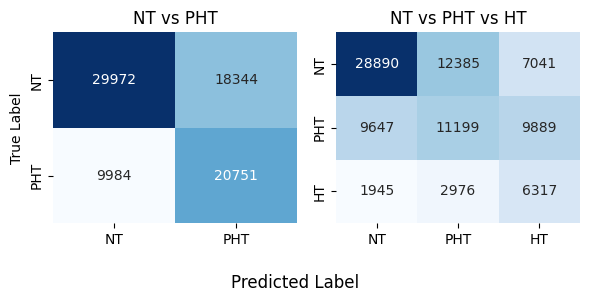

In [40]:
import seaborn as sns
fig = plt.figure(figsize=(6, 3))
plt.subplot(121)
sns.heatmap(results[3]['cm'], annot=True, fmt='d', cmap='Blues', cbar=False,xticklabels=['NT', 'PHT'], yticklabels=['NT', 'PHT'])
plt.title("NT vs PHT")
plt.ylabel("True Label")

plt.subplot(122)
sns.heatmap(results3[3]['cm'], annot=True, fmt='d', cmap='Blues', cbar=False,xticklabels=['NT', 'PHT','HT'], yticklabels=['NT', 'PHT','HT'])
plt.title("NT vs PHT vs HT")
fig.supxlabel("Predicted Label")
# plt.title("Confusion Matrix Heatmap")
plt.tight_layout()

In [66]:
results[3]['cm'], results3[3]['cm']

(array([[32005, 16674],
        [13842, 27768]], dtype=int64),
 array([[28890, 12385,  7041],
        [ 9647, 11199,  9889],
        [ 1945,  2976,  6317]], dtype=int64))

In [12]:
val_Y.value_counts

<bound method IndexOpsMixin.value_counts of 0          63.325667
17         63.489996
19         60.738809
36         50.263681
37         56.218000
             ...    
447995    198.471800
447996    206.660195
447997    209.800593
447998    209.992749
447999    207.371921
Name: sbp, Length: 89675, dtype: float64>

In [158]:
# print(classification_report(test_Y, results[0]['pred_test']))   
print(classification_report(test_Y, pred_Y_test))   

              precision    recall  f1-score   support

         0.0       0.70      0.64      0.67     26326
         1.0       0.42      0.35      0.38     17895
         2.0       0.39      0.57      0.46     10671

    accuracy                           0.53     54892
   macro avg       0.50      0.52      0.50     54892
weighted avg       0.55      0.53      0.54     54892



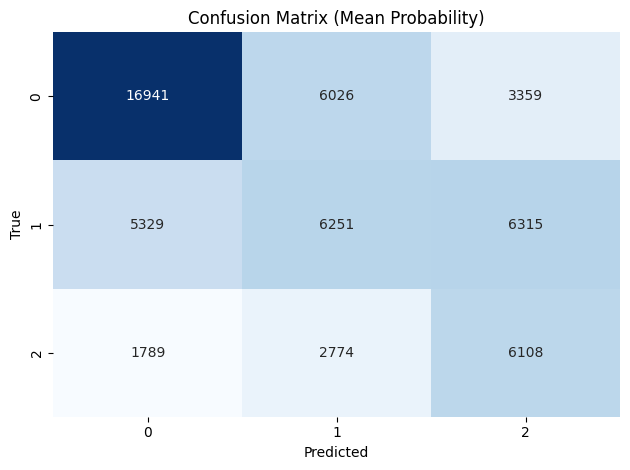

In [92]:
import seaborn as sns
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix (Mean Probability)')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()


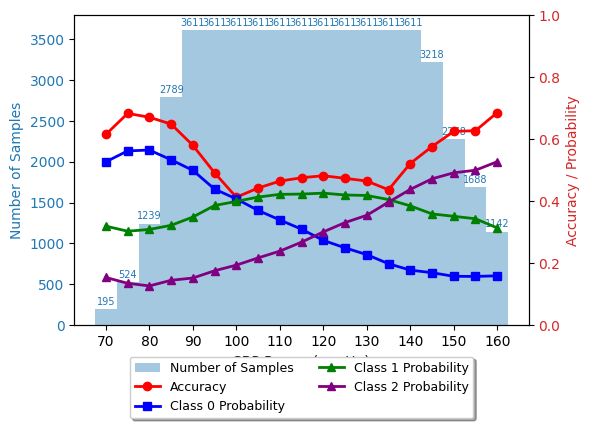

In [179]:
import matplotlib.pyplot as plt
import numpy as np
sbp = test_df['sbp'].values
result1 = results[0]['pred_test_prob']
predicted1 =results[0]['pred_test']  
true = test_Y.values
bin = np.arange(70, 170, 5)  # SBPの範囲に合わせてビンを設定
length = len(bin)-1
accuracy = np.zeros(length)
num_samples = np.zeros(length)
num_correct = np.zeros(length)
predict_proba_mean_0 = np.zeros(length)
predict_proba_mean_1 = np.zeros(length) 
predict_proba_mean_2 = np.zeros(length) 
for i in range(length):
    idx = (sbp >= bin[i]) & (sbp < bin[i+1])
    accuracy[i] = np.sum(predicted1[idx] == true[idx]) / np.sum(idx)
    num_samples[i] = np.sum(idx)
    num_correct[i] = np.sum(predicted1[idx] == true[idx])
    predict_proba_mean_0[i] = np.mean(result1[idx,0])
    predict_proba_mean_1[i] = np.mean(result1[idx,1])
    predict_proba_mean_2[i] = np.mean(result1[idx,2])
    
fig = plt.figure(figsize=(6, 4.5))
ax1 = fig.add_subplot(111)
# ax1.set_title('SBP Classification Accuracy by Range')
ax1.set_xlabel('SBP Range (mmHg)')
ax1.set_ylabel('Number of Samples', color='tab:blue')
# サンプル数バー
bars = ax1.bar(bin[:-1], num_samples, width=5, alpha=0.4, color='tab:blue', label='Number of Samples', zorder=2)
for i, v in enumerate(num_samples):
    if v > 0:
        ax1.text(bin[i], v + max(num_samples)*0.009, str(int(v)), ha='center', va='bottom', fontsize=7, color='tab:blue', zorder=4)
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_xticks(bin[::2])

# No data区間（例: bin 100〜140までデータなし）
# no_data_start = 97.5
# no_data_end = 137.5
# ax1.axvspan(no_data_start, no_data_end, color='gray', alpha=0.4, zorder=1)

# 「No data」テキストを区間中央だけに表示
# ax1.text((no_data_start+no_data_end)/2, ax1.get_ylim()[1]*0.5, 'No data',
#          ha='center', va='center', fontsize=14, color='white', weight='bold', zorder=10, rotation=90)

# 右y軸：精度と確率
ax2 = ax1.twinx()
ax2.set_ylabel('Accuracy / Probability', color='tab:red')

ax2.plot(bin[:-1], accuracy, marker='o', color='red', label='Accuracy', linewidth=2, markersize=6, zorder=5)
ax2.plot(bin[:-1], predict_proba_mean_0, marker='s', color='blue', label='Class 0 Probability', linewidth=2, markersize=6, zorder=5)
ax2.plot(bin[:-1], predict_proba_mean_1, marker='^', color='green', label='Class 1 Probability', linewidth=2, markersize=6, zorder=5)
ax2.plot(bin[:-1], predict_proba_mean_2, marker='^', color='purple', label='Class 2 Probability', linewidth=2, markersize=6, zorder=5)

ax2.tick_params(axis='y', labelcolor='tab:red')
ax2.set_ylim(0, 1.0)  # adjust as needed

# 凡例を下中央に
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='lower center', bbox_to_anchor=(0.5, -0.32), ncol=2, fontsize=9, frameon=True, fancybox=True, shadow=True)

fig.tight_layout()
plt.show()


## shap 3class

In [12]:
import shap
explainer = shap.TreeExplainer(model)

# shap.summary_plot(shap_values, test_X)

In [13]:
random_idx = np.random.choice(train_X.index, size=10000, replace=False)
explanation = explainer(train_X.loc[random_idx])

In [17]:
shap_values.shape

(54892, 98, 3)

In [16]:
feature_names = test_X.columns

In [35]:
random_idx = np.random.choice(test_X.index, size=1000, replace=False)
explanation = explainer(test_X.loc[random_idx])

In [20]:
explanation.shape

(54892, 98, 3)

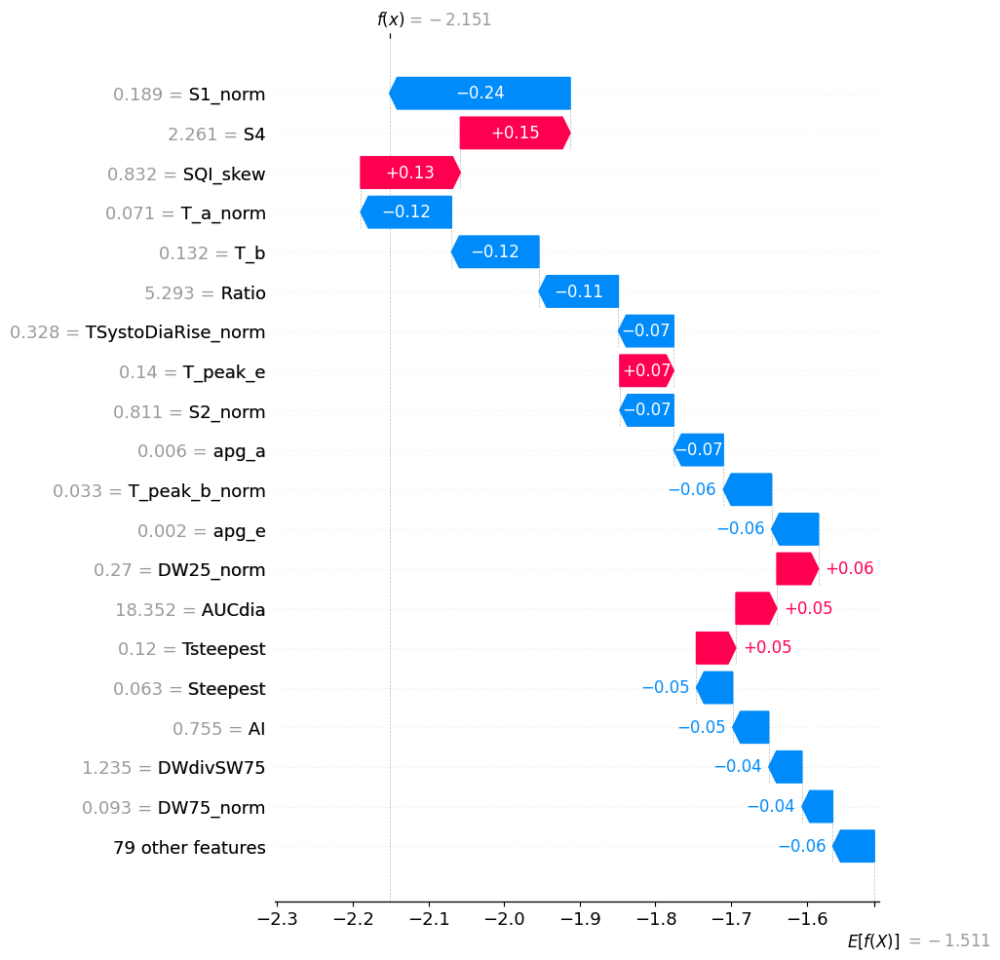

In [23]:
shap.plots.waterfall(explanation[0,:,2], max_display=20)

In [27]:
type(explanation),type(shap_values)

(shap._explanation.Explanation, numpy.ndarray)

### summary plot

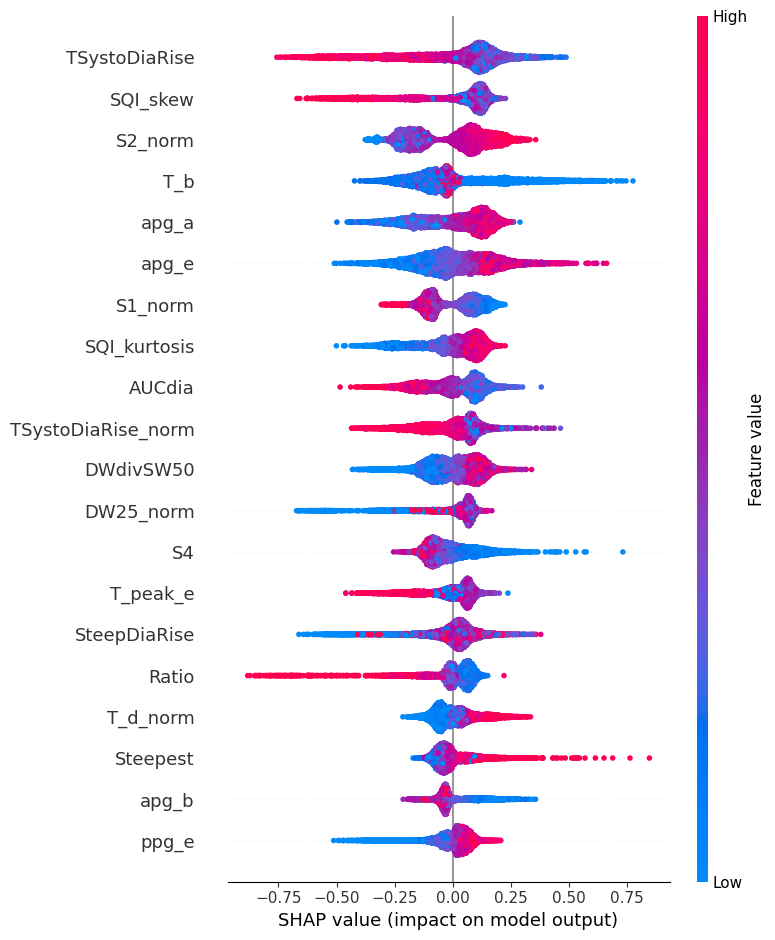

In [17]:
shap.summary_plot(explanation[:,:,2], train_X.loc[random_idx])

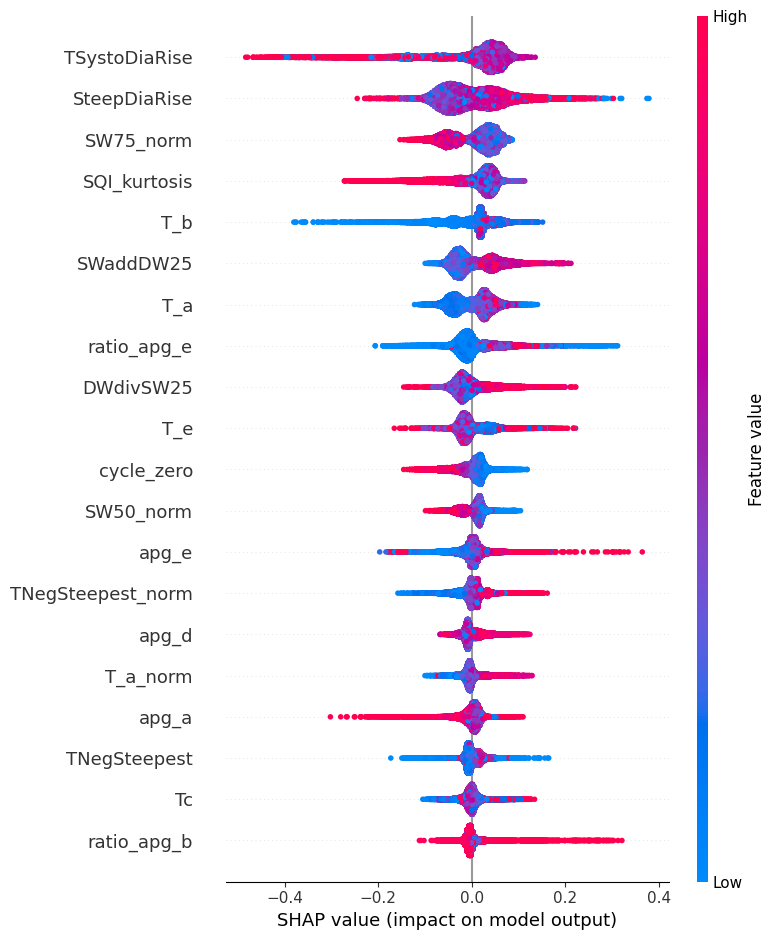

In [ ]:
shap.summary_plot(explanation[:,:,1], train_X)

In [ ]:
clustering = shap.utils.hclust(train_X.loc[random_idx], train_Y.loc[random_idx])


f:\minowa\BloodPressureEstimation\.venv\lib\site-packages\xgboost\data.py:364: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):
9605it [02:43, 54.92it/s]                          


NameError: name 'shap_values' is not defined

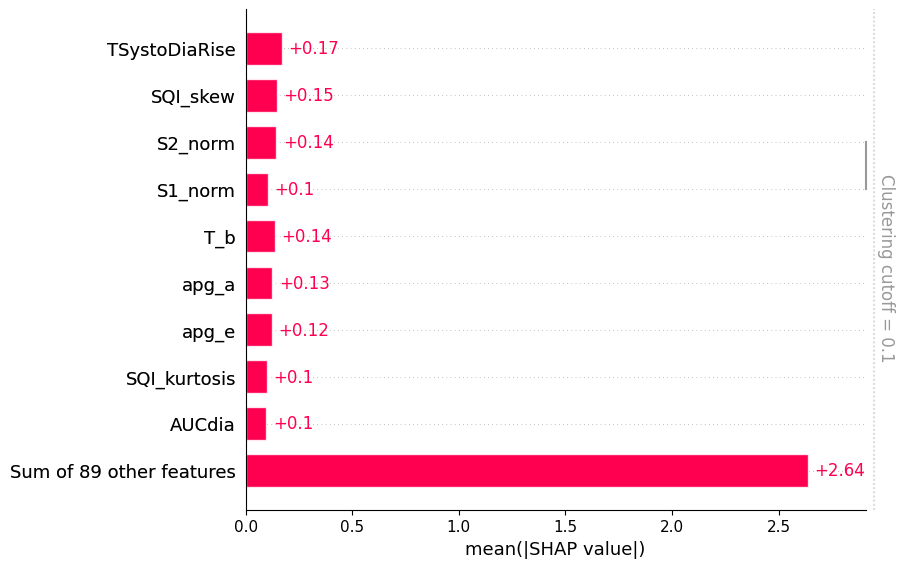

In [77]:
shap.plots.bar(explanation[:,:,2], clustering=clustering,clustering_cutoff=0.097351025)

In [18]:
type(explanation[:,"Td",1].data)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

### scatter plot

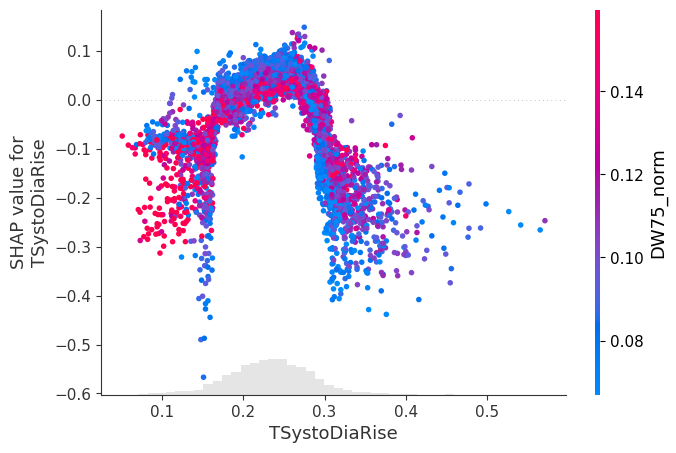

In [21]:
shap.plots.scatter(explanation[:,"TSystoDiaRise",1],color=explanation[:,:,1])

- 0 : T_e
- 1 : SWaddDW75_norm
- 2 : ratio_apb_b


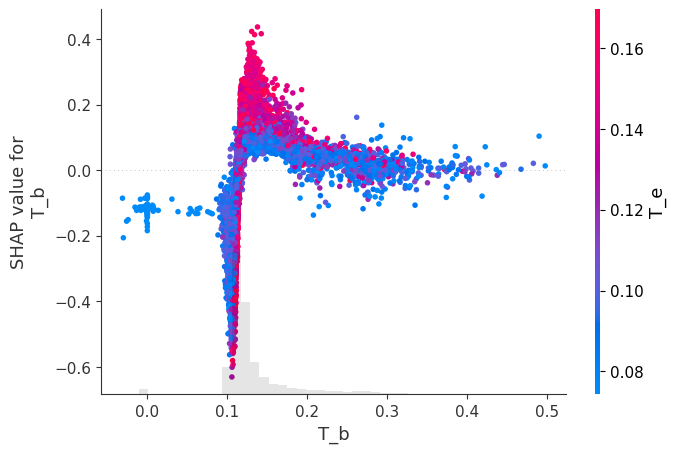

In [24]:
shap.plots.scatter(explanation[:,"T_b",0],color=explanation[:,:,1])

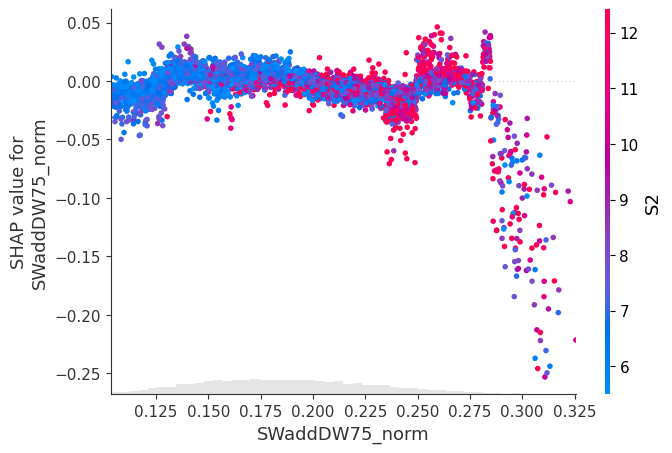

In [26]:
target = explanation[:,"SWaddDW75_norm",1]
shap.plots.scatter(target,xmin=target.percentile(1),xmax=target.percentile(99.9),color=explanation[:,:,1])

### heatmap

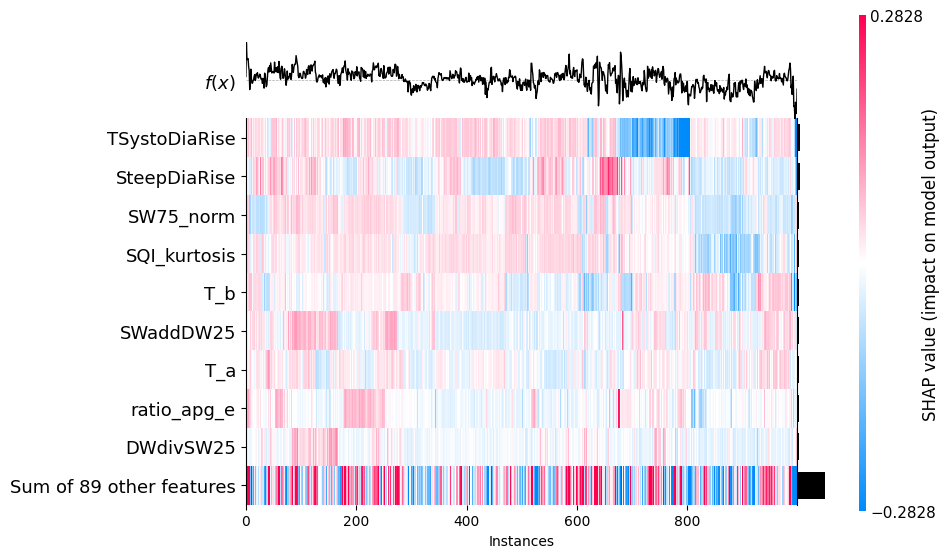

<Axes: xlabel='Instances'>

In [37]:
shap.plots.heatmap(explanation[:,:,1])

In [52]:
explainer.expected_value,shap_values.shape,explanation.shape

([-1.4046756501220257, -0.992444040746868, -1.5105676255641365],
 (98, 3),
 (1000, 98, 3))

In [63]:
shap_values.shape

(54892, 98, 3)

In [66]:
explanation = shap.Explanation(shap_values[random_idx], feature_names=test_X.columns)

In [68]:
explanation.shape

(1000, 98, 3)

In [59]:
test_X.shape

(54892, 98)

In [ ]:
def class_labels(row_index):
    return [f"Class {i + 1} ({heart_predictions[row_index, i].round(2):.2f})" for i in range(class_count)]

### decision plot

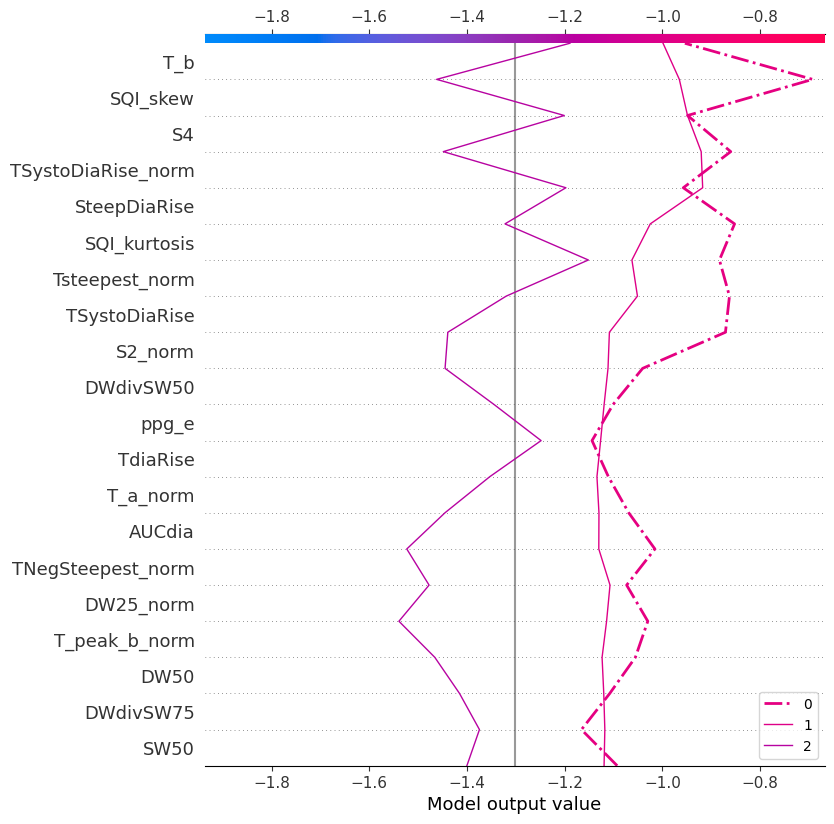

In [74]:
row_index = 20
shap.multioutput_decision_plot(
    explainer.expected_value,
    [shap_values[ :100, :,0], shap_values[ :100, :,1], shap_values[ :100, :,2]],
    row_index=row_index,
    feature_names=test_X.columns.tolist(),
    highlight=[np.argmax(test_Y.iloc[row_index])],
    legend_labels=["0", "1","2"],
    legend_location="lower right",
)

In [ ]:
shap.decision_plot(
    expected_value,
    shap_interaction_values[misclassified],
    features_display[misclassified],
    link="logit",
)

In [40]:
expected_value = explainer.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")
select = range(20)
features = test_X.loc[random_idx[:20]].iloc[select]
shap_values = explainer.shap_values(features)[1]
shap_interaction_values = explainer.shap_interaction_values(features)
if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

Explainer expected value: -0.992444040746868


In [41]:
shap.decision_plot(expected_value, shap_values, features_display)

NameError: name 'features_display' is not defined

In [11]:
results[0]['cm']

array([[ 9419,  2633],
       [ 2838, 11114]], dtype=int64)

In [12]:
test_Y.value_counts()

sbp_class
1    13952
0    12052
Name: count, dtype: int64

In [13]:
print(results[0]['accuracy'], results[0]['f1'])

0.7896092908783264 0.7887115835333143


In [89]:
acc_list,f1_list

([0.7896092908783264,
  0.7855329949238579,
  0.7926088294108599,
  0.7897246577449624,
  0.7920319950776804],
 [0.7887115835333143,
  0.7850497316071676,
  0.7916136874723307,
  0.7890264077036069,
  0.7910836633278233])

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score

# --- 1. Accuracy / F1 scoreの可視化 ---
def plot_metric_over_folds(results,importance_df):
    acc_list = [r['accuracy'] for r in results]
    f1_list = [r['f1'] for r in results]

    plt.figure(figsize=(8,4))
    plt.plot(range(len(results)), acc_list, marker='o', label='Accuracy')
    plt.plot(range(len(results)), f1_list, marker='s', label='F1 (macro)')
    # text for each point
    for i in range(len(results)):
        plt.text(i, acc_list[i]+0.02, f"{acc_list[i]:.2f}", ha='center', va='bottom')
        plt.text(i, f1_list[i]-0.04, f"{f1_list[i]:.2f}", ha='center', va='top')
    plt.xticks(range(len(results)), [f'Fold {i}' for i in range(len(results))])
    plt.ylim(0,1)
    plt.xlabel('Fold')
    plt.ylabel('Score')
    plt.title('Accuracy and F1 score per fold')
    plt.legend()
    plt.grid(True)
    plt.show()

    # --- 2. 混同行列の可視化（平均） ---
    # 複数foldの平均混同行列
    cm_sum = np.sum([r['cm'] for r in results], axis=0)
    cm_avg = cm_sum / len(results)

    plt.figure(figsize=(6,5))
    sns.heatmap(cm_avg, annot=True, fmt=".1f", cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Average Confusion Matrix over folds')
    plt.show()

    # --- 3. Feature Importanceの可視化 ---
    # foldごとの重要度の平均
    importance_df['mean_importance'] = importance_df[[f'importance_fold{i}' for i in range(len(results))]].mean(axis=1)
    importance_df_sorted = importance_df.sort_values(by='mean_importance', ascending=False)

    plt.figure(figsize=(10,6))
    sns.barplot(x='mean_importance', y='feature', data=importance_df_sorted[:20])
    plt.title('Mean Feature Importance (Gain) across folds')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.show()


## voting 

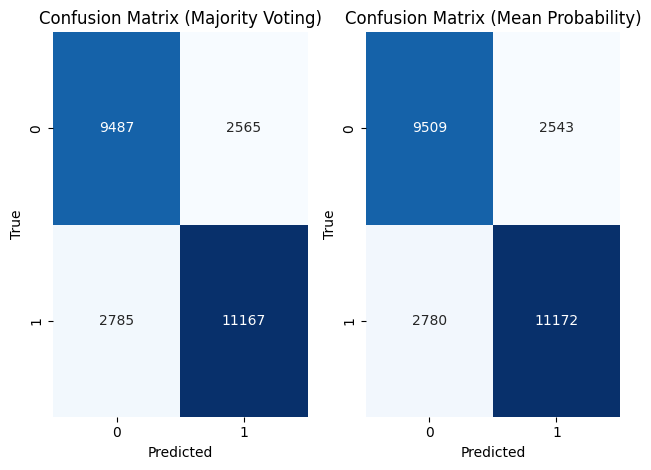

0.7934001013766827 0.7944601017999093


In [91]:
# majority voting
y_pred_voted = np.zeros_like(results[0]['pred_test'])
for r in results:
    y_pred_voted += r['pred_test']
y_pred_voted = (y_pred_voted >= (len(results) / 2)).astype(int)    
# mean
y_pred_mean_prob = np.mean([r['pred_test_prob'] for r in results], axis=0)
y_pred_mean = (y_pred_mean_prob >= 0.5).astype(int)

# plot cm with 2 columns
plt.subplot(1, 2, 1)
cm_voted = confusion_matrix(test_Y, y_pred_voted)
sns.heatmap(cm_voted, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix (Majority Voting)')
plt.xlabel('Predicted') 
plt.ylabel('True')  
plt.subplot(1, 2, 2)
cm_mean = confusion_matrix(test_Y, y_pred_mean)
sns.heatmap(cm_mean, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix (Mean Probability)')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()

print(f1_score(test_Y, y_pred_voted,average='macro'), f1_score(test_Y, y_pred_mean,average='macro'))

## oof

In [127]:
train_df, test_df = add_class(classes=2, boundary=120)
folds = get_groupkf(train_df,k=5, group_col='subject',y_col='sbp_class', random_state=42,get_holdout=True)
test_X, test_Y = get_dataset(test_df,return_raw=True)
params = {
    'objective': 'binary',
    'metric': 'binary_error',
    'boosting_type': 'gbdt',
    'learning_rate': 0.05,
    "min_data_in_leaf": 200,
    'num_leaves': 31,
    'max_depth': -1,
    'verbose': -1,
    'random_state': 42,
    'device':'gpu'
}
importance_df = pd.DataFrame({"feature": test_X.columns})
results = []
if test_Y.ndim>1:
    # softlabel
    params['objective'] = 'cross_entropy'
    params['metric'] = 'cross_entropy'
    params['num_class'] =1
elif test_Y.nunique() > 2:
    params['objective'] = 'multiclass'
    params['metric'] = 'multi_error'
    params['num_class'] = test_X.get_label().nunique()
# --- モデル学習 ---
for f in range(5):
    lgb_train,_val,_hold = folds[f]
    val_X, val_Y = _val
    hold_X, hold_Y = _hold
    lgb_val = lgb.Dataset(val_X, label=val_Y) 
    model = lgb.train(
        params,
        lgb_train,
        valid_sets=[lgb_train, lgb_val],
        valid_names=['train', 'val'],
        num_boost_round=2000,
        callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=200)],
    )
    # --- 予測 ---
    pred_Y_prob = model.predict(test_X, num_iteration=model.best_iteration)
    pred_Y_prob_val = model.predict(val_X, num_iteration=model.best_iteration)
    pred_Y_prob_hold = model.predict(hold_X, num_iteration=model.best_iteration)
    pred_Y_test = np.argmax(pred_Y_prob, axis=1) if test_Y.nunique() > 2 else (pred_Y_prob >= 0.5).astype(int)
    pred_Y_val = np.argmax(pred_Y_prob_val, axis=1) if val_Y.nunique() > 2 else (pred_Y_prob_val >= 0.5).astype(int)
    pred_Y_hold = np.argmax(pred_Y_prob_hold, axis=1) if hold_Y.nunique() > 2 else (pred_Y_prob_hold >= 0.5).astype(int)
    # --- 評価 ---
    acc = accuracy_score(test_Y, pred_Y_test)
    cm = confusion_matrix(test_Y, pred_Y_test)
    f1 = f1_score(test_Y, pred_Y_test,average='macro')
    # --- Feature Importance ---
    importance_df[f'importance_fold{f}'] = model.feature_importance(importance_type='gain')
    # --- 結果保存 ---
    res = {"accuracy" :acc,
           "f1":f1,
           "cm":cm,
           "fold":f,
           "pred_test_prob":pred_Y_prob,
           "pred_val_prob":pred_Y_prob_val,
            "pred_hold_prob":pred_Y_prob_hold,
           "pred_test":pred_Y_test,
           "pred_val":pred_Y_val,
            "pred_hold":pred_Y_hold,
              "true_test":test_Y,
                "true_val":val_Y,
                "true_hold":hold_Y
           } 
    results.append(res)
    print(f"Fold {f} - F1: {f1:.4f}, Accuracy: {acc:.4f}")

set()
set()
set()
set()
set()
Training until validation scores don't improve for 50 rounds
[200]	train's binary_error: 0.253293	val's binary_error: 0.295169
Early stopping, best iteration is:
[245]	train's binary_error: 0.247687	val's binary_error: 0.293689
Fold 0 - F1: 0.6585, Accuracy: 0.6592
Training until validation scores don't improve for 50 rounds
[200]	train's binary_error: 0.253284	val's binary_error: 0.315978
[400]	train's binary_error: 0.230753	val's binary_error: 0.314378
Early stopping, best iteration is:
[381]	train's binary_error: 0.232681	val's binary_error: 0.31328
Fold 1 - F1: 0.6595, Accuracy: 0.6608
Training until validation scores don't improve for 50 rounds
[200]	train's binary_error: 0.254683	val's binary_error: 0.295055
Early stopping, best iteration is:
[214]	train's binary_error: 0.252799	val's binary_error: 0.294902
Fold 2 - F1: 0.6565, Accuracy: 0.6570
Training until validation scores don't improve for 50 rounds
[200]	train's binary_error: 0.250627	val's bin

In [16]:
val_f1 = [f1_score(fold['true_val'], fold['pred_val'], average='macro') for fold in results]
hold_f1 = [f1_score(fold['true_hold'], fold['pred_hold'], average='macro') for fold in results]
print("Validation F1 scores:", val_f1)
print("Holdout F1 scores:", hold_f1)

Validation F1 scores: [0.7774961367854492, 0.7695595684514183, 0.7983482132037973, 0.7802144988324513, 0.7701603173213396]
Holdout F1 scores: [0.7701986277599696, 0.7603463921521965, 0.767017623132441, 0.7869975311533844, 0.7690759669308878]


In [17]:
val_X.head()

,Tc,Ts,Td,Tsteepest,Steepest,TNegSteepest,NegSteepest,TdiaRise,DiaRise,SteepDiaRise,...,T_peak_a_norm,T_peak_b_norm,T_peak_c_norm,T_peak_d_norm,T_peak_e_norm,AI,bd,bcda,sdoo,cycle_zero
58,0.969600,0.347200,0.6224,0.264000,0.062619,0.407200,-0.036731,0.6168,0.135759,-0.009715,...,0.285498,0.025150,-0.008383,0.000000,0.100095,14.874336,-0.008509,20.089726,0.000414,0.039487
59,0.895200,0.301600,0.5936,0.213600,0.065465,0.360000,-0.031342,0.5592,0.203851,-0.015076,...,0.219846,0.030457,0.087477,0.155862,0.224911,-4.913014,-0.002431,-3.891054,0.179609,0.021700
60,0.765333,0.169333,0.5960,0.097333,0.076425,0.230000,-0.067473,0.4100,0.105358,0.004884,...,0.165515,0.031361,-0.029607,0.000000,0.138494,0.801312,-0.013751,1.562892,0.000665,0.031630
73,0.613500,0.176000,0.4375,0.089500,0.055392,0.246500,-0.035190,0.3790,0.254538,-0.007382,...,0.239606,0.040751,0.018816,0.031859,0.254346,0.255853,-0.006217,0.630718,0.036548,0.129052
74,0.635200,0.182400,0.4528,0.093333,0.065727,0.255467,-0.045975,0.3920,0.153662,-0.005712,...,0.240136,0.038632,-0.012596,0.000000,0.238459,0.561283,-0.008364,1.030144,0.000240,0.034810


### 3class

In [182]:
train_df, test_df = add_class( classes=3, boundary=None)
test_Y = test_df['sbp_class']
test_Y.nunique()

3


3

In [184]:
train_df, test_df = add_class(classes=3, boundary=None)
folds = get_groupkf(train_df,k=5, group_col='subject',y_col='sbp_class', random_state=42,get_holdout=True)
test_X, test_Y = get_dataset(test_df,return_raw=True)
params = {
    'objective': 'binary',
    'metric': 'binary_error',
    'boosting_type': 'gbdt',
    'learning_rate': 0.05,
    "min_data_in_leaf": 200,
    'num_leaves': 31,
    'max_depth': -1,
    'verbose': -1,
    'random_state': 42,
    'device':'cpu'
}
importance_df = pd.DataFrame({"feature": test_X.columns})
results = []
if test_Y.ndim>1:
    # softlabel
    params['objective'] = 'cross_entropy'
    params['metric'] = 'cross_entropy'
    params['num_class'] =1
elif test_Y.nunique() > 2:
    params['objective'] = 'multiclass'
    params['metric'] = 'multi_error'
    params['num_class'] = test_Y.nunique()

# --- モデル学習 ---
importance_df3 = pd.DataFrame({"feature": test_X.columns})
results3 = []
for f in range(5):
    lgb_train,_val,_hold = folds[f]
    val_X, val_Y = _val
    hold_X, hold_Y = _hold
    lgb_val = lgb.Dataset(val_X, label=val_Y) 
    model = lgb.train(
        params,
        lgb_train,
        valid_sets=[lgb_train, lgb_val],
        valid_names=['train', 'val'],
        num_boost_round=2000,
        callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=200)],
    )
    # --- 予測 ---
    pred_Y_prob_test = model.predict(test_X, num_iteration=model.best_iteration)
    pred_Y_prob_val = model.predict(val_X, num_iteration=model.best_iteration)
    pred_Y_prob_hold = model.predict(hold_X, num_iteration=model.best_iteration)
    print(pred_Y_prob_test.shape, test_Y.shape)
    pred_Y_test = np.argmax(pred_Y_prob_test, axis=1) if test_Y.nunique() > 2 else (pred_Y_prob_test >= 0.5).astype(int)
    pred_Y_val = np.argmax(pred_Y_prob_val, axis=1) if val_Y.nunique() > 2 else (pred_Y_prob_val >= 0.5).astype(int)
    pred_Y_hold = np.argmax(pred_Y_prob_hold, axis=1) if hold_Y.nunique() > 2 else (pred_Y_prob_hold >= 0.5).astype(int)
    # --- 評価 ---
    acc = accuracy_score(test_Y, pred_Y_test)
    cm = confusion_matrix(test_Y, pred_Y_test)
    f1 = f1_score(test_Y, pred_Y_test,average='macro')
    # --- Feature Importance ---
    importance_df3[f'importance_fold{f}'] = model.feature_importance(importance_type='gain')
    # --- 結果保存 ---
    res = {"accuracy" :acc,
           "f1":f1,
           "cm":cm,
           "fold":f,
           "pred_test_prob":pred_Y_prob_test,
           "pred_val_prob":pred_Y_prob_val,
            "pred_hold_prob":pred_Y_prob_hold,
           "pred_test":pred_Y_test,
           "pred_val":pred_Y_val,
            "pred_hold":pred_Y_hold,
              "true_test":test_Y,
                "true_val":val_Y,
                "true_hold":hold_Y
           } 
    results3.append(res)
    print(f"Fold {f} - F1: {f1:.4f}, Accuracy: {acc:.4f}")

3
set()
set()
set()
set()
set()
Training until validation scores don't improve for 50 rounds
[200]	train's multi_error: 0.354493	val's multi_error: 0.50383
[400]	train's multi_error: 0.317688	val's multi_error: 0.495591
[600]	train's multi_error: 0.292228	val's multi_error: 0.492962
[800]	train's multi_error: 0.271873	val's multi_error: 0.491082
[1000]	train's multi_error: 0.254691	val's multi_error: 0.489245
Early stopping, best iteration is:
[951]	train's multi_error: 0.258715	val's multi_error: 0.48892
(54892, 3) (54892,)
Fold 0 - F1: 0.5173, Accuracy: 0.5207
Training until validation scores don't improve for 50 rounds
[200]	train's multi_error: 0.35314	val's multi_error: 0.486788
Early stopping, best iteration is:
[324]	train's multi_error: 0.329046	val's multi_error: 0.484194
(54892, 3) (54892,)
Fold 1 - F1: 0.5180, Accuracy: 0.5175
Training until validation scores don't improve for 50 rounds
[200]	train's multi_error: 0.354202	val's multi_error: 0.483179
[400]	train's multi_error

In [26]:
pred_Y_prob_test[:5]

array([[0.64420057, 0.29587045, 0.05992898],
       [0.50396127, 0.31897466, 0.17706406],
       [0.33723462, 0.35822234, 0.30454304],
       [0.79582812, 0.18858704, 0.01558484],
       [0.91133054, 0.08427407, 0.0043954 ]])

In [9]:
val_Y.value_counts()

sbp_class
2    17349
0    15948
Name: count, dtype: int64

### stacking

In [24]:
len(results)

0

In [26]:
oof_2c = [r['pred_hold_prob'] for r in results]
oof_2c = np.concatenate(oof_2c)
oof_df = pd.DataFrame(oof_2c, columns=['prob_class0'])
hold_idx = [folds[f][2][0].index for f in range(5)]
oof_df['hold_index'] = np.concatenate(hold_idx)
oof_df = oof_df.set_index('hold_index')

In [28]:
df_train, df_test = add_class(classes=2, boundary=None)
print(df_train.shape, df_test.shape)
# print(df_train.shape, df_test.shape)
df_train['oof_prob_class0'] = oof_df['prob_class0'].loc[oof_df.index]
print(df_train.shape, df_test.shape)
test_X, test_Y = get_dataset(df_test,return_raw=True)
print(test_X.shape, test_Y.shape)
oof_test = [r['pred_test_prob'] for r in results]
test_X['oof_prob_class0'] = np.mean(oof_test, axis=0)
print(test_X.shape, test_Y.shape)

3
(214520, 104) (26004, 104)
(214520, 105) (26004, 104)
(26004, 98) (26004,)
(26004, 99) (26004,)


In [103]:
test_X.shape,test_X.columns

((26004, 99),
 Index(['Tc', 'Ts', 'Td', 'Tsteepest', 'Steepest', 'TNegSteepest',
        'NegSteepest', 'TdiaRise', 'DiaRise', 'SteepDiaRise', 'TSystoDiaRise',
        'TdiaToEnd', 'Ratio', 'Ts_norm', 'Td_norm', 'Tsteepest_norm',
        'TNegSteepest_norm', 'TdiaRise_norm', 'TSystoDiaRise_norm',
        'TdiaToEnd_norm', 'SW25', 'SW25_norm', 'DW25', 'DW25_norm', 'SWaddDW25',
        'SWaddDW25_norm', 'DWdivSW25', 'SW50', 'SW50_norm', 'DW50', 'DW50_norm',
        'SWaddDW50', 'SWaddDW50_norm', 'DWdivSW50', 'SW75', 'SW75_norm', 'DW75',
        'DW75_norm', 'SWaddDW75', 'SWaddDW75_norm', 'DWdivSW75', 'S1', 'S2',
        'S3', 'S4', 'AUCsys', 'AUCdia', 'S1_norm', 'S2_norm', 'S3_norm',
        'S4_norm', 'AUCsys_norm', 'AUCdia_norm', 'SQI_skew', 'SQI_kurtosis',
        'apg_a', 'apg_b', 'apg_c', 'apg_d', 'apg_e', 'ppg_a', 'ppg_b', 'ppg_c',
        'ppg_d', 'ppg_e', 'ratio_apg_b', 'ratio_apg_c', 'ratio_apg_d',
        'ratio_apg_e', 'ratio_ppg_b', 'ratio_ppg_c', 'ratio_ppg_d',
        'rati

In [30]:
folds = get_groupkf(df_train,k=5, group_col='subject',y_col='sbp_class', random_state=42,get_holdout=False)
folds[0][1][0].shape
# test_X, test_Y = get_dataset(test_df,return_raw=True)

set()
set()
set()
set()
set()


(44249, 99)

In [31]:
params = {
    'objective': 'binary',
    'metric': 'binary_error',
    'boosting_type': 'gbdt',
    'learning_rate': 0.05,
    "min_data_in_leaf": 200,
    'num_leaves': 31,
    'max_depth': -1,
    'verbose': -1,
    'random_state': 42,
}
importance_df = pd.DataFrame({"feature": test_X.columns})
results = []
if test_Y.ndim>1:
    # softlabel
    params['objective'] = 'cross_entropy'
    params['metric'] = 'cross_entropy'
    params['num_class'] =1
elif test_Y.nunique() > 2:
    params['objective'] = 'multiclass'
    params['metric'] = 'multi_error'
    params['num_class'] = test_X.get_label().nunique()
# --- モデル学習 ---
for f in range(5):
    lgb_train,_val = folds[f]
    val_X, val_Y = _val
    lgb_val = lgb.Dataset(val_X, label=val_Y) 
    model = lgb.train(
        params,
        lgb_train,
        valid_sets=[lgb_train, lgb_val],
        valid_names=['train', 'val'],
        num_boost_round=2000,
        callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=100)],
    )
    # --- 予測 ---
    pred_Y_prob = model.predict(test_X, num_iteration=model.best_iteration)
    pred_Y_prob_val = model.predict(val_X, num_iteration=model.best_iteration)
    pred_Y_test = np.argmax(pred_Y_prob, axis=1) if test_Y.nunique() > 2 else (pred_Y_prob >= 0.5).astype(int)
    pred_Y_val = np.argmax(pred_Y_prob_val, axis=1) if val_Y.nunique() > 2 else (pred_Y_prob_val >= 0.5).astype(int)
    # --- 評価 ---
    acc = accuracy_score(test_Y, pred_Y_test)
    cm = confusion_matrix(test_Y, pred_Y_test)
    f1 = f1_score(test_Y, pred_Y_test,average='macro')
    # --- Feature Importance ---
    importance_df[f'importance_fold{f}'] = model.feature_importance(importance_type='gain')
    # --- 結果保存 ---
    res = {"accuracy" :acc,
           "f1":f1,
           "cm":cm,
           "fold":f,
           "pred_test_prob":pred_Y_prob,
           "pred_val_prob":pred_Y_prob_val,
           "pred_test":pred_Y_test,
           "pred_val":pred_Y_val,
           "true":test_Y
           } 
    results.append(res)
    print(f"Fold {f} - F1: {f1:.4f}, Accuracy: {acc:.4f}")
# --- 可視化 ---
# plt.figure(figsize=(8, 6))
# plt.barh(importance_df['feature'][:20][::-1], importance_df['importance'][:20][::-1])
# plt.xlabel("Feature Importance (gain)")
# plt.title("Top 20 Feature Importances")
# plt.tight_layout()
# plt.show()
# print(f"F1 Score: {f1:.4f}")
# print(f"Accuracy: {acc:.4f}")
# print("Confusion Matrix:")
# print(cm)
# print("\nClassification Report:")
# print(classification_report(test_Y, y_pred))
# # print confusion matrix as heatmap
# import seaborn as sns
# plt.figure(figsize=(6, 5))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
# plt.xlabel("Predicted Label")
# plt.ylabel("True Label")
# plt.title("Confusion Matrix Heatmap")
# plt.show()  

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[29]	train's binary_error: 0.20893	val's binary_error: 0.233067
Fold 0 - F1: 0.7976, Accuracy: 0.7992
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[4]	train's binary_error: 0.21652	val's binary_error: 0.237407
Fold 1 - F1: 0.7988, Accuracy: 0.8004
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[3]	train's binary_error: 0.215634	val's binary_error: 0.24725
Fold 2 - F1: 0.7968, Accuracy: 0.7992
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[10]	train's binary_error: 0.222853	val's binary_error: 0.21111
Fold 3 - F1: 0.7961, Accuracy: 0.7977
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[25]	train's binary_error: 0.214226	val's binary_error: 0.224707
Fold 4 - F1: 0.7979, Accuracy: 0.7992


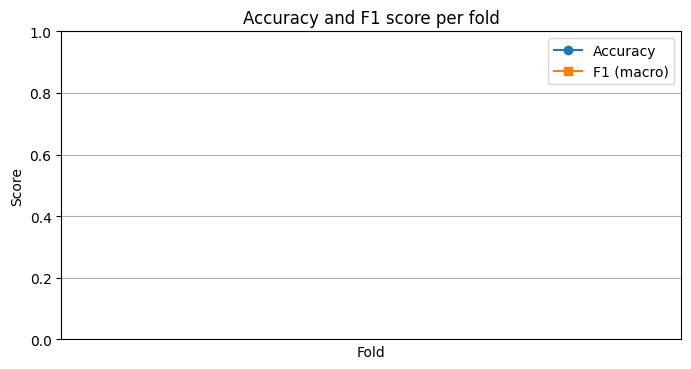

C:\Users\bsa\AppData\Local\Temp\ipykernel_4176\4164996331.py:31: RuntimeWarning: invalid value encountered in scalar divide
  cm_avg = cm_sum / len(results)


ValueError: Must pass 2-d input. shape=()

<Figure size 600x500 with 0 Axes>

In [72]:
plot_metric_over_folds(results, importance_df)

### regression

In [185]:
oof_3c = [r['pred_hold_prob'] for r in results3]
oof_3c = np.concatenate(oof_3c)
oof_df3 = pd.DataFrame(oof_3c, columns=['prob_class0','prob_class1','prob_class2'])
hold_idx = [folds[f][2][0].index for f in range(5)]
oof_df3['hold_index'] = np.concatenate(hold_idx)
oof_df3 = oof_df3.set_index('hold_index')

In [186]:
oof_df3.head()

,prob_class0,prob_class1,prob_class2
hold_index,,,
18,0.470059,0.237874,0.292067
30,0.827384,0.157352,0.015264
31,0.808190,0.166886,0.024924
47,0.861052,0.118403,0.020545
49,0.618955,0.324983,0.056062


In [45]:
results3[0]['pred_test_prob'].shape 

(54892, 3)

In [192]:
df_train, df_test = add_class(classes=3, boundary=None)
print(df_train.shape, df_test.shape)
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# df_train = pd.DataFrame(scaler.fit_transform(df_train.values), columns=df_train.columns)
# df_test = pd.DataFrame(scaler.transform(df_test.values), columns=df_test.columns)
y_column_no = df_train.columns.tolist().index('sbp')
# scale, mean = scaler.scale_[y_column_no], scaler.mean_[y_column_no]
# print(df_train.shape, df_test.shape)
df_train['oof_prob_class0'] = oof_df3['prob_class0'].loc[oof_df3.index]
df_train['oof_prob_class1'] = oof_df3['prob_class1'].loc[oof_df3.index]
df_train['oof_prob_class2'] = oof_df3['prob_class2'].loc[oof_df3.index]
print(df_train.shape, df_test.shape)
test_X, test_Y = get_dataset(df_test,return_raw=True)
print(test_X.shape, test_Y.shape)
oof_test = [r['pred_test_prob'] for r in results3]
test_X['oof_prob_class0'] = np.mean([o[:,0] for o in oof_test], axis=0)
test_X['oof_prob_class1'] = np.mean([o[:,1] for o in oof_test], axis=0)
test_X['oof_prob_class2'] = np.mean([o[:,2] for o in oof_test], axis=0)
print(test_X.shape, test_Y.shape)

3
(448377, 104) (54892, 104)
(448377, 107) (54892, 104)
(54892, 98) (54892,)
(54892, 101) (54892,)


In [193]:
test_X, test_Y = get_dataset(df_test,return_raw=True)
print(test_X.shape, test_Y.shape)
oof_test = [r['pred_test_prob'] for r in results3]
test_X['oof_prob_class0'] = np.mean([o[:,0] for o in oof_test], axis=0)
test_X['oof_prob_class1'] = np.mean([o[:,1] for o in oof_test], axis=0)
test_X['oof_prob_class2'] = np.mean([o[:,2] for o in oof_test], axis=0)
print(test_X.shape, test_Y.shape)

(54892, 98) (54892,)
(54892, 101) (54892,)


In [62]:
df_train.columns.tolist()

['Tc',
 'Ts',
 'Td',
 'Tsteepest',
 'Steepest',
 'TNegSteepest',
 'NegSteepest',
 'TdiaRise',
 'DiaRise',
 'SteepDiaRise',
 'TSystoDiaRise',
 'TdiaToEnd',
 'Ratio',
 'Ts_norm',
 'Td_norm',
 'Tsteepest_norm',
 'TNegSteepest_norm',
 'TdiaRise_norm',
 'TSystoDiaRise_norm',
 'TdiaToEnd_norm',
 'SW25',
 'SW25_norm',
 'DW25',
 'DW25_norm',
 'SWaddDW25',
 'SWaddDW25_norm',
 'DWdivSW25',
 'SW50',
 'SW50_norm',
 'DW50',
 'DW50_norm',
 'SWaddDW50',
 'SWaddDW50_norm',
 'DWdivSW50',
 'SW75',
 'SW75_norm',
 'DW75',
 'DW75_norm',
 'SWaddDW75',
 'SWaddDW75_norm',
 'DWdivSW75',
 'S1',
 'S2',
 'S3',
 'S4',
 'AUCsys',
 'AUCdia',
 'S1_norm',
 'S2_norm',
 'S3_norm',
 'S4_norm',
 'AUCsys_norm',
 'AUCdia_norm',
 'SQI_skew',
 'SQI_kurtosis',
 'apg_a',
 'apg_b',
 'apg_c',
 'apg_d',
 'apg_e',
 'ppg_a',
 'ppg_b',
 'ppg_c',
 'ppg_d',
 'ppg_e',
 'ratio_apg_b',
 'ratio_apg_c',
 'ratio_apg_d',
 'ratio_apg_e',
 'ratio_ppg_b',
 'ratio_ppg_c',
 'ratio_ppg_d',
 'ratio_ppg_e',
 'T_a',
 'T_b',
 'T_c',
 'T_d',
 'T_e',
 'T

In [56]:
df_test.select_dtypes(include=[np.number]).shape,df_train.select_dtypes(include=[np.number]).shape

((54892, 104), (448377, 107))

In [194]:

# train_df, test_df = add_class(classes=3, boundary=None)
results = []
f=0
# test_X,test_Y = get_dataset(test_df, return_raw=True)
gkf = GroupKFold(n_splits=5) 
for train_idx, val_idx in gkf.split(df_train, groups=df_train['subject']):
    train_X = df_train.iloc[train_idx].drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin","bp_class"],axis=1,errors='ignore')
    train_Y = df_train.iloc[train_idx]['sbp_class']
    val_Y = df_train.iloc[val_idx]['sbp_class']
    val_X = df_train.iloc[val_idx].drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin","bp_class"],axis=1,errors='ignore')
    params = {
    'objective': 'binary',
    'metric': 'binary_error',
    'boosting_type': 'gbdt',
    'learning_rate': 0.05,
    "min_data_in_leaf": 200,
    'num_leaves': 31,
    'max_depth': -1,
    'verbose': -1,
    'random_state': 42,
    }
    importance_df = pd.DataFrame({"feature": test_X.columns})
    if test_Y.ndim>1:
        # softlabel
        params['objective'] = 'cross_entropy'
        params['metric'] = 'cross_entropy'
        params['num_class'] =1
    elif test_Y.nunique() > 2:
        params['objective'] = 'multiclass'
        params['metric'] = 'multi_error'
        params['num_class'] = test_Y.nunique()
    # --- モデル学習 ---
    lgb_train = lgb.Dataset(train_X, label=train_Y,weight=compute_sample_weight(class_weight='balanced', y=train_Y)) 
    lgb_val = lgb.Dataset(val_X, label=val_Y) 
    model = lgb.train(
        params,
        lgb_train,
        valid_sets=[lgb_train, lgb_val],
        valid_names=['train', 'val'],
        num_boost_round=2000,
        callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=300)],
    )
    # --- 予測 ---
    pred_Y_prob = model.predict(test_X, num_iteration=model.best_iteration)
    pred_Y_prob_val = model.predict(val_X, num_iteration=model.best_iteration)
    pred_Y_test = np.argmax(pred_Y_prob, axis=1) if test_Y.nunique() > 2 else (pred_Y_prob >= 0.5).astype(int)
    pred_Y_val = np.argmax(pred_Y_prob_val, axis=1) if val_Y.nunique() > 2 else (pred_Y_prob_val >= 0.5).astype(int)
    # --- 評価 ---
    acc = accuracy_score(test_Y, pred_Y_test)
    cm = confusion_matrix(test_Y, pred_Y_test)
    f1 = f1_score(test_Y, pred_Y_test,average='macro')
    # --- Feature Importance ---
    importance_df[f'importance_fold0'] = model.feature_importance(importance_type='gain')
    res = {"accuracy" :acc,
           "f1":f1,
           "cm":cm,
           "fold":f,                
        "pred_test_prob":pred_Y_prob,   
        "pred_val_prob":pred_Y_prob_val,
           "pred_test":pred_Y_test,
           "pred_val":pred_Y_val,
           "true":test_Y
           } 
    results.append(res)
    print(f"Fold {f} - F1: {f1:.4f}, Accuracy: {acc:.4f}")
    f+=1
# --- 可視化 ---

Training until validation scores don't improve for 50 rounds
[300]	train's multi_error: 0.354337	val's multi_error: 0.499604
[600]	train's multi_error: 0.307387	val's multi_error: 0.491051
[900]	train's multi_error: 0.274497	val's multi_error: 0.48504
[1200]	train's multi_error: 0.249136	val's multi_error: 0.480624
[1500]	train's multi_error: 0.2288	val's multi_error: 0.476231
[1800]	train's multi_error: 0.21157	val's multi_error: 0.472473
Did not meet early stopping. Best iteration is:
[1997]	train's multi_error: 0.201043	val's multi_error: 0.470176
Fold 0 - F1: 0.5237, Accuracy: 0.5305
Training until validation scores don't improve for 50 rounds
[300]	train's multi_error: 0.354572	val's multi_error: 0.509517
[600]	train's multi_error: 0.309523	val's multi_error: 0.499337
[900]	train's multi_error: 0.276287	val's multi_error: 0.491876
[1200]	train's multi_error: 0.251118	val's multi_error: 0.484762
Early stopping, best iteration is:
[1234]	train's multi_error: 0.24844	val's multi_erro

In [195]:
mean_f1 = np.mean([results[f]['f1'] for f in range(len(results))])
mean_f1

0.525921973633214

In [ ]:
from sklearn.model_selection import GroupKFold
gkf = GroupKFold(n_splits=5)
# folds = get_groupkf(df_train,k=5, group_col='subject',y_col='sbp', random_state=42,get_holdout=False)
for train_idx, val_idx in gkf.split(df_train, groups=df_train['subject']):
    train_X = df_train.iloc[train_idx].drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin"],axis=1)
    train_Y = df_train.iloc[train_idx]['sbp']
    val_Y = df_train.iloc[val_idx]['sbp']
    val_X = df_train.iloc[val_idx].drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin"],axis=1)
    print(train_X.shape, val_X.shape, train_Y.shape, val_Y.shape)
    lgb_val = lgb.Dataset(val_X, label=val_Y) 
    scaler = StandardScaler()
    model = lgb.LGBMRegressor(random_state=42,n_estimators=2000,verbose=-1)
    model.fit(train_X,train_Y,  callbacks=[lgb.early_stopping(stopping_rounds=50),lgb.log_evaluation(period=100)],eval_set=[(val_X,val_Y)],
          eval_metric="mae")


(358702, 101) (89675, 101) (358702,) (89675,)
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[34]	valid_0's l1: 0.681028	valid_0's l2: 0.729573
(358700, 101) (89677, 101) (358700,) (89677,)
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[32]	valid_0's l1: 0.700764	valid_0's l2: 0.775459
(358702, 101) (89675, 101) (358702,) (89675,)
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[28]	valid_0's l1: 0.699381	valid_0's l2: 0.761374
(358701, 101) (89676, 101) (358701,) (89676,)
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[28]	valid_0's l1: 0.666047	valid_0's l2: 0.692302
(358703, 101) (89674, 101) (358703,) (89674,)
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[22]	valid_0's l1: 0.706022	valid_0's l2: 0.78156


NameError: name 'scaler_y' is not defined

In [70]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
y_pred_scaled = model.predict(test_X)
y_pred = y_pred_scaled * scale + mean
y_true = test_Y * scale + mean
mse = mean_squared_error(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)   
me = (y_true - y_pred).mean()
std = (y_true - y_pred).std()

print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, ME: {me:.4f}, STD: {std:.4f}")

MSE: 449.7702, MAE: 17.1745, ME: 0.5721, STD: 21.2003


In [ ]:
y_pred = y_pred_scaled * scale + mean


In [69]:
y_pred_scaled.max()

1.2323146460914283

In [68]:
scale,mean

(24.582936921308583, 121.6245992757286)

# display accuracies from each subject 

## oof val

In [137]:
folds[f][2][0].columns

Index(['Tc', 'Ts', 'Td', 'Tsteepest', 'Steepest', 'TNegSteepest',
       'NegSteepest', 'TdiaRise', 'DiaRise', 'SteepDiaRise', 'TSystoDiaRise',
       'TdiaToEnd', 'Ratio', 'Ts_norm', 'Td_norm', 'Tsteepest_norm',
       'TNegSteepest_norm', 'TdiaRise_norm', 'TSystoDiaRise_norm',
       'TdiaToEnd_norm', 'SW25', 'SW25_norm', 'DW25', 'DW25_norm', 'SWaddDW25',
       'SWaddDW25_norm', 'DWdivSW25', 'SW50', 'SW50_norm', 'DW50', 'DW50_norm',
       'SWaddDW50', 'SWaddDW50_norm', 'DWdivSW50', 'SW75', 'SW75_norm', 'DW75',
       'DW75_norm', 'SWaddDW75', 'SWaddDW75_norm', 'DWdivSW75', 'S1', 'S2',
       'S3', 'S4', 'AUCsys', 'AUCdia', 'S1_norm', 'S2_norm', 'S3_norm',
       'S4_norm', 'AUCsys_norm', 'AUCdia_norm', 'SQI_skew', 'SQI_kurtosis',
       'apg_a', 'apg_b', 'apg_c', 'apg_d', 'apg_e', 'ppg_a', 'ppg_b', 'ppg_c',
       'ppg_d', 'ppg_e', 'ratio_apg_b', 'ratio_apg_c', 'ratio_apg_d',
       'ratio_apg_e', 'ratio_ppg_b', 'ratio_ppg_c', 'ratio_ppg_d',
       'ratio_ppg_e', 'T_a', 'T_b', 'T_c

In [145]:
val_df['subject']

KeyError: 'subject'

In [165]:
val_df

array([[3.64000000e+02, 5.92076627e+01],
       [3.64000000e+02, 6.00076439e+01],
       [3.64000000e+02, 6.49906144e+01],
       ...,
       [8.79130000e+04, 2.11849197e+02],
       [8.79130000e+04, 2.06763499e+02],
       [8.79130000e+04, 2.10213348e+02]])

In [166]:
v = train_df['subject'].value_counts()
selected_subjects = v[v>180].index.tolist()
val_pred = [results[f]['pred_hold'] for f in range(len(results))]
folds = get_groupkf(train_df,k=5, group_col='subject',y_col='sbp_class', random_state=42,get_holdout=True, remove_cols=False)
val_df = [folds[f][2][0][['subject',"sbp"]] for f in range(len(results))]
val_true = [results[f]['true_hold'].values for f in range(len(results))]
val_pred = np.concatenate(val_pred)
val_df =pd.concat(val_df)
val_true = np.concatenate(val_true)
# print(val_df)
idx = np.where(val_df['subject'].isin(selected_subjects))[0]
print(len(idx), len(val_df))
val_df = val_df[val_df['subject'].isin(selected_subjects)]


set()
set()
set()
set()
set()
264652 448377


In [167]:
results[f]['true_hold'].values

array([0, 0, 0, ..., 1, 1, 1], dtype=int32)

In [168]:
val_true[:5]

array([0, 0, 0, 0, 0], dtype=int32)

In [169]:
subject_list = selected
subject_results = {"0_0":[0 for _ in range(len(subject_list))],
                   "0_1":[0 for _ in range(len(subject_list))],
                   "1_0":[0 for _ in range(len(subject_list))],
                   "1_1":[0 for _ in range(len(subject_list))],}
# カウント処理
for i, row in result_df.iterrows():
    idx = subject_list.index(row['subject'])
    gt = val_true[i]
    pred = val_pred[i]
    subject_results[str(gt) + "_" + str(pred)][idx] += 1

# dictに変換
subject_results = dict(subject_results)

subject_results

{'0_0': [274,
  242,
  0,
  0,
  0,
  180,
  0,
  0,
  369,
  0,
  260,
  0,
  0,
  294,
  0,
  345,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  219,
  0,
  0,
  319,
  0,
  0,
  230,
  0,
  339,
  0,
  336,
  171,
  335,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  363,
  0,
  0,
  0,
  191,
  0,
  0,
  239,
  0,
  0,
  0,
  0,
  201,
  0,
  0,
  0,
  0,
  300,
  161,
  354,
  0,
  0,
  0,
  0,
  263,
  0,
  0,
  224,
  0,
  0,
  0,
  0,
  0,
  183,
  39,
  0,
  0,
  179,
  0,
  0,
  291,
  0,
  0,
  0,
  0,
  184,
  0,
  324,
  332,
  0,
  328,
  243,
  0,
  193,
  0,
  300,
  212,
  279,
  254,
  0,
  206,
  0,
  276,
  0,
  0,
  0,
  189,
  0,
  239,
  324,
  214,
  227,
  296,
  233,
  267,
  150,
  271,
  0,
  229,
  348,
  0,
  255,
  313,
  0,
  175,
  265,
  273,
  258,
  169,
  213,
  255,
  229,
  296,
  252,
  242,
  268,
  238,
  0,
  0,
  0,
  0,
  0,
  307,
  236,
  0,
  212,
  232,
  277,
  309,
  225,
  239,
  293,
  167,
  0,
  0,
  219,
  0,
  166,
  0,
  242,
  0,
  289,

In [170]:
val_df.groupby('subject').size()

subject
19       197
30       292
35       211
51       185
64       188
        ... 
98647    283
98994    225
99038    221
99286    246
99380    211
Length: 1123, dtype: int64

## test

In [171]:
v = test_df['subject'].value_counts()
# print subjects with less than 3 samples
selected = v[v>180].index.tolist()
selected_df = test_df[test_df['subject'].isin(selected)]
selected, selected_df.shape

([4426,
  5035,
  60226,
  8167,
  68703,
  4795,
  86068,
  66152,
  68,
  50634,
  3778,
  44781,
  5989,
  3754,
  82065,
  2483,
  56878,
  72455,
  78716,
  59783,
  27195,
  62647,
  68564,
  51805,
  2815,
  69006,
  69215,
  3400,
  60294,
  76390,
  5069,
  85508,
  96264,
  74835,
  103,
  5851,
  303,
  83124,
  81583,
  63187,
  79532,
  24244,
  54147,
  74188,
  80105,
  687,
  88236,
  84084,
  42075,
  5389,
  87640,
  76896,
  4060,
  67283,
  65263,
  65052,
  18642,
  5854,
  78879,
  70396,
  27845,
  43220,
  3834,
  5727,
  1543,
  85649,
  61316,
  30509,
  15298,
  195,
  42255,
  73471,
  4593,
  71477,
  14947,
  48388,
  76899,
  59907,
  4199,
  5968,
  41217,
  13628,
  3526,
  77815,
  54020,
  94491,
  52191,
  30486,
  46081,
  68036,
  5897,
  85658,
  2457,
  91018,
  54088,
  1046,
  2602,
  44061,
  3551,
  48479,
  1506,
  4112,
  675,
  1332,
  25225,
  3430,
  78182,
  2998,
  82973,
  82685,
  86220,
  1092,
  48327,
  2498,
  1513,
  1949,
  438

In [23]:
selected_df.head()

,Tc,Ts,Td,Tsteepest,Steepest,TNegSteepest,NegSteepest,TdiaRise,DiaRise,SteepDiaRise,...,bd,bcda,sdoo,cycle_zero,signal_index,sbp,dbp,subject,sbp_bin,sbp_class
1,0.993778,0.219556,0.774222,0.112000,0.060350,0.351111,-0.020993,0.549333,0.393602,-0.008375,...,-0.002394,-0.775068,0.033839,0.051584,12819,63.922415,38.563411,1506,12,0
2,1.018000,0.268000,0.750000,0.147000,0.057742,0.407000,-0.025665,0.600000,0.351502,-0.007405,...,-0.002416,-1.056638,0.025772,0.044389,12866,63.763189,37.544296,1506,12,0
3,0.905600,0.270400,0.635200,0.175200,0.064010,0.345600,-0.034635,0.549600,0.201245,-0.005529,...,-0.003603,-1.701857,0.158339,0.016671,30010,48.343136,25.574885,3361,12,0
4,0.928800,0.254400,0.674400,0.159200,0.062571,0.334400,-0.033258,0.550400,0.201652,-0.005272,...,-0.003020,-1.179515,0.176277,0.022726,30162,46.482216,25.307712,3361,12,0
5,0.720615,0.204308,0.516308,0.107692,0.058703,0.278154,-0.032434,0.441231,0.289255,-0.009970,...,-0.005435,0.334708,0.050127,0.057861,41923,60.557280,42.297530,4426,12,0


In [16]:
# get prediction for selected subjects only
selected_X = selected_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin"],axis=1,errors='ignore')
selected_Y = selected_df['sbp_class']
y_pred_selected = (model.predict(selected_X) >= 0.5).astype(int)  
y_pred_selected

array([0, 1, 1, ..., 1, 1, 1])

In [ ]:
import pandas as pd
from collections import defaultdict

# 予測済みデータをまとめたDataFrameを作成
result_df = selected_df[['subject', 'sbp_class']].copy()
result_df['pred'] = y_pred_selected

# 集計用辞書: subjectごとに (gt,pred) → count
subject_list = selected
subject_results = {"0_0":[0 for _ in range(len(subject_list))],
                   "0_1":[0 for _ in range(len(subject_list))],
                   "1_0":[0 for _ in range(len(subject_list))],
                   "1_1":[0 for _ in range(len(subject_list))],}
# カウント処理
for _, row in result_df.iterrows():
    idx = subject_list.index(row['subject'])
    gt = row['sbp_class']
    pred = row['pred']
    subject_results[str(gt) + "_" + str(pred)][idx] += 1

# dictに変換
subject_results = dict(subject_results)

subject_results


{'0_0': [361,
  337,
  30,
  399,
  71,
  354,
  166,
  1,
  247,
  73,
  385,
  0,
  248,
  240,
  0,
  191,
  0,
  64,
  28,
  3,
  306,
  56,
  30,
  0,
  31,
  86,
  0,
  40,
  102,
  189,
  389,
  0,
  0,
  385,
  2,
  241,
  172,
  272,
  0,
  20,
  19,
  124,
  83,
  26,
  21,
  257,
  28,
  304,
  165,
  207,
  15,
  1,
  107,
  1,
  0,
  6,
  7,
  194,
  3,
  75,
  0,
  290,
  8,
  219,
  121,
  44,
  14,
  10,
  119,
  70,
  5,
  323,
  91,
  70,
  9,
  0,
  0,
  103,
  273,
  45,
  285,
  21,
  144,
  34,
  89,
  79,
  8,
  325,
  0,
  16,
  129,
  18,
  184,
  205,
  41,
  134,
  145,
  19,
  43,
  0,
  184,
  178,
  276,
  357,
  0,
  320,
  0,
  312,
  1,
  77,
  123,
  28,
  41,
  106,
  315,
  245,
  154,
  39,
  129,
  127,
  83,
  156,
  8,
  284,
  115,
  114,
  150,
  188,
  39,
  44,
  98,
  156,
  157,
  73,
  98,
  6,
  276,
  19,
  270,
  222,
  170,
  282,
  112,
  16,
  330,
  25,
  323,
  121,
  42,
  246,
  111,
  102,
  184,
  8,
  201,
  166,
  127,
  86,


In [173]:
# 0_0, 0_1　列の値を 0_0+0_1で割る
subject_results['0_0_norm'] = [subject_results['0_0'][i] / (subject_results['0_0'][i] + subject_results['0_1'][i]) if (subject_results['0_0'][i] + subject_results['0_1'][i]) > 0 else 0 for i in range(len(subject_list))]
subject_results['0_1_norm'] = [subject_results['0_1'][i] / (subject_results['0_0'][i] + subject_results['0_1'][i]) if (subject_results['0_0'][i] + subject_results['0_1'][i]) > 0 else 0 for i in range(len(subject_list))]
subject_results['1_0_norm'] = [subject_results['1_0'][i] / (subject_results['1_0'][i] + subject_results['1_1'][i]) if (subject_results['1_0'][i] + subject_results['1_1'][i]) > 0 else 0 for i in range(len(subject_list))]
subject_results['1_1_norm'] = [subject_results['1_1'][i] / (subject_results['1_0'][i] + subject_results['1_1'][i]) if (subject_results['1_0'][i] + subject_results['1_1'][i]) > 0 else 0 for i in range(len(subject_list))]
subject_results['count'] = [subject_results['0_0'][i] + subject_results['0_1'][i] + subject_results['1_0'][i] + subject_results['1_1'][i] for i in range(len(subject_list))]
subject_results['0_count'] = [subject_results['0_0'][i] + subject_results['0_1'][i] for i in range(len(subject_list))]
subject_results['1_count'] = [subject_results['1_0'][i] + subject_results['1_1'][i] for i in range(len(subject_list))]
subject_results['0_accuracy'] = [subject_results['0_0'][i] / (subject_results['0_0'][i] + subject_results['0_1'][i]) if (subject_results['0_0'][i] + subject_results['0_1'][i]) > 0 else 0 for i in range(len(subject_list))]
subject_results['1_accuracy'] = [subject_results['1_1'][i] / (subject_results['1_0'][i] + subject_results['1_1'][i]) if (subject_results['1_0'][i] + subject_results['1_1'][i]) > 0 else 0 for i in range(len(subject_list))]

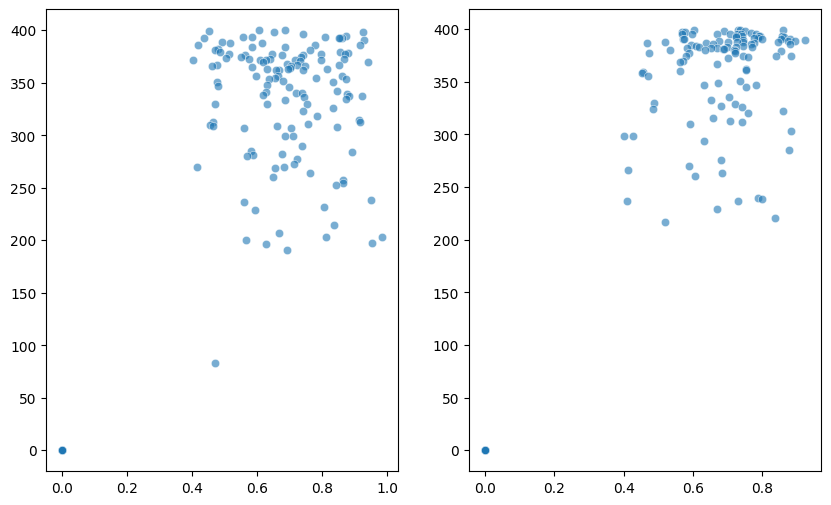

In [174]:
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(10,6))
ax1.scatter(subject_results['0_accuracy'], subject_results['0_count'], alpha=0.6, edgecolors='w', linewidth=0.5)
ax2.scatter(subject_results['1_accuracy'], subject_results['1_count'], alpha=0.6, edgecolors='w', linewidth=0.5)


In [18]:
len(subject_results)

4

In [58]:
selected_str  = [str(s) for s in selected]

0_0 252
0_1 252
1_0 252
1_1 252


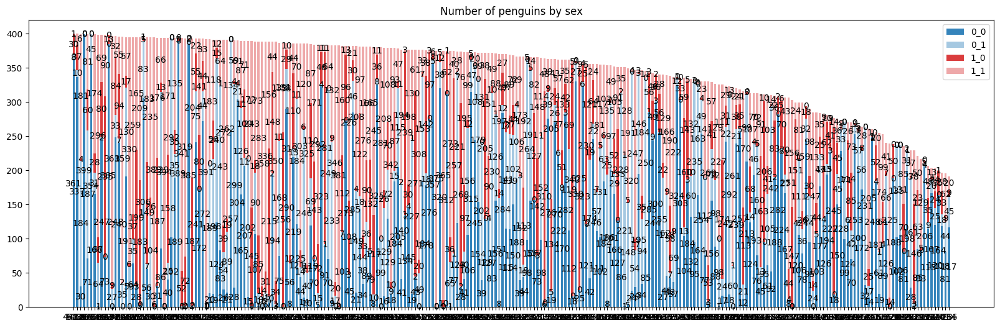

In [73]:
width = 0.6  # the width of the bars: can also be len(x) sequence


fig, ax = plt.subplots(figsize=(20, 6))
bottom = np.zeros(len(selected_str))
colors = [to_rgba("tab:blue", 0.9),to_rgba("tab:blue", 0.4),to_rgba("tab:red", 0.9),to_rgba("tab:red", 0.4) ]
for subject, count in subject_results.items():
    print(subject,len(count))
    p = ax.bar(selected_str, count, width, label=str(subject), bottom=bottom, color=colors.pop(0))
    bottom += count

    ax.bar_label(p, label_type='center')

ax.set_title('Number of penguins by sex')
ax.legend()

plt.show()

In [36]:
df_subject_results.head()

,0_0,0_1,0_2,1_0,1_1,1_2,2_0,2_1,2_2
4426,361,8,0,30,1,0,0,0,0
5035,337,10,0,37,16,0,0,0,0
60226,30,184,0,4,181,0,0,0,0
8167,399,0,0,0,0,0,0,0,0
68703,71,187,0,60,81,0,0,0,0


In [37]:
df_subject_results_norm = df_subject_results.div(df_subject_results.sum(axis=1), axis=0)
df_subject_results_norm.head()

,0_0,0_1,0_2,1_0,1_1,1_2,2_0,2_1,2_2
4426,0.902500,0.020000,0.0,0.075000,0.002500,0.0,0.0,0.0,0.0
5035,0.842500,0.025000,0.0,0.092500,0.040000,0.0,0.0,0.0,0.0
60226,0.075188,0.461153,0.0,0.010025,0.453634,0.0,0.0,0.0,0.0
8167,1.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0
68703,0.177945,0.468672,0.0,0.150376,0.203008,0.0,0.0,0.0,0.0


In [38]:
# swap 3rd column and 4th column
df_subject_results_norm = df_subject_results_norm[[ '0_0', '0_1', '1_1', '1_0']]

In [ ]:
df_subject_results_norm

In [39]:
df_subject_results_norm.head()

,0_0,0_1,1_1,1_0
4426,0.902500,0.020000,0.002500,0.075000
5035,0.842500,0.025000,0.040000,0.092500
60226,0.075188,0.461153,0.453634,0.010025
8167,1.000000,0.000000,0.000000,0.000000
68703,0.177945,0.468672,0.203008,0.150376


In [44]:
selected_df['subject'].value_counts()

subject
5035     400
4426     400
4795     399
86068    399
60226    399
        ... 
3246     203
5049     200
1523     197
4434     196
266      191
Name: count, Length: 252, dtype: int64

In [46]:
df_subject_results_norm.shape

(252, 4)

In [52]:
df = selected_df.groupby('subject')['sbp'].mean()
df_subject_results_norm['mean_sbp'] = df.loc[df_subject_results_norm.index.astype(int)].values

In [54]:
df_subject_results_norm = df_subject_results_norm.sort_values(by='mean_sbp')

In [56]:
count = df_subject_results_norm.values

In [74]:
df_subject_results_norm.columns

Index(['0_0', '0_1', '1_1', '1_0', 'mean_sbp'], dtype='object')

In [117]:
df_subject_results_norm['accuracy'] = (df_subject_results_norm['0_0'] + df_subject_results_norm['1_1'])
df_subject_results_norm['accuracy'] = (df_subject_results_norm['accuracy']*100).map("{:.1f}".format)

In [115]:
df_subject_results_norm['0_0']

4536     0.940520
8167     1.000000
42141    0.285285
5172     0.068966
7472     0.447257
           ...   
51805    0.000000
76899    0.000000
27845    0.000000
76896    0.002571
69215    0.000000
Name: 0_0, Length: 252, dtype: float64

0_0
0_0 252
0_1
0_1 252
1_1
1_1 252
1_0
1_0 252
mean_sbp
skip mean_sbp


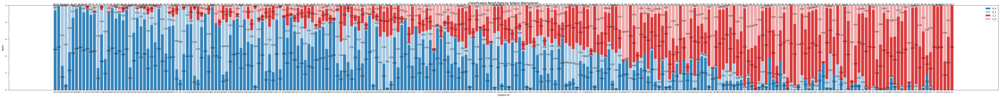

In [ ]:
width = 0.8
from matplotlib.colors import to_rgba
fig, ax,ax2 = plt.subplots(2,1,figsize=(60, 6))

bottom = np.zeros(len(df_subject_results_norm))
colors = [to_rgba("tab:blue", 0.9),to_rgba("tab:blue", 0.4),to_rgba("tab:red", 0.9),to_rgba("tab:red", 0.4) ]
for subject in df_subject_results_norm.columns:
    print(subject)
    if subject == 'mean_sbp':
        print("skip mean_sbp")
        break
    count = df_subject_results_norm[subject].values
    print(subject,len(count))
    p = ax.bar(selected_str, count, width, label=str(subject), bottom=bottom, color=colors.pop(0))
    count_str = [f"{c:.2f}" if c > 0.005 else "" for c in count]
    for i,v in enumerate(count_str):
        if v != "":
            ax.annotate(v, xy=(i, bottom[i]+count[i]/2),size='small',ha='center')
    bottom += count
# ax.bar_label(p, label_type='center', fmt='%.2f',fontsize=6)
plt.tick_params(labelsize=6)
ax.bar_label(p,labels=df_subject_results_norm['accuracy'], label_type='edge',fontsize=8)
ax.set_title('Classification Result Ratio by Subject (Normalized)')
ax.legend()
ax.set_ylabel('Ratio')
ax.set_xlabel('Subject ID')
ax2.plot
plt.tight_layout()
plt.show()

### 3class

In [32]:
v = test_df['subject'].value_counts()
# print subjects with less than 3 samples
selected = v[v>180].index.tolist()
selected_df = test_df[test_df['subject'].isin(selected)]
len(selected), selected_df.shape

(252, (87507, 103))

In [26]:
selected_X = selected_df.drop(['signal_index', 'sbp', 'subject', 'dbp','sbp_class',"sbp_bin","bp_class"],axis=1,errors='ignore')
selected_Y = selected_df['sbp_class']
y_pred_selected = np.argmax(model.predict(selected_X), axis=1).astype(int)  
y_pred_selected

array([0, 1, 0, ..., 2, 0, 2])

In [27]:
result_df.head()

NameError: name 'result_df' is not defined

In [25]:

# 予測済みデータをまとめたDataFrameを作成
result_df = selected_df[['subject', 'sbp_class']].copy()
result_df['pred'] = y_pred_selected

# 集計用辞書: subjectごとに (gt,pred) → count
subject_list = [str(int(s)) for s in selected]
subject_results = {"0_0":[0 for _ in range(len(subject_list))],
                   "0_1":[0 for _ in range(len(subject_list))],
                   "0_2":[0 for _ in range(len(subject_list))],
                   "1_0":[0 for _ in range(len(subject_list))],
                   "1_1":[0 for _ in range(len(subject_list))],
                   "1_2":[0 for _ in range(len(subject_list))],
                   "2_0":[0 for _ in range(len(subject_list))],
                   "2_1":[0 for _ in range(len(subject_list))],
                   "2_2":[0 for _ in range(len(subject_list))],
                   }
# カウント処理
for _, row in result_df.iterrows():
    idx = subject_list.index(str(int(row['subject'])))
    gt = int(row['sbp_class'])
    pred = int(row['pred'])
    subject_results[str(gt) + "_" + str(pred)][idx] += 1

# dictに変換
df_subject_results = pd.DataFrame(subject_results,index=subject_list)
df_subject_results.head()

,0_0,0_1,0_2,1_0,1_1,1_2,2_0,2_1,2_2
4426,361,8,0,30,1,0,0,0,0
5035,337,10,0,37,16,0,0,0,0
60226,30,184,0,4,181,0,0,0,0
8167,399,0,0,0,0,0,0,0,0
68703,71,187,0,60,81,0,0,0,0


In [26]:
df_subject_results_norm = df_subject_results.div(df_subject_results.sum(axis=1), axis=0)
df_subject_results_norm.head()

,0_0,0_1,0_2,1_0,1_1,1_2,2_0,2_1,2_2
4426,0.902500,0.020000,0.0,0.075000,0.002500,0.0,0.0,0.0,0.0
5035,0.842500,0.025000,0.0,0.092500,0.040000,0.0,0.0,0.0,0.0
60226,0.075188,0.461153,0.0,0.010025,0.453634,0.0,0.0,0.0,0.0
8167,1.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0
68703,0.177945,0.468672,0.0,0.150376,0.203008,0.0,0.0,0.0,0.0


In [32]:
def macro_f1_from_ratio(df_ratio,classes=3):
    f1_scores = []
    for row in df_ratio.itertuples():
        row = np.array(row[1:])  # Convert to numpy array
        tmp_scores = []
        for j in range(classes):
            tp = row[classes*(j)+j]  # diagonal element
            fp = row[classes*j:classes*(j+1)].sum() - tp
            fn = row[np.arange(j, classes*classes, classes)].sum() - tp
            if tp + fp == 0 or tp + fn == 0:
                f1 = 0.0
            else:
                precision = tp / (tp + fp)
                recall = tp / (tp + fn)
                if precision + recall == 0:
                    f1 = 0.0
                else:
                    f1 = 2 * (precision * recall) / (precision + recall)
            tmp_scores.append(f1)
        f1_scores.append(np.mean(tmp_scores))
    return f1_scores

In [33]:
def accuracy_from_ratio(df_ratio,classes=3):
    accuracy_scores = []
    for row in df_ratio.itertuples():
        row = np.array(row[1:])  # Convert to numpy array
        tp = np.array([row[classes*(j)+j] for j in range(classes)]).sum()  # diagonal elementtp
        accuracy_scores.append(tp)
    return accuracy_scores

In [133]:
classes = 4
[classes*(j)+j+1 for j in range(classes)]

[1, 6, 11, 16]

In [34]:
accuracy_scores = accuracy_from_ratio(df_subject_results_norm,classes=3)
accuracy_formatted = [f"{acc:.2f}" for acc in accuracy_scores]
accuracy_scores

[0.8050632911392405,
 1.0,
 0.4005102040816327,
 0.1524547803617571,
 0.7313829787234043,
 0.9433962264150944,
 0.36141304347826086,
 0.6198347107438016,
 0.5552407932011332,
 0.811965811965812,
 0.8493975903614458,
 0.6024096385542168,
 0.05438066465256798,
 0.5957446808510638,
 0.5792682926829269,
 0.4875,
 0.4968553459119497,
 0.6709677419354838,
 0.4816053511705685,
 0.7575757575757576,
 0.5714285714285715,
 0.30103806228373703,
 0.34375,
 0.29020979020979026,
 0.5929824561403508,
 0.9859154929577465,
 0.4840989399293286,
 0.34397163120567376,
 0.425,
 0.3870967741935484,
 0.6845878136200717,
 0.27697841726618705,
 0.21299638989169675,
 0.6086956521739131,
 0.5090909090909091,
 0.7700729927007299,
 0.029197080291970802,
 0.3394833948339483,
 0.6925925925925925,
 0.6555555555555556,
 0.7509293680297398,
 0.6940298507462687,
 0.5767790262172284,
 0.599250936329588,
 0.8007518796992481,
 0.30566037735849055,
 0.844106463878327,
 0.5551330798479088,
 0.5954198473282442,
 0.379310344827

In [137]:
f1 = macro_f1_from_ratio(df_subject_results_norm,classes=3)
f1

[0.2822465625728268,
 0.24870518052591514,
 0.40384610952190964,
 0.11401481953629193,
 0.2879971464241127,
 0.2915848944394885,
 0.2674501527383226,
 0.4783641045720885,
 0.3089777634720099,
 0.2732461622915799,
 0.31966283028043446,
 0.3288878671233173,
 0.0695108984582669,
 0.29350375234521575,
 0.4047302894304119,
 0.32008636788048556,
 0.24330038540564858,
 0.3209340792654147,
 0.28548435131962063,
 0.45255755422311056,
 0.25272280898321003,
 0.4227367870536951,
 0.3791659021109152,
 0.28502628324056895,
 0.15697822100637884,
 0.33274544385655497,
 0.22305616707286624,
 0.30964225822669844,
 0.48799955872931006,
 0.2992894655545258,
 0.39796905222437134,
 0.23845873166833495,
 0.22547008547008543,
 0.2645899023287522,
 0.16711245801957017,
 0.30989583333333337,
 0.029209714934819064,
 0.4300159232375871,
 0.3200815494393476,
 0.3450409591112049,
 0.43145564168819983,
 0.6385254254149291,
 0.3562162032923967,
 0.40924454459203036,
 0.3216601815823606,
 0.2690614096259441,
 0.330134

In [147]:
f1_formatted =[f"{score*100:.1f}" for score in f1]
f1_formatted

['28.2',
 '24.9',
 '40.4',
 '11.4',
 '28.8',
 '29.2',
 '26.7',
 '47.8',
 '30.9',
 '27.3',
 '32.0',
 '32.9',
 '7.0',
 '29.4',
 '40.5',
 '32.0',
 '24.3',
 '32.1',
 '28.5',
 '45.3',
 '25.3',
 '42.3',
 '37.9',
 '28.5',
 '15.7',
 '33.3',
 '22.3',
 '31.0',
 '48.8',
 '29.9',
 '39.8',
 '23.8',
 '22.5',
 '26.5',
 '16.7',
 '31.0',
 '2.9',
 '43.0',
 '32.0',
 '34.5',
 '43.1',
 '63.9',
 '35.6',
 '40.9',
 '32.2',
 '26.9',
 '33.0',
 '46.7',
 '63.6',
 '22.7',
 '37.6',
 '33.0',
 '13.0',
 '47.0',
 '41.2',
 '53.1',
 '39.8',
 '23.2',
 '47.5',
 '52.2',
 '24.9',
 '74.1',
 '31.6',
 '50.9',
 '15.0',
 '37.4',
 '36.0',
 '58.4',
 '12.8',
 '25.7',
 '26.0',
 '61.3',
 '21.2',
 '13.9',
 '67.1',
 '30.2',
 '53.2',
 '27.4',
 '32.6',
 '34.4',
 '38.8',
 '35.4',
 '33.7',
 '40.0',
 '48.6',
 '43.9',
 '19.5',
 '48.0',
 '40.7',
 '34.9',
 '48.2',
 '9.7',
 '68.9',
 '53.1',
 '39.4',
 '32.4',
 '22.8',
 '45.0',
 '40.9',
 '28.5',
 '51.4',
 '17.3',
 '24.0',
 '24.7',
 '46.0',
 '68.9',
 '47.7',
 '46.2',
 '46.0',
 '49.8',
 '23.2',
 '54

0_0 166
0_1 166
0_2 166
1_0 166
1_1 166
1_2 166
2_0 166
2_1 166
2_2 166


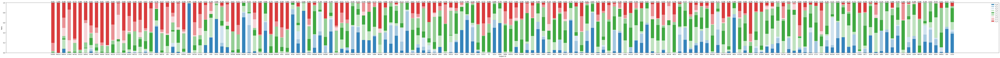

In [38]:
width = 0.6
from matplotlib.colors import to_rgba
fig, ax = plt.subplots(figsize=(100, 6))
bottom = np.zeros(len(df_subject_results_norm))
colors = [to_rgba("tab:blue", 0.9),to_rgba("tab:blue", 0.4),to_rgba("tab:blue", 0.2) ,to_rgba("tab:green", 0.3),to_rgba("tab:green", 0.9),to_rgba("tab:green", 0.5),to_rgba("tab:red", 0.2),to_rgba("tab:red", 0.5),to_rgba("tab:red", 0.9),]
for subject in df_subject_results_norm.columns:
    count = df_subject_results_norm[subject].values
    print(subject,len(count))
    p = ax.bar(subject_list, count, width, label=str(subject), bottom=bottom, color=colors.pop(0))
    bottom += count


ax.bar_label(p,labels=accuracy_formatted, label_type='edge', fmt='%.2f',fontsize=12)
# ax.set_title('Classification Result Ratio by Subject (Normalized)')
ax.legend()
ax.set_ylabel('Ratio')
ax.set_xlabel('Subject ID')
plt.tight_layout()
plt.show()

# accuracy from 

In [13]:
test_X.shape

(26004, 98)

In [15]:
correct = np.zeros((test_X.shape[0],5), dtype=bool)
for f in range(5):
    correct[:,f] = (results[f]['pred_test'] == test_Y.values)

(0.0, 5000.0)

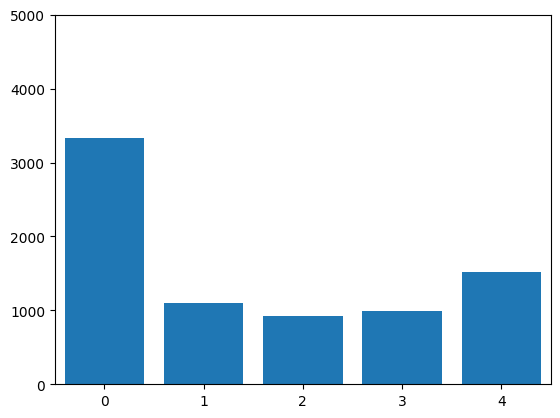

In [19]:
correct_count = correct.sum(axis=1)
plt.hist(correct_count, bins=np.arange(-0.5,6.5,1), rwidth=0.8)
plt.xlim(-0.5,4.5)
plt.ylim(0,5000)

In [24]:
zero_idx = np.where(correct_count==0)[0]
test_good = test_df.iloc[np.where(correct_count>=5)[0]]
test_bad = test_df.iloc[zero_idx]
test_good.shape, test_bad.shape

((18138, 104), (3329, 104))

count    18138.000000
mean       124.098999
std         32.810803
min         28.755856
25%         92.032639
50%        141.238421
75%        151.895939
max        245.337198
Name: sbp, dtype: float64

In [31]:
test_X.columns.tolist()

['Tc',
 'Ts',
 'Td',
 'Tsteepest',
 'Steepest',
 'TNegSteepest',
 'NegSteepest',
 'TdiaRise',
 'DiaRise',
 'SteepDiaRise',
 'TSystoDiaRise',
 'TdiaToEnd',
 'Ratio',
 'Ts_norm',
 'Td_norm',
 'Tsteepest_norm',
 'TNegSteepest_norm',
 'TdiaRise_norm',
 'TSystoDiaRise_norm',
 'TdiaToEnd_norm',
 'SW25',
 'SW25_norm',
 'DW25',
 'DW25_norm',
 'SWaddDW25',
 'SWaddDW25_norm',
 'DWdivSW25',
 'SW50',
 'SW50_norm',
 'DW50',
 'DW50_norm',
 'SWaddDW50',
 'SWaddDW50_norm',
 'DWdivSW50',
 'SW75',
 'SW75_norm',
 'DW75',
 'DW75_norm',
 'SWaddDW75',
 'SWaddDW75_norm',
 'DWdivSW75',
 'S1',
 'S2',
 'S3',
 'S4',
 'AUCsys',
 'AUCdia',
 'S1_norm',
 'S2_norm',
 'S3_norm',
 'S4_norm',
 'AUCsys_norm',
 'AUCdia_norm',
 'SQI_skew',
 'SQI_kurtosis',
 'apg_a',
 'apg_b',
 'apg_c',
 'apg_d',
 'apg_e',
 'ppg_a',
 'ppg_b',
 'ppg_c',
 'ppg_d',
 'ppg_e',
 'ratio_apg_b',
 'ratio_apg_c',
 'ratio_apg_d',
 'ratio_apg_e',
 'ratio_ppg_b',
 'ratio_ppg_c',
 'ratio_ppg_d',
 'ratio_ppg_e',
 'T_a',
 'T_b',
 'T_c',
 'T_d',
 'T_e',
 'T

In [33]:
test_good[["SQI_skew", "SQI_kurtosis"]].describe()

,SQI_skew,SQI_kurtosis
count,18138.000000,18138.000000
mean,0.719332,0.465030
std,0.326097,0.092248
min,-0.066102,0.155182
25%,0.476978,0.402909
50%,0.690430,0.475645
75%,0.918016,0.536890
max,2.119945,0.723167


In [32]:
test_bad[["SQI_skew", "SQI_kurtosis"]].describe()

,SQI_skew,SQI_kurtosis
count,3329.000000,3329.000000
mean,0.738469,0.455092
std,0.263322,0.077838
min,-0.045700,0.224615
25%,0.549885,0.396204
50%,0.758534,0.450053
75%,0.931896,0.516133
max,1.629675,0.636704


In [28]:
test_bad['subject'].value_counts().tolist()

[224,
 179,
 107,
 101,
 99,
 95,
 90,
 78,
 66,
 65,
 62,
 62,
 61,
 57,
 56,
 55,
 53,
 53,
 52,
 52,
 51,
 48,
 47,
 47,
 42,
 40,
 39,
 35,
 35,
 31,
 31,
 29,
 29,
 27,
 27,
 27,
 26,
 23,
 22,
 21,
 20,
 20,
 19,
 18,
 16,
 16,
 16,
 16,
 16,
 15,
 15,
 15,
 15,
 15,
 14,
 14,
 14,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 12,
 12,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 9,
 9,
 9,
 9,
 9,
 8,
 8,
 8,
 8,
 8,
 8,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1]

In [49]:
# count good and bad per subject
for f in range(6):
    test_df[f'c_{f}'] = (correct_count == f).astype(int)
subject_stats = test_df.groupby('subject')[[f'c_{f}' for f in range(6)]].agg(['sum'])
subject_stats['c_total'] = subject_stats.sum(axis=1)
subject_stats = subject_stats.sort_values(by='c_total', ascending=False)
subject_stats['mean_sbp'] = test_df.groupby('subject')['sbp'].mean().loc[subject_stats.index]
subject_stats["std_sbp"] = test_df.groupby('subject')['sbp'].std().loc[subject_stats.index]

In [50]:
pd.set_option('display.max_columns', 300)
pd.set_option('display.max_rows', 500)
subject_stats

,c_0,c_1,c_2,c_3,c_4,c_5,c_total,mean_sbp,std_sbp
,sum,sum,sum,sum,sum,sum,,,
subject,,,,,,,,,
69215,0,0,0,0,1,393,394,169.597597,4.312158
51805,1,0,0,1,9,372,383,155.127036,5.039213
27845,101,57,45,43,39,94,379,155.069055,8.050315
25225,0,0,0,0,0,351,351,155.283881,7.423053
44781,1,4,7,2,18,271,303,152.269741,8.788521
76899,0,0,1,4,4,292,301,159.520605,13.062307
18642,90,43,26,29,43,61,292,158.814173,9.075820
50634,52,28,22,41,43,106,292,160.578821,30.247771


In [ ]:
feature_importa

## 1-NN

In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# ---- Load ----
train_df = pd.read_parquet(
    r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\Downsampled\train_features.parquet'
).drop('Unnamed: 0', axis=1, errors='ignore')

test_df = pd.read_parquet(
    r'F:\minowa\BloodPressureEstimation\data\processed\PulseDB\ppg_features_pulsedb_test_all.parquet'
).drop('Unnamed: 0', axis=1, errors='ignore')

# ---- Add class ----
train_df.drop(['sbp_bin'], axis=1, errors='ignore', inplace=True)
train_df = add_bp_class(train_df)
test_df = add_bp_class(test_df)

# ---- Missing value handling ----
# fill NA with median per subject
train_df = train_df.groupby('subject').apply(lambda g: g.fillna(g.median()))
train_df = train_df.reset_index(drop=True)

# fill NA with train medians
train_medians = train_df.median(numeric_only=True)
train_df = train_df.fillna(train_medians)
test_df = test_df.fillna(train_medians)

# # ---- Separate columns that we do NOT want to scale ----
# non_scale_cols = ['signal_index', 'sbp', 'subject', 'dbp', 'bp_class']

# train_tmp = train_df[non_scale_cols].copy()
# test_tmp = test_df[non_scale_cols].copy()

# # ---- Apply StandardScaler ONLY to numeric features ----
# scale_cols = [c for c in train_df.columns if c not in non_scale_cols]

# scaler = StandardScaler()

# # transform → DataFrameに戻す
# scaled_train = pd.DataFrame(
#     scaler.fit_transform(train_df[scale_cols]),
#     columns=scale_cols,
#     index=train_df.index
# )

# scaled_test = pd.DataFrame(
#     scaler.transform(test_df[scale_cols]),
#     columns=scale_cols,
#     index=test_df.index
# )

# # ---- Combine back ----
# train_df = pd.concat([train_tmp, scaled_train], axis=1)
# test_df  = pd.concat([test_tmp,  scaled_test], axis=1)

# ---- Sampling ----
df_sub = train_df.sample(n=50000, random_state=0)


In [27]:
train_df.isna().sum().sum()
# limit to columns with na
train_df_na = train_df.loc[:, train_df.isna().any()]
# where are na in train_df
train_df_na = train_df_na[train_df_na.isna().any(axis=1)]
train_df_na

,bd
245283,NaN
254239,NaN
254240,NaN
254241,NaN
254242,NaN
...,...
330835,NaN
330836,NaN
330837,NaN
330838,NaN


In [32]:
test_Y.unique()

array([0, 2, 1])

In [17]:
df_sub.shape

(50000, 105)

In [43]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
import numpy as np
results = []
folds = get_groupkf(df_sub,k=5, group_col='subject',y_col='bp_class', random_state=42,get_holdout=False, return_raw_train=True)
for f in range(5):
    model = KNeighborsClassifier(n_neighbors=1)
    _train,_val = folds[f]
    train_X, train_Y = _train
    val_X, val_Y = _val
    model.fit(train_X, train_Y)
        # --- 予測 ---
    pred_Y_prob_train = model.predict_proba(train_X)
    pred_Y_prob = model.predict_proba(test_X)
    pred_Y_prob_val = model.predict_proba(val_X)
    pred_Y_test = np.argmax(pred_Y_prob, axis=1) if test_Y.nunique() > 2 else (pred_Y_prob >= 0.5).astype(int)
    pred_Y_val = np.argmax(pred_Y_prob_val, axis=1) if val_Y.nunique() > 2 else (pred_Y_prob_val >= 0.5).astype(int)
    pred_Y_train = np.argmax(pred_Y_prob_train, axis=1) if train_Y.nunique() > 2 else (pred_Y_prob_train >= 0.5).astype(int)
    # --- 評価 ---
    acc = accuracy_score(test_Y, pred_Y_test)
    pre = precision_score(test_Y, pred_Y_test, average='macro')
    rec = recall_score(test_Y, pred_Y_test, average='macro')
    cm = confusion_matrix(test_Y, pred_Y_test)
    f1 = f1_score(test_Y, pred_Y_test,average='macro')
    f1_train = f1_score(train_Y, pred_Y_train,average='macro')
    f1_val = f1_score(val_Y, pred_Y_val,average='macro')
    print(f"Fold {f} - Train F1: {f1_train:.4f}, Val F1: {f1_val:.4f}, Test F1: {f1:.4f}")
    # --- 結果保存 ---
    res = {"accuracy" :acc,
           "f1":f1,
           "f1_train":f1_train,
           "f1_val":f1_val,
           "precision": pre,
           "recall": rec,
           "cm":cm,
           "fold":f,
           "pred_test_prob":pred_Y_prob,
           "pred_val_prob":pred_Y_prob_val,
           "pred_test":pred_Y_test,
           "pred_val":pred_Y_val,
           "true":test_Y
           } 
    results.append(res)
    print(f"Fold {f} - F1: {f1:.4f}, Accuracy: {acc:.4f}, Precision: {pre:.4f}, Recall: {rec:.4f}") 
print( "F1 train mean:", f"{np.mean([results[f]['f1_train'] for f in range(5)])*100:.1f}%", "F1 val mean:", f"{np.mean([results[f]['f1_val'] for f in range(5)])*100:.1f}%", "F1 test mean:", f"{np.mean([results[f]['f1'] for f in range(5)])*100:.1f}%")
    

set()
set()
set()
set()
set()
Fold 0 - Train F1: 1.0000, Val F1: 0.4097, Test F1: 0.3053
Fold 0 - F1: 0.3053, Accuracy: 0.4521, Precision: 0.2991, Recall: 0.3252
Fold 1 - Train F1: 1.0000, Val F1: 0.4067, Test F1: 0.3065
Fold 1 - F1: 0.3065, Accuracy: 0.4173, Precision: 0.3048, Recall: 0.3128
Fold 2 - Train F1: 1.0000, Val F1: 0.4172, Test F1: 0.3024
Fold 2 - F1: 0.3024, Accuracy: 0.4481, Precision: 0.2867, Recall: 0.3229
Fold 3 - Train F1: 1.0000, Val F1: 0.4177, Test F1: 0.3121
Fold 3 - F1: 0.3121, Accuracy: 0.4355, Precision: 0.3227, Recall: 0.3276
Fold 4 - Train F1: 1.0000, Val F1: 0.4138, Test F1: 0.3346
Fold 4 - F1: 0.3346, Accuracy: 0.4431, Precision: 0.3362, Recall: 0.3366
F1 train mean: 100.0% F1 val mean: 41.3% F1 test mean: 31.2%


In [48]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, f1_score
import numpy as np

results = []

folds = get_groupkf(df_sub, k=5, group_col='subject', y_col='bp_class',
                    random_state=42, get_holdout=False, return_raw_train=True,remove_cols=False)

for f in range(5):
    # --- データ読み出し ---
    _train, _val = folds[f]
    train_X, train_Y = _train
    val_X, val_Y = _val
    # fill NA with median per subject
    train_X = train_X.groupby('subject').apply(lambda g: g.fillna(g.median()))
    train_X = train_X.reset_index(drop=True)

    # fill NA with train medians
    train_medians = train_X.median(numeric_only=True)
    train_X= train_X.fillna(train_medians)
    val_X = val_X.fillna(train_medians)
    test_X, test_Y = get_dataset(test_df, return_raw=True,y_col='bp_class', remove_cols=['signal_index', 'sbp', 'subject', 'dbp','bp_class'])
    test_X = test_X.fillna(train_medians)
    train_X = train_X.drop(['signal_index', 'sbp', 'subject', 'dbp','bp_class'],axis=1,errors='ignore')
    val_X = val_X.drop(['signal_index', 'sbp', 'subject', 'dbp','bp_class'],axis=1,errors='ignore')
    test_X = test_X.drop(['signal_index', 'sbp', 'subject', 'dbp','bp_class'],axis=1,errors='ignore')
    # ============================
    # ① scaler を fold ごとに作成
    #    fit は train_X のみ
    # ============================
    scaler = StandardScaler()
    scaler.fit(train_X)        # ← ここが超重要（train のみ）

    # transform
    train_X_scaled = scaler.transform(train_X)
    val_X_scaled = scaler.transform(val_X)
    test_X_scaled = scaler.transform(test_X)    # ← test に train の scaler を適用

    # ============================
    # ② モデル学習（1-NN）
    # ============================
    model = KNeighborsClassifier(n_neighbors=1)
    model.fit(train_X_scaled, train_Y)

    # --- 予測 ---
    pred_train = model.predict(train_X_scaled)
    pred_val = model.predict(val_X_scaled)
    pred_test = model.predict(test_X_scaled)

    # 必要なら確率も
    pred_train_prob = model.predict_proba(train_X_scaled)
    pred_val_prob = model.predict_proba(val_X_scaled)
    pred_test_prob = model.predict_proba(test_X_scaled)

    # ============================
    # ③ 評価
    # ============================
    f1_train = f1_score(train_Y, pred_train, average='macro')
    f1_val = f1_score(val_Y, pred_val, average='macro')
    f1_test = f1_score(test_Y, pred_test, average='macro')

    acc = accuracy_score(test_Y, pred_test)
    pre = precision_score(test_Y, pred_test, average='macro')
    rec = recall_score(test_Y, pred_test, average='macro')
    cm = confusion_matrix(test_Y, pred_test)

    print(f"Fold {f} - Train F1: {f1_train:.4f}, Val F1: {f1_val:.4f}, Test F1: {f1_test:.4f}")

    # 保存
    res = {
        "accuracy": acc,
        "f1": f1_test,
        "f1_train": f1_train,
        "f1_val": f1_val,
        "precision": pre,
        "recall": rec,
        "cm": cm,
        "fold": f,
        "pred_test_prob": pred_test_prob,
        "pred_val_prob": pred_val_prob,
        "pred_test": pred_test,
        "pred_val": pred_val,
        "true": test_Y
    }
    results.append(res)

print(
    "F1 train mean:", f"{np.mean([r['f1_train'] for r in results])*100:.1f}%",
    "F1 val mean:", f"{np.mean([r['f1_val'] for r in results])*100:.1f}%",
    "F1 test mean:", f"{np.mean([r['f1'] for r in results])*100:.1f}%"
)


set()
set()
set()
set()
set()
Fold 0 - Train F1: 1.0000, Val F1: 0.3253, Test F1: 0.3313
Fold 1 - Train F1: 1.0000, Val F1: 0.3312, Test F1: 0.3302
Fold 2 - Train F1: 1.0000, Val F1: 0.3319, Test F1: 0.3321
Fold 3 - Train F1: 1.0000, Val F1: 0.3340, Test F1: 0.3259
Fold 4 - Train F1: 1.0000, Val F1: 0.3264, Test F1: 0.3294
F1 train mean: 100.0% F1 val mean: 33.0% F1 test mean: 33.0%
